# A Comparative Analysis of Machine Learning and Time Series Techniques for Analysing Climate Trends in Ireland 📈🌧️

# Initial Observations

In [1]:
#import libraires 
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
from statsmodels.tsa.seasonal import STL
from sklearn.cluster import KMeans
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from xgboost import XGBRegressor
import plotly.express as px
import pymannkendall as mk
from statsmodels.tsa.stattools import adfuller, kpss
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA
from statsmodels.stats.stattools import durbin_watson
from scipy.stats import linregress
from scipy.fft import fft
from scipy.stats import ttest_ind
from pymannkendall import original_test
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import shap
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import itertools
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import statsmodels.api as sm

In [2]:
#read in dataset
climate_data = pd.read_csv("hly532.csv", skiprows=23)

C:\Users\a-ldrumm\AppData\Local\Temp\ipykernel_3456\259222932.py:2: DtypeWarning: Columns (8,9,14,18,19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  climate_data = pd.read_csv("hly532.csv", skiprows=23)


In [3]:
#inspect rows and columns
climate_data.tail()

,date,ind,rain,ind.1,temp,ind.2,wetb,dewpt,vappr,rhum,...,ind.3,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt
709316,30-nov-2024 20:00,0,0.0,0,13.4,0,12.4,11.6,13.6,88,...,2,17,2,160,2,11,0.0,25000,21,7
709317,30-nov-2024 21:00,0,0.3,0,12.8,0,12.4,12.0,14.1,95,...,2,13,2,150,58,65,0.0,8000,18,7
709318,30-nov-2024 22:00,0,0.1,0,14.0,0,12.7,11.6,13.6,85,...,2,9,2,150,58,65,0.0,8000,18,7
709319,30-nov-2024 23:00,2,0.0,0,13.9,0,12.4,11.1,13.2,83,...,2,7,2,170,21,65,0.0,20000,18,7
709320,01-dec-2024 00:00,2,0.0,0,13.8,0,12.2,10.8,12.9,82,...,2,11,2,180,20,65,0.0,20000,18,7


In [4]:
#check no of rows and columns
climate_data.shape

(709321, 21)

In [5]:
#check for null values and data types
climate_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 709321 entries, 0 to 709320
Data columns (total 21 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    709321 non-null  object 
 1   ind     709321 non-null  int64  
 2   rain    709321 non-null  float64
 3   ind.1   709321 non-null  int64  
 4   temp    709321 non-null  float64
 5   ind.2   709321 non-null  int64  
 6   wetb    709321 non-null  float64
 7   dewpt   709321 non-null  float64
 8   vappr   709321 non-null  object 
 9   rhum    709321 non-null  object 
 10  msl     709321 non-null  float64
 11  ind.3   709321 non-null  int64  
 12  wdsp    709321 non-null  int64  
 13  ind.4   709321 non-null  int64  
 14  wddir   709321 non-null  object 
 15  ww      709321 non-null  int64  
 16  w       709321 non-null  int64  
 17  sun     709321 non-null  float64
 18  vis     709321 non-null  object 
 19  clht    709321 non-null  object 
 20  clamt   709321 non-null  object 
dtypes: float64

In [6]:
#ensure data is in datetime format
climate_data['date'] = pd.to_datetime(climate_data['date'], format='%d-%b-%Y %H:%M', errors='coerce')

In [7]:
#check
climate_data["date"].head()

0   1944-01-01 00:00:00
1   1944-01-01 01:00:00
2   1944-01-01 02:00:00
3   1944-01-01 03:00:00
4   1944-01-01 04:00:00
Name: date, dtype: datetime64[ns]

In [8]:
#look at statistical properties and distrbution of features
climate_data.describe()

,date,ind,rain,ind.1,temp,ind.2,wetb,dewpt,msl,ind.3,wdsp,ind.4,ww,w,sun
count,709321,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000,709321.000000
mean,1984-06-16 12:00:00,0.632009,0.086533,0.013982,9.647898,0.029004,8.209626,6.590111,1013.596515,1.341171,10.140309,1.341350,15.619485,16.868449,0.167141
min,1944-01-01 00:00:00,0.000000,0.000000,0.000000,-11.500000,0.000000,-11.500000,-17.700000,944.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1964-03-24 18:00:00,0.000000,0.000000,0.000000,6.100000,0.000000,5.000000,3.300000,1006.200000,1.000000,6.000000,1.000000,2.000000,2.000000,0.000000
50%,1984-06-16 12:00:00,0.000000,0.000000,0.000000,9.700000,0.000000,8.400000,6.900000,1014.800000,2.000000,9.000000,2.000000,2.000000,11.000000,0.000000
75%,2004-09-08 06:00:00,2.000000,0.000000,0.000000,13.200000,0.000000,11.600000,10.000000,1022.200000,2.000000,14.000000,2.000000,21.000000,11.000000,0.100000
max,2024-12-01 00:00:00,6.000000,26.500000,2.000000,29.100000,6.000000,22.200000,20.500000,1048.700000,6.000000,46.000000,7.000000,97.000000,99.000000,1.000000
std,NaN,1.100746,0.418556,0.117693,4.885642,0.257144,4.404445,4.591198,12.347222,0.806620,5.699950,0.806665,22.574472,24.067772,0.326438


In [9]:
#no missing values observed, after inspecting metadata key certain rows still need to be dropped

In [10]:
# Analyze value counts for each indicator column
for col in ['ind', 'ind.1', 'ind.2', 'ind.3', 'ind.4']:
    print(f"Value counts for {col}:\n{climate_data[col].value_counts()}\n")


Value counts for ind:
ind
0    525896
2    102397
3     80286
4       576
1       131
6        35
Name: count, dtype: int64

Value counts for ind.1:
ind.1
0    699426
1      9872
2        23
Name: count, dtype: int64

Value counts for ind.2:
ind.2
0    694143
1     13813
5      1338
2        23
6         4
Name: count, dtype: int64

Value counts for ind.3:
ind.3
2    392163
1    166561
0    150507
4        53
6        37
Name: count, dtype: int64

Value counts for ind.4:
ind.4
2    392191
1    166561
0    150461
4        72
6        35
7         1
Name: count, dtype: int64



In [11]:
# Relaxed filtering logic using the provided key as guidance
climate_data = climate_data[
    (climate_data['ind'].isin([0, 2])) &      # Precipitation: Satisfactory or trace precipitation
    (climate_data['ind.1'] == 0) &            # Temperature: Positive
    (climate_data['ind.2'].isin([0, 1, 2])) & # Wet Bulb: Positive, negative, or estimated
    (climate_data['ind.3'].isin([2, 1, 0])) & # Wind Speed: Over 60 minutes or valid
    (climate_data['ind.4'].isin([2, 1, 0]))   # Wind Direction: Over 60 minutes or valid
]



# Treat '999' values in cloud height as missing (refer to key again)
climate_data['clht'] = climate_data['clht'].replace(999, np.nan)


In [12]:
#check new row count
climate_data.shape

(625685, 21)

In [13]:
#view my missing values
# Identify rows with missing values in any column
missing_values_df = climate_data[climate_data.isnull().any(axis=1)]

# Display the first few rows with missing values
missing_values_df.head()

,date,ind,rain,ind.1,temp,ind.2,wetb,dewpt,vappr,rhum,...,ind.3,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt
65,1944-01-03 17:00:00,0,0.0,0,6.0,0,5.2,4.4,8.2,88,...,1,9,1,320,1,1,0.0,30000,NaN,2
66,1944-01-03 18:00:00,0,0.0,0,5.6,0,4.7,3.3,7.9,86,...,1,9,1,320,1,6,0.0,30000,NaN,1
67,1944-01-03 19:00:00,0,0.0,0,4.7,0,3.8,2.7,7.3,86,...,1,9,1,300,1,0,0.0,30000,NaN,0
68,1944-01-03 20:00:00,0,0.0,0,4.3,0,3.4,2.2,7.1,86,...,1,5,1,300,2,0,0.0,30000,NaN,0
69,1944-01-03 21:00:00,0,0.0,0,4.2,0,3.2,1.6,6.9,84,...,1,9,1,320,2,0,0.0,30000,NaN,0


# Clean and Address Missing Values

In [14]:
missing_values_df.shape

(131422, 21)

In [15]:
# Check for non-numeric or problematic values in each column
for col in ['clht', 'temp', 'rain', 'rhum', 'msl']:
    print(f"Unique values in {col}:\n{climate_data[col].unique()}\n")

Unique values in clht:
[12 15 18 19 21 200 23 26 28 29 31 25 27 32 40 42 45 20 11 10 14 8 13 17
 nan 44 68 100 35 22 70 30 48 38 6 5 7 9 33 4 2 3 1 60 55 16 24 41 80 50
 65 47 52 63 62 36 34 0 37 46 58 43 51 39 53 57 90 120 56 54 67 75 49 71
 77 61 72 64 76 78 130 140 81 160 150 85 95 110 180 220 170 190 300 250 59
 93 96 66 73 74 240 230 210 280 235 112 128 350 400 440 '200' '30' '100'
 '999' '24' '25' '23' '40' '38' '22' '90' '80' '35' '18' '15' '10' '32'
 '20' '6' '5' '3' '8' '2' '60' '50' '45' '42' '220' '120' '28' '14' '12'
 '16' '4' '9' '11' '110' '7' '21' '230' '36' '34' '48' '43' '19' '17' '27'
 '150' '13' '26' '33' '37' '1' '46' '250' '70' '180' '44' '240' '140' '29'
 '47' ' ' '130' '31' '49' '300' '170' '59' '99' '102' '160' '0' '55' '39'
 105 168]

Unique values in temp:
[ 7.2  7.5  7.1  7.3  7.7  7.8  8.5  8.9  8.8  9.   8.7  8.4  8.3  8.
  8.1  8.2  7.9  9.3  9.7 10.3 10.   9.9 10.1  9.4  9.5  9.6  9.1 10.2
  9.8 10.4  6.6  6.8  6.9  6.   5.6  4.7  4.3  4.2  3.5  3.1  2.5 

In [16]:
# List of columns to clean
columns_to_clean = ['clht', 'rhum', 'msl']

# convert to numeric
for col in columns_to_clean:
    climate_data[col] = pd.to_numeric(climate_data[col], errors='coerce')


          clht      temp      rain      rhum       msl
clht  1.000000  0.011702 -0.093759 -0.213232  0.049357
temp  0.011702  1.000000 -0.028742 -0.275088  0.118706
rain -0.093759 -0.028742  1.000000  0.215984 -0.188542
rhum -0.213232 -0.275088  0.215984  1.000000 -0.172621
msl   0.049357  0.118706 -0.188542 -0.172621  1.000000


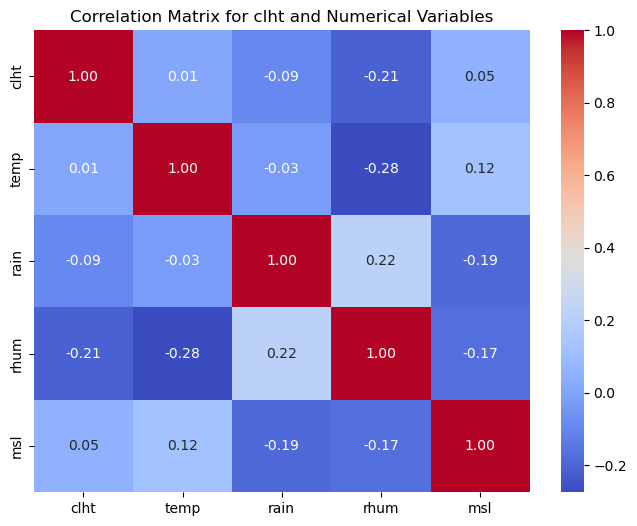

In [17]:
# Calculate the correlation matrix for numerical variables
correlation_matrix = climate_data[['clht', 'temp', 'rain', 'rhum', 'msl']].corr()

# Display the correlation matrix
print(correlation_matrix)

# Visualize correlations with a heatmap to help identify which features could help fill missing values

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for clht and Numerical Variables')
plt.show()


In [18]:
# Create bins for rhum ranges
bins = [0, 30, 50, 70, 90, 100]  
labels = ['Very Low', 'Low', 'Moderate', 'High', 'Very High']  # Label the bins
climate_data['rhum_group'] = pd.cut(climate_data['rhum'], bins=bins, labels=labels, include_lowest=True)

#Group by rhum_group and impute missing values in clht as these values have a correlation identified
climate_data['clht'] = climate_data.groupby('rhum_group')['clht'].transform(
    lambda x: x.fillna(x.median())
)

# Check for remaining NaN values in clht
print(f"Remaining NaN values in clht: {climate_data['clht'].isna().sum()}")

Remaining NaN values in clht: 1


In [19]:
# Fill any remaining NaN values in clht with the overall median
climate_data['clht'].fillna(climate_data['clht'].median(), inplace=True)

In [20]:
# Check for missing values and distribution
print(climate_data['clht'].isna().sum())  
print(climate_data['clht'].describe())   

0
count    625685.000000
mean         59.021910
std         100.175799
min           0.000000
25%          20.000000
50%          35.000000
75%          50.000000
max         999.000000
Name: clht, dtype: float64


# Exploratory Data Analysis 🔎

In [21]:
# Select only key climate variables for readability
key_climate_vars = ["rain", "temp", "wetb", "dewpt", "rhum", "msl", "wdsp", "sun", "clht"]

# Create summary stats
summary_statistics = climate_data[key_climate_vars].describe().T  # Transpose for better readability

# Select relevant metrics
summary_statistics = summary_statistics[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]
summary_statistics.columns = ['Mean', 'Standard Deviation', 'Min', '25th Percentile', 'Median', '75th Percentile', 'Max']

# Display summary statistics
print(summary_statistics)

              Mean  Standard Deviation    Min  25th Percentile  Median  \
rain      0.096901            0.442234    0.0              0.0     0.0   
temp     10.218931            4.589357   -7.7              6.8    10.2   
wetb      8.663477            4.134111   -7.8              5.6     8.8   
dewpt     6.934525            4.402893  -17.7              3.8     7.0   
rhum     80.951832           11.688549   19.0             74.0    83.0   
msl    1013.036915           12.307112  944.1           1005.7  1014.2   
wdsp     10.690788            5.676361    0.0              7.0    10.0   
sun       0.181111            0.336068    0.0              0.0     0.0   
clht     59.021910          100.175799    0.0             20.0    35.0   

       75th Percentile     Max  
rain               0.0    26.5  
temp              13.6    29.1  
wetb              11.8    22.2  
dewpt             10.1    20.5  
rhum              90.0   100.0  
msl             1021.6  1048.7  
wdsp              14.0    46

# Inspect Outliers

In [22]:
# Assign columns to check
measurement_cols = ['rain', 'temp', 'wetb', 'dewpt', 'rhum', 'msl', 'wdsp', 'sun', 'clht']

#Identify outliers using IQR
outliers = {}
for col in measurement_cols:
    Q1 = climate_data[col].quantile(0.25)  # First quartile
    Q3 = climate_data[col].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Find rows where values are outliers
    outliers[col] = climate_data[(climate_data[col] < lower_bound) | (climate_data[col] > upper_bound)]

# Print the number of outliers per column
for col, outlier_data in outliers.items():
    print(f"Column '{col}' has {len(outlier_data)} outliers.")


Column 'rain' has 85285 outliers.
Column 'temp' has 598 outliers.
Column 'wetb' has 129 outliers.
Column 'dewpt' has 883 outliers.
Column 'rhum' has 6000 outliers.
Column 'msl' has 9132 outliers.
Column 'wdsp' has 11196 outliers.
Column 'sun' has 105486 outliers.
Column 'clht' has 93671 outliers.


In [23]:
# Decide how to treat outliers, rain - Check for negative values
negative_rain = climate_data[climate_data['rain'] < 0]
print(f"Number of negative values in 'rain': {len(negative_rain)}")
if len(negative_rain) > 0:
    print("Negative values in 'rain':")
    print(negative_rain)

# Check the maximum value in 'rain'
max_rain = climate_data['rain'].max()
print(f"Maximum value in 'rain': {max_rain}")


Number of negative values in 'rain': 0
Maximum value in 'rain': 26.5


Both of these results show that the outliers detected are reasonable and should be retained

In [24]:
# List of columns to analyze
columns_to_check = ['rain', 'temp', 'wetb', 'dewpt', 'rhum', 'msl', 'wdsp', 'sun', 'clht']

# Loop through each column and check for negative values and maximum value
for col in columns_to_check:
    # Check for negative values
    negative_values = climate_data[climate_data[col] < 0]
    print(f"Number of negative values in '{col}': {len(negative_values)}")
    if len(negative_values) > 0:
        print(f"Negative values in '{col}':")
        print(negative_values)

    # Check the maximum value
    max_value = climate_data[col].max()
    print(f"Maximum value in '{col}': {max_value}\n")


Number of negative values in 'rain': 0
Maximum value in 'rain': 26.5

Number of negative values in 'temp': 1394
Negative values in 'temp':
                      date  ind  rain  ind.1  temp  ind.2  wetb  dewpt vappr  \
1370   1944-02-27 02:00:00    2   0.0      0  -0.5      0  -1.8   -5.0   4.3   
1371   1944-02-27 03:00:00    2   0.0      0  -0.7      0  -2.2   -5.5   4.0   
1372   1944-02-27 04:00:00    2   0.0      0  -0.5      0  -2.0   -5.5   4.0   
1373   1944-02-27 05:00:00    0   0.0      0  -0.6      0  -2.1   -5.5   4.0   
1374   1944-02-27 06:00:00    2   0.0      0  -1.0      0  -2.3   -5.5   4.0   
...                    ...  ...   ...    ...   ...    ...   ...    ...   ...   
166413 1962-12-25 21:00:00    0   0.1      0  -1.0      0  -1.3   -2.2   5.2   
166414 1962-12-25 22:00:00    0   0.1      0  -0.6      0  -1.1   -2.2   5.2   
166415 1962-12-25 23:00:00    2   0.0      0  -0.5      0  -1.1   -2.2   5.2   
166416 1962-12-26 00:00:00    0   0.2      0  -0.4      0  -0

In [25]:
#these outlier values seem realisitic and not due to error so will not drop any outliers

In [26]:
#ensure no nulls in final feature set 
climate_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 625685 entries, 0 to 709320
Data columns (total 22 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   date        625685 non-null  datetime64[ns]
 1   ind         625685 non-null  int64         
 2   rain        625685 non-null  float64       
 3   ind.1       625685 non-null  int64         
 4   temp        625685 non-null  float64       
 5   ind.2       625685 non-null  int64         
 6   wetb        625685 non-null  float64       
 7   dewpt       625685 non-null  float64       
 8   vappr       625685 non-null  object        
 9   rhum        625684 non-null  float64       
 10  msl         625685 non-null  float64       
 11  ind.3       625685 non-null  int64         
 12  wdsp        625685 non-null  int64         
 13  ind.4       625685 non-null  int64         
 14  wddir       625685 non-null  object        
 15  ww          625685 non-null  int64         
 16  w      

In [27]:
#drop unnessecary columns
climate_data = climate_data.drop(columns=['ind', 'ind.1', 'ind.2','ww','w'])

# Feature Engineering

In [28]:
# Extract date components
climate_data['year'] = climate_data['date'].dt.year
climate_data['month'] = climate_data['date'].dt.month
climate_data['day'] = climate_data['date'].dt.day
climate_data['hour'] = climate_data['date'].dt.hour

In [29]:
# Define seasons
def assign_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
#create season column
climate_data['season'] = climate_data['month'].apply(assign_season)

In [30]:
climate_data.head(10)

,date,rain,temp,wetb,dewpt,vappr,rhum,msl,ind.3,wdsp,...,sun,vis,clht,clamt,rhum_group,year,month,day,hour,season
0,1944-01-01 00:00:00,0.0,7.2,6.7,6.1,9.4,93.0,1027.9,1,19,...,0.0,20000,12.0,8,Very High,1944,1,1,0,Winter
1,1944-01-01 01:00:00,0.0,7.2,6.6,6.1,9.3,91.0,1027.6,1,19,...,0.0,30000,15.0,7,Very High,1944,1,1,1,Winter
2,1944-01-01 02:00:00,0.0,7.2,6.6,6.1,9.3,92.0,1027.0,1,19,...,0.0,30000,15.0,8,Very High,1944,1,1,2,Winter
3,1944-01-01 03:00:00,0.0,7.2,6.5,5.5,9.1,90.0,1026.2,1,19,...,0.0,20000,15.0,7,High,1944,1,1,3,Winter
4,1944-01-01 04:00:00,0.0,7.2,6.5,5.5,9.1,89.0,1025.5,1,19,...,0.0,30000,18.0,7,High,1944,1,1,4,Winter
5,1944-01-01 05:00:00,0.0,7.5,6.6,5.5,9.0,87.0,1024.9,1,19,...,0.0,30000,19.0,8,High,1944,1,1,5,Winter
6,1944-01-01 06:00:00,0.0,7.1,6.2,5.0,8.8,87.0,1024.4,1,19,...,0.0,30000,21.0,6,High,1944,1,1,6,Winter
7,1944-01-01 07:00:00,0.0,7.2,6.3,5.0,8.9,87.0,1024.0,1,24,...,0.0,30000,21.0,6,High,1944,1,1,7,Winter
8,1944-01-01 08:00:00,0.0,7.3,6.2,5.0,8.6,84.0,1024.0,1,24,...,0.0,30000,200.0,6,High,1944,1,1,8,Winter
9,1944-01-01 09:00:00,0.0,7.7,6.6,5.5,8.9,85.0,1024.1,1,24,...,0.0,30000,23.0,7,High,1944,1,1,9,Winter


In [31]:
# Define thresholds for extreme events (e.g., top 10% of temperature and rainfall)
temp_threshold = climate_data['temp'].quantile(0.9)
rain_threshold = climate_data['rain'].quantile(0.9)

# Create binary columns for extreme events
climate_data['extreme_temp'] = (climate_data['temp'] > temp_threshold).astype(int)
climate_data['extreme_rain'] = (climate_data['rain'] > rain_threshold).astype(int)

# Display
print(climate_data[['temp', 'extreme_temp', 'rain', 'extreme_rain']].head())

   temp  extreme_temp  rain  extreme_rain
0   7.2             0   0.0             0
1   7.2             0   0.0             0
2   7.2             0   0.0             0
3   7.2             0   0.0             0
4   7.2             0   0.0             0


In [32]:
climate_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 625685 entries, 0 to 709320
Data columns (total 24 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          625685 non-null  datetime64[ns]
 1   rain          625685 non-null  float64       
 2   temp          625685 non-null  float64       
 3   wetb          625685 non-null  float64       
 4   dewpt         625685 non-null  float64       
 5   vappr         625685 non-null  object        
 6   rhum          625684 non-null  float64       
 7   msl           625685 non-null  float64       
 8   ind.3         625685 non-null  int64         
 9   wdsp          625685 non-null  int64         
 10  ind.4         625685 non-null  int64         
 11  wddir         625685 non-null  object        
 12  sun           625685 non-null  float64       
 13  vis           625685 non-null  object        
 14  clht          625685 non-null  float64       
 15  clamt         625685 n

## Encode Categorical Seasons for Models

In [33]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'season' column
climate_data['season_encoded'] = label_encoder.fit_transform(climate_data['season'])

# Display the unique mappings
print(dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

# Display the first few rows
print(climate_data[['season', 'season_encoded']].head())


{'Autumn': 0, 'Spring': 1, 'Summer': 2, 'Winter': 3}
   season  season_encoded
0  Winter               3
1  Winter               3
2  Winter               3
3  Winter               3
4  Winter               3


In [34]:
# Convert 'vappr' column from object to float to allow for modelling
climate_data['vappr'] = pd.to_numeric(climate_data['vappr'], errors='coerce')

# Verify the conversion
print(climate_data.dtypes['vappr'])

float64


In [35]:
climate_data.head(10)

,date,rain,temp,wetb,dewpt,vappr,rhum,msl,ind.3,wdsp,...,clamt,rhum_group,year,month,day,hour,season,extreme_temp,extreme_rain,season_encoded
0,1944-01-01 00:00:00,0.0,7.2,6.7,6.1,9.4,93.0,1027.9,1,19,...,8,Very High,1944,1,1,0,Winter,0,0,3
1,1944-01-01 01:00:00,0.0,7.2,6.6,6.1,9.3,91.0,1027.6,1,19,...,7,Very High,1944,1,1,1,Winter,0,0,3
2,1944-01-01 02:00:00,0.0,7.2,6.6,6.1,9.3,92.0,1027.0,1,19,...,8,Very High,1944,1,1,2,Winter,0,0,3
3,1944-01-01 03:00:00,0.0,7.2,6.5,5.5,9.1,90.0,1026.2,1,19,...,7,High,1944,1,1,3,Winter,0,0,3
4,1944-01-01 04:00:00,0.0,7.2,6.5,5.5,9.1,89.0,1025.5,1,19,...,7,High,1944,1,1,4,Winter,0,0,3
5,1944-01-01 05:00:00,0.0,7.5,6.6,5.5,9.0,87.0,1024.9,1,19,...,8,High,1944,1,1,5,Winter,0,0,3
6,1944-01-01 06:00:00,0.0,7.1,6.2,5.0,8.8,87.0,1024.4,1,19,...,6,High,1944,1,1,6,Winter,0,0,3
7,1944-01-01 07:00:00,0.0,7.2,6.3,5.0,8.9,87.0,1024.0,1,24,...,6,High,1944,1,1,7,Winter,0,0,3
8,1944-01-01 08:00:00,0.0,7.3,6.2,5.0,8.6,84.0,1024.0,1,24,...,6,High,1944,1,1,8,Winter,0,0,3
9,1944-01-01 09:00:00,0.0,7.7,6.6,5.5,8.9,85.0,1024.1,1,24,...,7,High,1944,1,1,9,Winter,0,0,3


# Data Aggregation

In [36]:
aggregation_rules = {
    # Core measurements
    'rain': 'sum',      # Total rainfall
    'temp': 'mean',     # Average temperature
    'sun': 'sum',      # Average sunshine
    'wetb': 'mean',     # Average wet bulb temperature
    'dewpt': 'mean',    # Average dew point
    'msl': 'mean',      # Average mean sea level pressure
    'rhum': 'mean',     # Average relative humidity
    'clht': 'mean',     # Average cloud height

    'extreme_temp': lambda x: x.mean(),  # Proportion of extreme temp occurrences
    'extreme_rain': lambda x: x.mean(), 
    
    # Add season to the aggregation rules
    'season_encoded': 'first',  # Assign the season for the first record of each day
    'season': 'first',
}


In [37]:
#aggregation rules for seasonal data
aggregation_seasonal_rules = {
    # Core measurements
    'rain': 'sum',      # Total rainfall
    'temp': 'mean',     # Average temperature
    'sun': 'sum',      # Average sunshine
    'wetb': 'mean',     # Average wet bulb temperature
    'dewpt': 'mean',    # Average dew point
    'msl': 'mean',      # Average mean sea level pressure
    'rhum': 'mean',     # Average relative humidity
    'clht': 'mean',     # Average cloud height

    
    # Extreme event flags (binary, so use 'sum' to count occurrences)
    'extreme_temp': lambda x: x.mean(),  # Count of extreme temperature occurrences
    'extreme_rain': lambda x: x.mean(),  # Count of extreme rainfall occurrences
    
}

In [38]:
# Daily aggregation
daily_data = climate_data.groupby([climate_data['date'].dt.date, "year"]).agg(aggregation_rules).reset_index()

# Rename the 'date' column for clarity
daily_data.rename(columns={'date': 'day'}, inplace=True)

# Convert 'day' column to datetime format
daily_data['day'] = pd.to_datetime(daily_data['day'])

daily_data.head()

,day,year,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season
0,1944-01-01,1944,0.0,7.870833,0.5,6.850000,5.666667,1024.629167,85.750000,30.208333,0.0,0.00,3,Winter
1,1944-01-02,1944,0.1,9.075000,2.1,7.675000,6.095833,1019.133333,81.208333,23.708333,0.0,0.00,3,Winter
2,1944-01-03,1944,5.7,7.741667,0.0,6.975000,6.062500,1015.958333,89.083333,21.625000,0.0,0.25,3,Winter
3,1944-01-04,1944,0.0,2.141667,6.1,1.341667,-0.004167,1030.804167,85.541667,47.458333,0.0,0.00,3,Winter
4,1944-01-05,1944,0.0,4.675000,1.1,3.287500,1.237500,1031.800000,78.000000,49.416667,0.0,0.00,3,Winter


In [39]:
daily_data.shape

(29504, 14)

In [40]:
# Monthly aggregation
monthly_data = climate_data.groupby(['year', 'month']).agg(aggregation_rules).reset_index()

# Combine year and month into a single date column for easier visualization
monthly_data['date'] = pd.to_datetime(monthly_data[['year', 'month']].assign(day=1))

monthly_data.head(12)

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season,date
0,1944,1,84.5,7.188556,54.9,6.062943,4.616076,1017.226703,83.818801,38.933243,0.000000,0.134877,3,Winter,1944-01-01
1,1944,2,25.5,5.043408,69.9,3.651929,1.431511,1022.579904,78.019293,34.054662,0.000000,0.065916,3,Winter,1944-02-01
2,1944,3,11.5,6.157813,134.3,4.671563,2.550000,1022.331719,78.598438,44.932812,0.004687,0.023438,1,Spring,1944-03-01
3,1944,4,43.9,9.735598,155.1,8.155096,6.397194,1015.880650,80.737075,43.165436,0.013294,0.070901,1,Spring,1944-04-01
4,1944,5,18.1,10.605939,190.3,8.395994,5.891575,1020.984116,73.517956,48.374309,0.080110,0.045580,1,Spring,1944-05-01
5,1944,6,32.4,12.559858,161.6,10.461277,8.351206,1013.637305,76.744681,39.731915,0.083688,0.063830,2,Summer,1944-06-01
6,1944,7,57.7,14.764095,89.6,13.302244,12.098036,1011.613745,84.485273,35.196353,0.230014,0.093969,2,Summer,1944-07-01
7,1944,8,56.9,15.579295,183.6,13.526725,11.798972,1015.120411,79.173275,41.784141,0.390602,0.055800,2,Summer,1944-08-01
8,1944,9,146.4,11.701979,127.8,10.310807,8.920396,1015.271994,83.666667,36.248097,0.044140,0.152207,0,Autumn,1944-09-01
9,1944,10,72.0,8.763256,113.8,7.544957,6.075793,1010.554035,83.841499,40.334294,0.000000,0.102305,0,Autumn,1944-10-01


In [41]:
# Monthly aggregation
ts_monthly_data = climate_data.groupby(['year', 'month']).agg(aggregation_rules).reset_index()

# Combine year and month into a single date column for easier visualization
ts_monthly_data['date'] = pd.to_datetime(ts_monthly_data[['year', 'month']].assign(day=1))

ts_monthly_data.head(12)

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season,date
0,1944,1,84.5,7.188556,54.9,6.062943,4.616076,1017.226703,83.818801,38.933243,0.000000,0.134877,3,Winter,1944-01-01
1,1944,2,25.5,5.043408,69.9,3.651929,1.431511,1022.579904,78.019293,34.054662,0.000000,0.065916,3,Winter,1944-02-01
2,1944,3,11.5,6.157813,134.3,4.671563,2.550000,1022.331719,78.598438,44.932812,0.004687,0.023438,1,Spring,1944-03-01
3,1944,4,43.9,9.735598,155.1,8.155096,6.397194,1015.880650,80.737075,43.165436,0.013294,0.070901,1,Spring,1944-04-01
4,1944,5,18.1,10.605939,190.3,8.395994,5.891575,1020.984116,73.517956,48.374309,0.080110,0.045580,1,Spring,1944-05-01
5,1944,6,32.4,12.559858,161.6,10.461277,8.351206,1013.637305,76.744681,39.731915,0.083688,0.063830,2,Summer,1944-06-01
6,1944,7,57.7,14.764095,89.6,13.302244,12.098036,1011.613745,84.485273,35.196353,0.230014,0.093969,2,Summer,1944-07-01
7,1944,8,56.9,15.579295,183.6,13.526725,11.798972,1015.120411,79.173275,41.784141,0.390602,0.055800,2,Summer,1944-08-01
8,1944,9,146.4,11.701979,127.8,10.310807,8.920396,1015.271994,83.666667,36.248097,0.044140,0.152207,0,Autumn,1944-09-01
9,1944,10,72.0,8.763256,113.8,7.544957,6.075793,1010.554035,83.841499,40.334294,0.000000,0.102305,0,Autumn,1944-10-01


In [42]:
monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972 entries, 0 to 971
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year            972 non-null    int32         
 1   month           972 non-null    int32         
 2   rain            972 non-null    float64       
 3   temp            972 non-null    float64       
 4   sun             972 non-null    float64       
 5   wetb            972 non-null    float64       
 6   dewpt           972 non-null    float64       
 7   msl             972 non-null    float64       
 8   rhum            972 non-null    float64       
 9   clht            972 non-null    float64       
 10  extreme_temp    972 non-null    float64       
 11  extreme_rain    972 non-null    float64       
 12  season_encoded  972 non-null    int32         
 13  season          972 non-null    object        
 14  date            972 non-null    datetime64[ns]
dtypes: dat

In [43]:
# Define lag periods
lags = [1, 3, 6, 12, 24]

# Define features to lag
lag_features = ['temp']

# Apply lagging
for feature in lag_features:
    for lag in lags:
        monthly_data[f'{feature}_lag{lag}'] = monthly_data[feature].shift(lag)

# Drop NaN values introduced by lagging
monthly_data.dropna(inplace=True)

# Display updated dataset
monthly_data.head()


,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season,date,temp_lag1,temp_lag3,temp_lag6,temp_lag12,temp_lag24
24,1946,1,59.7,5.463256,60.6,4.225581,2.422791,1014.062636,80.772093,43.796899,0.000000,0.103876,3,Winter,1946-01-01,6.922475,11.807607,14.883099,2.948087,7.188556
25,1946,2,89.1,6.492283,77.0,5.365512,3.730709,1016.347244,82.976378,34.119685,0.000000,0.103937,3,Winter,1946-02-01,5.463256,8.778939,15.062321,7.718111,5.043408
26,1946,3,34.3,6.487317,117.8,4.836585,2.436260,1014.358211,76.013008,41.146341,0.001626,0.069919,1,Spring,1946-03-01,6.492283,6.922475,14.057655,8.772287,6.157813
27,1946,4,32.3,8.974164,152.3,7.174164,5.003951,1019.340426,76.939210,42.117021,0.010638,0.066869,1,Spring,1946-04-01,6.487317,5.463256,11.807607,9.462003,9.735598
28,1946,5,54.6,9.546744,220.9,7.897250,5.973227,1014.969754,78.790159,41.386397,0.000000,0.066570,1,Spring,1946-05-01,8.974164,6.492283,8.778939,10.733134,10.605939


In [44]:
monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 948 entries, 24 to 971
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year            948 non-null    int32         
 1   month           948 non-null    int32         
 2   rain            948 non-null    float64       
 3   temp            948 non-null    float64       
 4   sun             948 non-null    float64       
 5   wetb            948 non-null    float64       
 6   dewpt           948 non-null    float64       
 7   msl             948 non-null    float64       
 8   rhum            948 non-null    float64       
 9   clht            948 non-null    float64       
 10  extreme_temp    948 non-null    float64       
 11  extreme_rain    948 non-null    float64       
 12  season_encoded  948 non-null    int32         
 13  season          948 non-null    object        
 14  date            948 non-null    datetime64[ns]
 15  temp_lag1 

In [45]:
# Seasonal aggregation
seasonal_data = climate_data.groupby(['year', 'season']).agg(aggregation_seasonal_rules).reset_index()
seasonal_data['decade'] = (seasonal_data['year'] // 10) * 10

seasonal_data.head()

,year,season,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,decade
0,1944,Autumn,342.1,9.140090,304.1,7.939044,6.547211,1010.957371,84.322211,37.613048,0.014442,0.133964,1940
1,1944,Spring,73.5,8.922440,479.7,7.148212,5.011465,1019.713866,77.505634,45.567369,0.034297,0.047036,1940
2,1944,Summer,147.0,14.288232,434.8,12.420867,10.742544,1013.431110,80.161982,38.857075,0.232968,0.071463,1940
3,1944,Winter,159.4,5.991605,195.3,4.858914,3.237235,1017.193235,82.760988,37.441975,0.000000,0.097778,1940
4,1945,Autumn,124.6,11.538565,262.7,10.270273,9.008463,1015.465881,84.745581,39.911623,0.075522,0.075522,1940


In [46]:
seasonal_data.shape

(324, 13)

In [47]:
seasonal_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324 entries, 0 to 323
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          324 non-null    int32  
 1   season        324 non-null    object 
 2   rain          324 non-null    float64
 3   temp          324 non-null    float64
 4   sun           324 non-null    float64
 5   wetb          324 non-null    float64
 6   dewpt         324 non-null    float64
 7   msl           324 non-null    float64
 8   rhum          324 non-null    float64
 9   clht          324 non-null    float64
 10  extreme_temp  324 non-null    float64
 11  extreme_rain  324 non-null    float64
 12  decade        324 non-null    int32  
dtypes: float64(10), int32(2), object(1)
memory usage: 30.5+ KB


# Check if Data is Stationary

In [48]:
# check stationary of temperature as modelling this feature
ts_variable = 'temp'  

# Drop NaNs before testing
daily_series = daily_data[ts_variable].dropna()

# ADF Test
adf_result = adfuller(daily_series)
print(f"ADF Statistic: {adf_result[0]}")
print(f"p-value: {adf_result[1]}")
print(f"Critical Values: {adf_result[4]}")
if adf_result[1] < 0.05:
    print("ADF Test: The series is stationary (reject null hypothesis) ")
else:
    print("ADF Test: The series is non-stationary (fail to reject null hypothesis) ")


ADF Statistic: -13.29518698334078
p-value: 7.229637915659519e-25
Critical Values: {'1%': -3.430572036735152, '5%': -2.861638134168389, '10%': -2.566822233834761}
ADF Test: The series is stationary (reject null hypothesis) 


In [49]:
# KPSS Test
kpss_result = kpss(daily_series, regression='c') 
print(f"KPSS Statistic: {kpss_result[0]}")
print(f"p-value: {kpss_result[1]}")
print(f"Critical Values: {kpss_result[3]}")
if kpss_result[1] < 0.05:
    print("KPSS Test: The series is non-stationary (reject null hypothesis) ")
else:
    print("KPSS Test: The series is stationary (fail to reject null hypothesis) ")

KPSS Statistic: 0.13351845747281843
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
KPSS Test: The series is stationary (fail to reject null hypothesis) 


C:\Users\a-ldrumm\AppData\Local\Temp\ipykernel_3456\803829959.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(daily_series, regression='c')


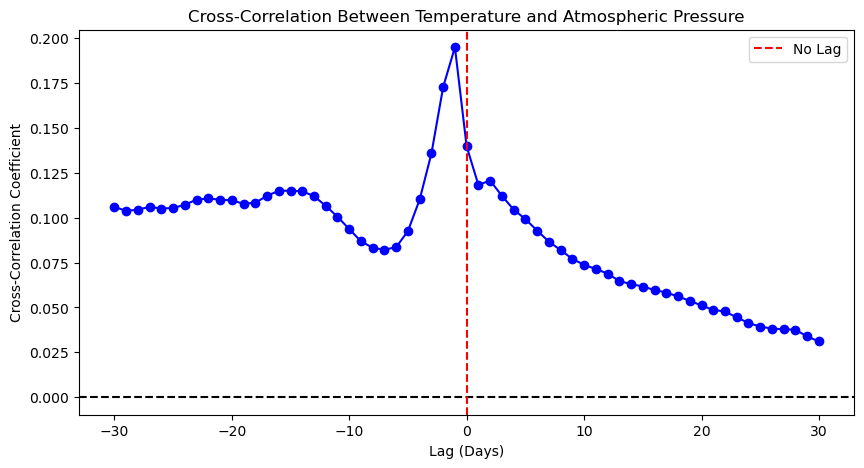

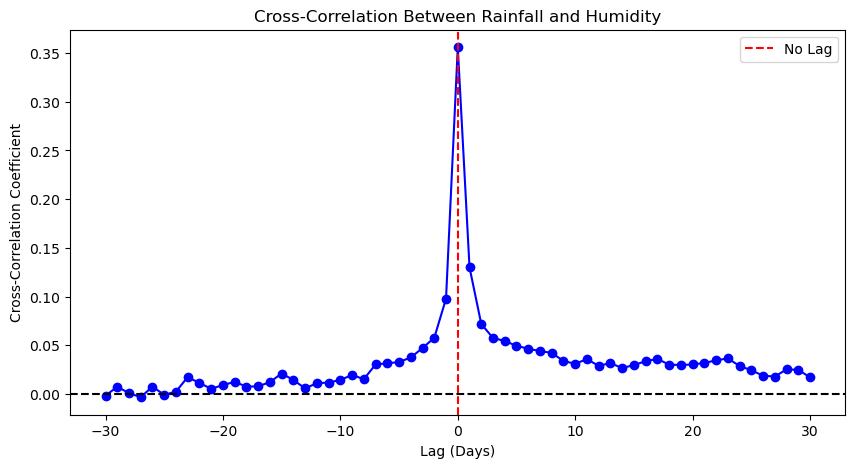

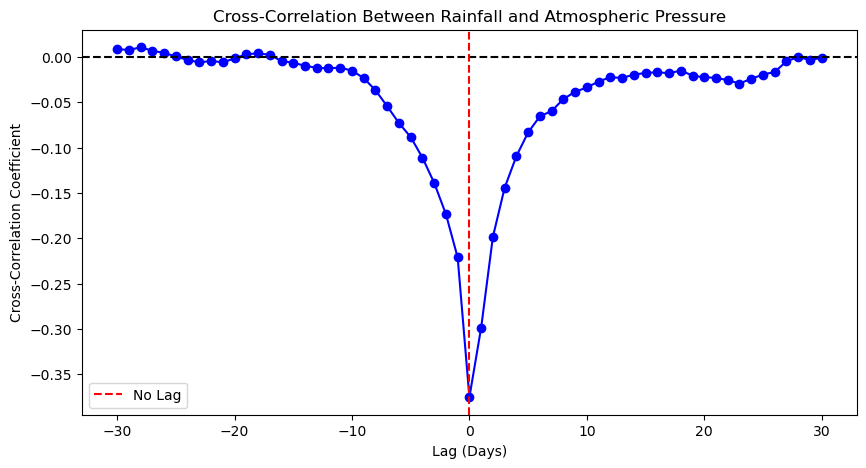

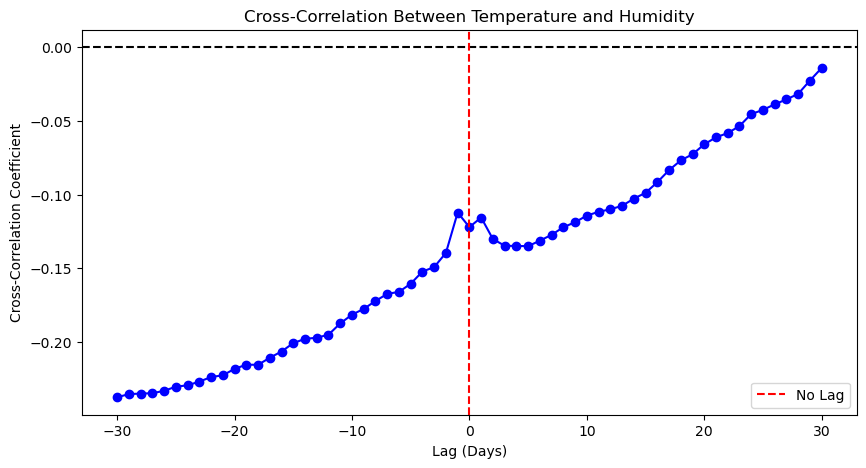

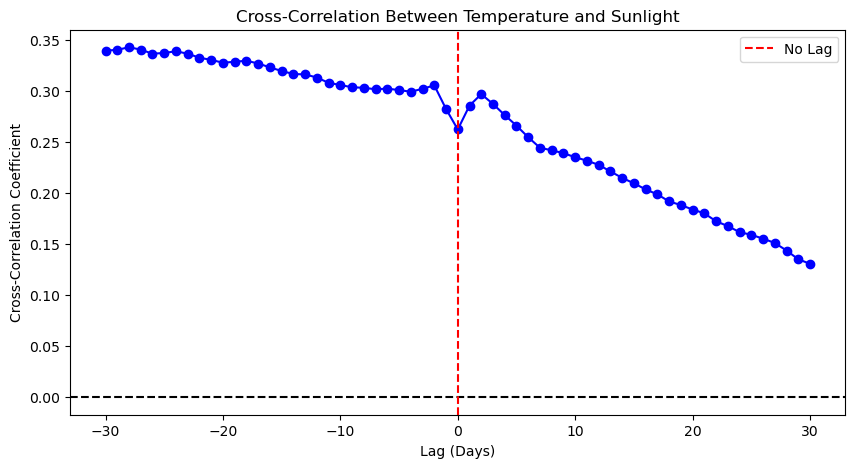

In [50]:
# Define function for cross-correlation analysis to look at feature correlation in data
def cross_correlation_analysis(series1, series2, var1, var2):
    lags = np.arange(-30, 31)  # Testing lags from -30 to +30 days
    cross_correlation = [series1.shift(lag).corr(series2) for lag in lags]

    # Plot cross-correlation results
    plt.figure(figsize=(10, 5))
    plt.plot(lags, cross_correlation, marker='o', linestyle='-', color='b')
    plt.axhline(0, color='black', linestyle='--')
    plt.axvline(0, color='red', linestyle='--', label="No Lag")
    plt.xlabel("Lag (Days)")
    plt.ylabel("Cross-Correlation Coefficient")
    plt.title(f"Cross-Correlation Between {var1} and {var2}")
    plt.legend()
    plt.show()
    
    return cross_correlation

# Perform cross-correlation analysis on daily data
cross_correlation_temp_msl = cross_correlation_analysis(daily_data['temp'], daily_data['msl'], "Temperature", "Atmospheric Pressure")
cross_correlation_rain_rhum = cross_correlation_analysis(daily_data['rain'], daily_data['rhum'], "Rainfall", "Humidity")
cross_correlation_rain_msl = cross_correlation_analysis(daily_data['rain'], daily_data['msl'], "Rainfall", "Atmospheric Pressure")
cross_correlation_temp_rhum = cross_correlation_analysis(daily_data['temp'], daily_data['rhum'], "Temperature", "Humidity")
cross_correlation_temp_sun = cross_correlation_analysis(daily_data['temp'], daily_data['sun'], "Temperature", "Sunlight")

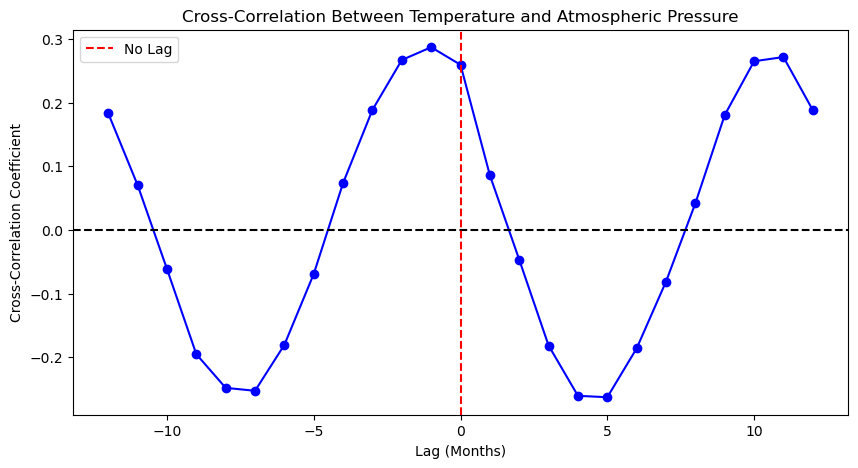

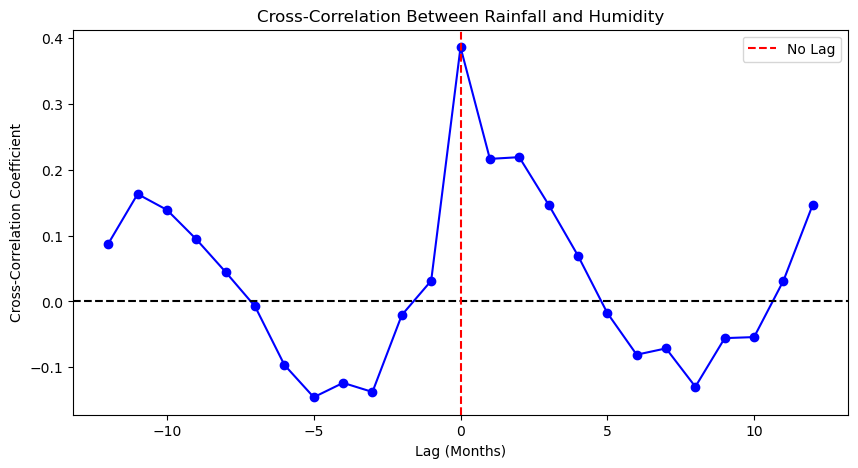

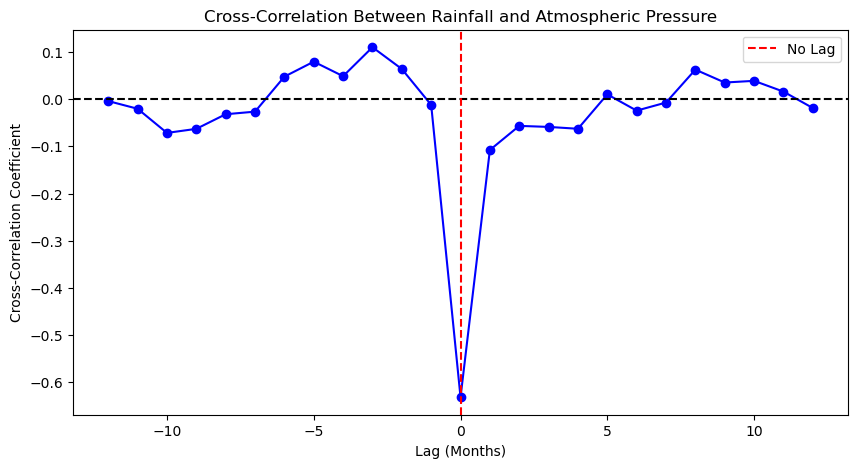

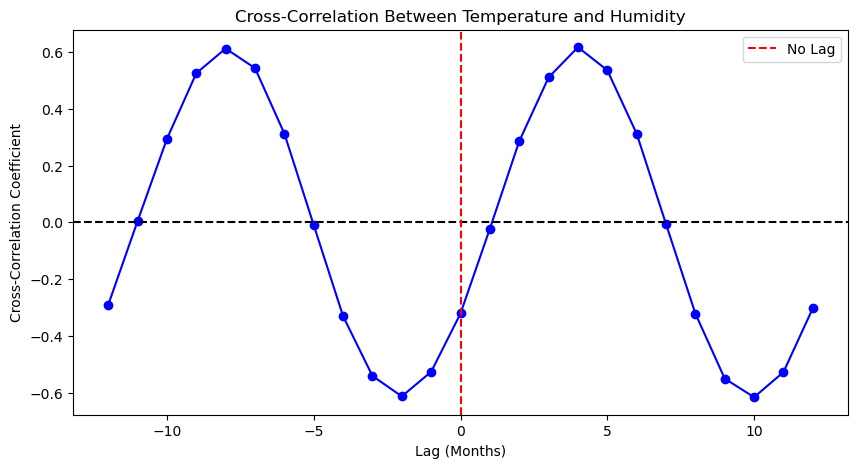

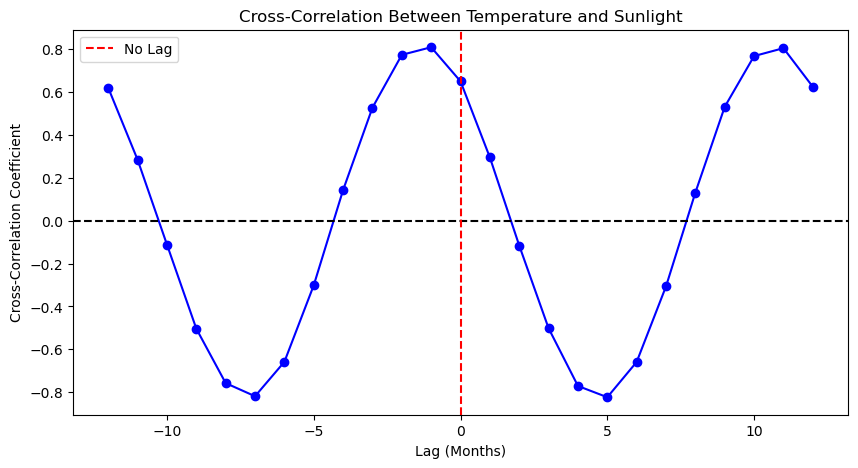

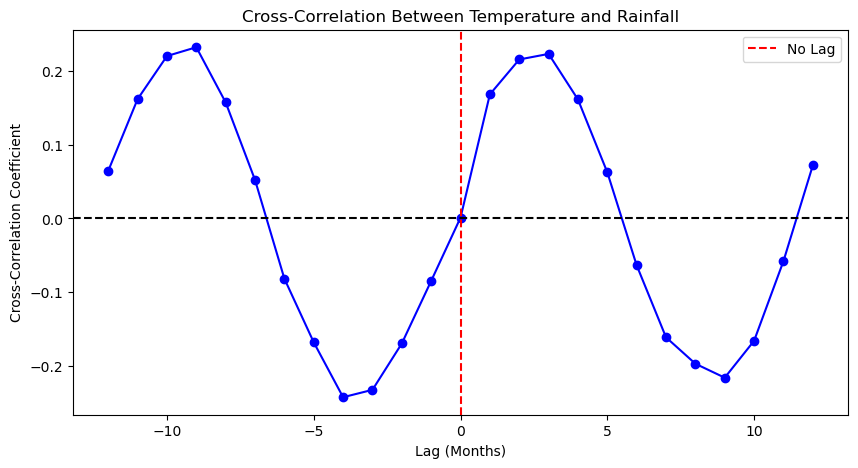

In [51]:
# Define function for cross-correlation analysis of monthly data
def cross_correlation_analysis(series1, series2, var1, var2):
    lags = np.arange(-12, 13)  
    cross_correlation = [series1.shift(lag).corr(series2) for lag in lags]

    # Plot cross-correlation results
    plt.figure(figsize=(10, 5))
    plt.plot(lags, cross_correlation, marker='o', linestyle='-', color='b')
    plt.axhline(0, color='black', linestyle='--')
    plt.axvline(0, color='red', linestyle='--', label="No Lag")
    plt.xlabel("Lag (Months)")
    plt.ylabel("Cross-Correlation Coefficient")
    plt.title(f"Cross-Correlation Between {var1} and {var2}")
    plt.legend()
    plt.show()
    
    return cross_correlation

# Perform cross-correlation analysis on monthly data
cross_correlation_temp_msl = cross_correlation_analysis(monthly_data['temp'], monthly_data['msl'], "Temperature", "Atmospheric Pressure")
cross_correlation_rain_rhum = cross_correlation_analysis(monthly_data['rain'], monthly_data['rhum'], "Rainfall", "Humidity")
cross_correlation_rain_msl = cross_correlation_analysis(monthly_data['rain'], monthly_data['msl'], "Rainfall", "Atmospheric Pressure")
cross_correlation_temp_rhum = cross_correlation_analysis(monthly_data['temp'], monthly_data['rhum'], "Temperature", "Humidity")
cross_correlation_temp_sun = cross_correlation_analysis(monthly_data['temp'], monthly_data['sun'], "Temperature", "Sunlight")
cross_correlation_temp_sun = cross_correlation_analysis(monthly_data['temp'], monthly_data['rain'], "Temperature", "Rainfall")

# Assess Decadal shifts and Long-term patterns in Seasonal Climate Variables

# Long term Averages

In [52]:
# Calculate long-term averages for each season
seasonal_averages = seasonal_data.groupby('season')[['rain', 'temp', 'sun']].mean().reset_index()
seasonal_averages.columns = ['season', 'rain_avg', 'temp_avg', 'sun_avg']

# Display the long-term seasonal averages
print(seasonal_averages)


   season    rain_avg   temp_avg     sun_avg
0  Autumn  212.249383  10.832548  289.487654
1  Spring  158.033333   8.839924  451.271605
2  Summer  191.950617  14.674705  487.111111
3  Winter  186.281481   6.110345  171.119753


In [53]:
# Merge  into the dataset
seasonal_data = seasonal_data.merge(seasonal_averages, on='season')

In [54]:
# Calculate anomalies for rain, temp, and sun
seasonal_data['rain_anomaly'] = seasonal_data['rain'] - seasonal_data['rain_avg']
seasonal_data['temp_anomaly'] = seasonal_data['temp'] - seasonal_data['temp_avg']
seasonal_data['sun_anomaly'] = seasonal_data['sun'] - seasonal_data['sun_avg']

In [55]:
# Summarize anomalies by year and season
anomaly_summary = seasonal_data.groupby(['year', 'season'])[['rain_anomaly', 'temp_anomaly', 'sun_anomaly']].mean().reset_index()

# Display the anomaly summary
anomaly_summary.head()

,year,season,rain_anomaly,temp_anomaly,sun_anomaly
0,1944,Autumn,129.850617,-1.692458,14.612346
1,1944,Spring,-84.533333,0.082516,28.428395
2,1944,Summer,-44.950617,-0.386473,-52.311111
3,1944,Winter,-26.881481,-0.118740,24.180247
4,1945,Autumn,-87.649383,0.706017,-26.787654


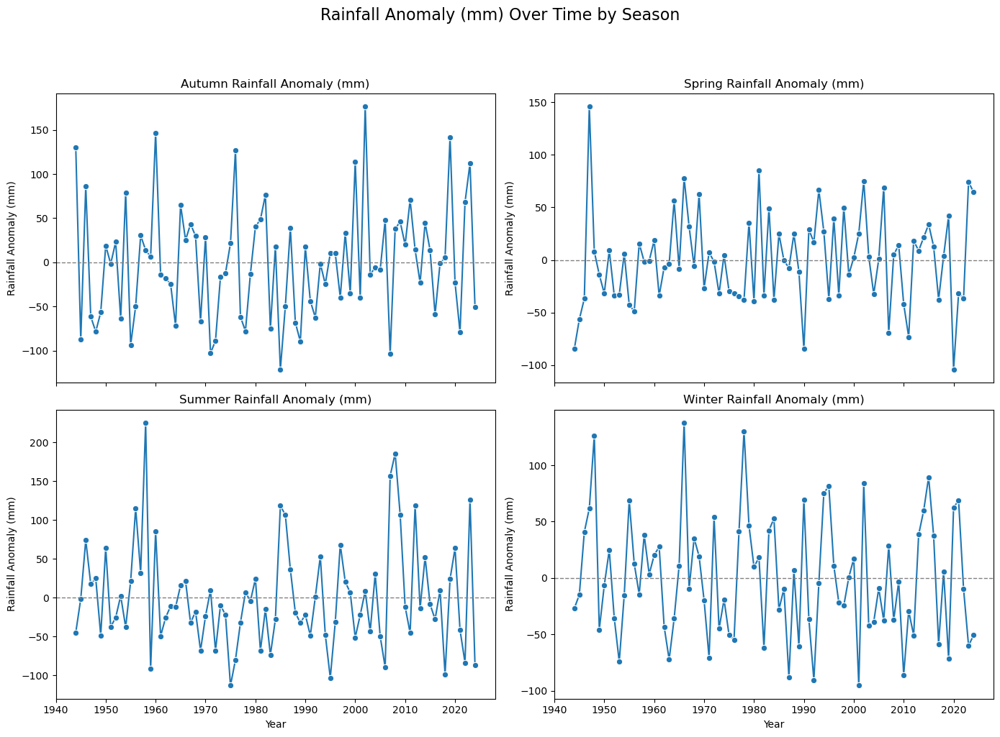

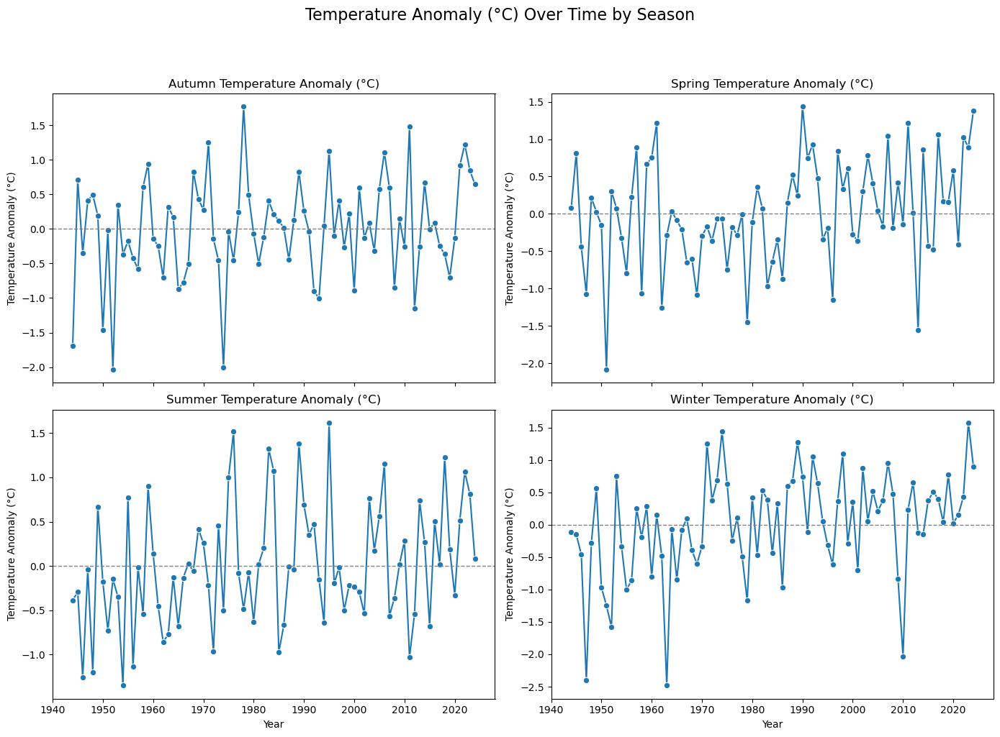

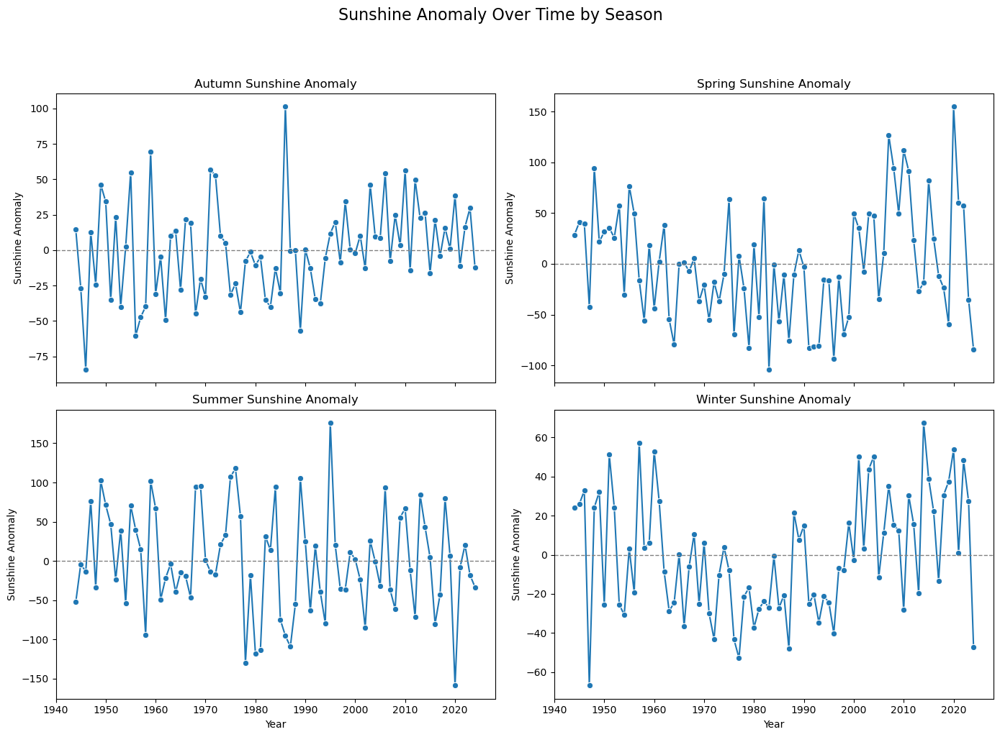

In [56]:
# Define anomalies and  labels
anomalies = {
    'rain_anomaly': 'Rainfall Anomaly (mm)',
    'temp_anomaly': 'Temperature Anomaly (°C)',
    'sun_anomaly': 'Sunshine Anomaly'
}

# Loop through anomalies and create subplots
for anomaly, ylabel in anomalies.items():
    # Set up a 2x2 grid for seasonal subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=False)
    seasons = ['Autumn', 'Spring', 'Summer', 'Winter']
    axes = axes.flatten()
    
    for i, season in enumerate(seasons):
        # Filter data for the current season
        season_data = anomaly_summary[anomaly_summary['season'] == season]
        
        # Plot the anomaly for the current season
        sns.lineplot(data=season_data, x='year', y=anomaly, ax=axes[i], marker='o')
        axes[i].set_title(f'{season} {ylabel}')
        axes[i].set_xlabel('Year')
        axes[i].set_ylabel(ylabel)
        
        # Add a horizontal baseline for easy visualisation
        axes[i].axhline(0, color='gray', linestyle='--', linewidth=1)

    # Adjust layout
    plt.tight_layout()
    # Add a main title
    fig.suptitle(f'{ylabel} Over Time by Season', fontsize=16, y=1.02)
    plt.subplots_adjust(top=0.9)
    plt.show()


# Feature Importance

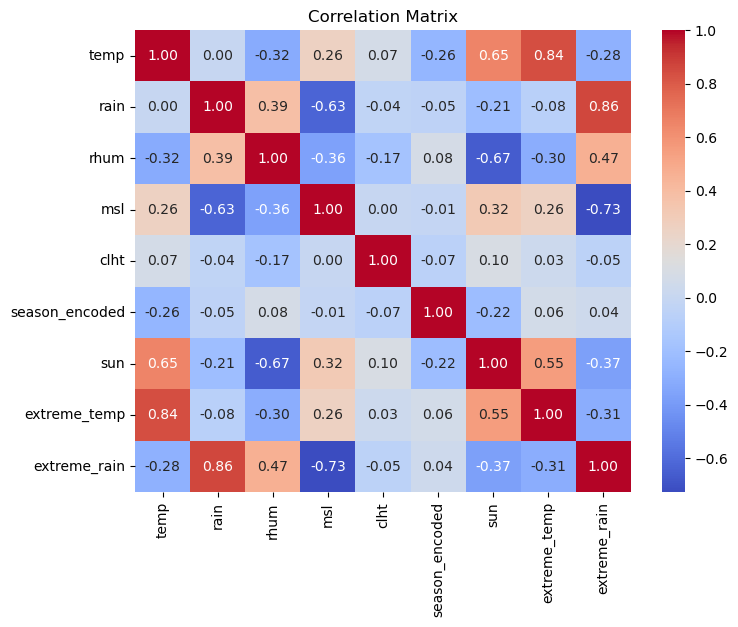

In [57]:
# Calculate the correlation matrix for numerical variables
correlation_matrix = monthly_data[['temp', 'rain', 'rhum', 'msl', 'clht', 'season_encoded', 'sun', 'extreme_temp', 'extreme_rain']].corr()

# Visualize the correlation matrix with a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [58]:
features = ['temp', 'rain', 'rhum', 'msl', 'clht', 'extreme_temp', 'extreme_rain', 'dewpt', 'sun']

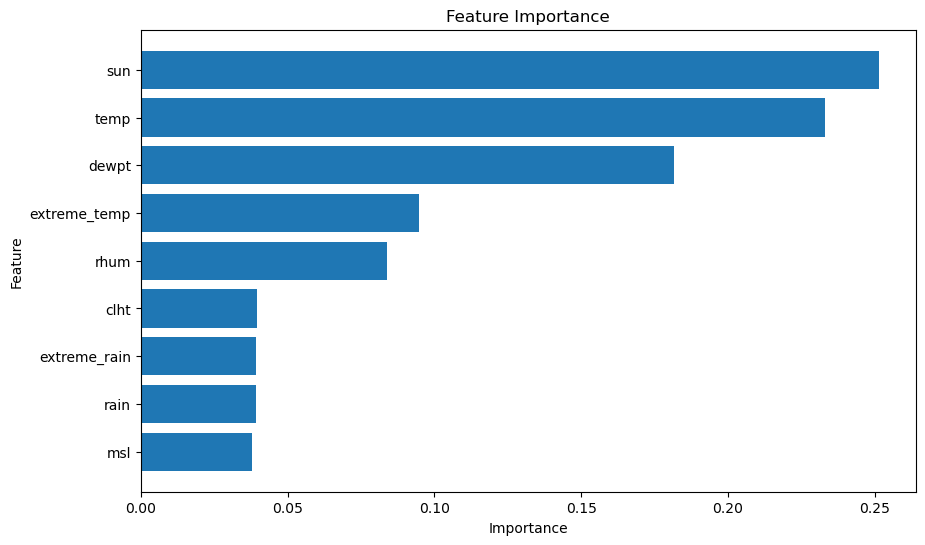

In [59]:
# Define features and target

X = monthly_data[features].dropna()  # Drop rows with missing values
y = monthly_data['season_encoded'].loc[X.index]  # Ensure target aligns with features

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model to examine biggest seasonal drivers
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Extract and plot feature importance
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()


In [60]:
# Calculate initial VIF to check for multicorellitiyt
X = daily_data[features].dropna()
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display initial VIF results
print("Initial VIF:")
print(vif_data)

Initial VIF:
        Feature          VIF
0          temp  2107.949998
1          rain     3.816705
2          rhum  4240.343058
3           msl  5946.766741
4          clht     1.848108
5  extreme_temp     2.478242
6  extreme_rain     5.288918
7         dewpt  1170.216823
8           sun     3.699908


In [61]:
# Drop rows with missing values in rhum or msl
daily_data = daily_data.dropna(subset=['rhum', 'msl'])

In [62]:
# Select features for PCA
features_for_pca = ['rhum', 'msl']

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(daily_data[features_for_pca].dropna())

# Apply PCA
pca = PCA(n_components=1)  # Combine into one component
pca_feature = pca.fit_transform(scaled_data)

# Add the new PCA feature to the dataset
daily_data['rhum_msl_pca'] = pca_feature

# Drop original features (optional)
#daily_data.drop(columns=features_for_pca, inplace=True)




In [63]:
# Standardize the features before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(daily_data[['rhum', 'msl']].dropna())

# Apply PCA with 1 component
pca = PCA(n_components=1)
pca.fit(scaled_data)

# Get explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Print explained variance ratio
print(f"Explained Variance Ratio of PC1: {explained_variance_ratio[0] * 100:.2f}%")


Explained Variance Ratio of PC1: 61.87%


In [64]:
daily_data.head()

,day,year,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season,rhum_msl_pca
0,1944-01-01,1944,0.0,7.870833,0.5,6.850000,5.666667,1024.629167,85.750000,30.208333,0.0,0.00,3,Winter,-0.211221
1,1944-01-02,1944,0.1,9.075000,2.1,7.675000,6.095833,1019.133333,81.208333,23.708333,0.0,0.00,3,Winter,-0.296476
2,1944-01-03,1944,5.7,7.741667,0.0,6.975000,6.062500,1015.958333,89.083333,21.625000,0.0,0.25,3,Winter,0.596045
3,1944-01-04,1944,0.0,2.141667,6.1,1.341667,-0.004167,1030.804167,85.541667,47.458333,0.0,0.00,3,Winter,-0.591867
4,1944-01-05,1944,0.0,4.675000,1.1,3.287500,1.237500,1031.800000,78.000000,49.416667,0.0,0.00,3,Winter,-1.326752


In [65]:
updated_features = ['temp', 'rain', 'clht', 'extreme_temp', 'extreme_rain', 'rhum_msl_pca']

In [66]:
X = daily_data[updated_features].dropna()
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display initial VIF results
print("Initial VIF:")
print(vif_data)

Initial VIF:
        Feature       VIF
0          temp  3.304734
1          rain  3.770572
2          clht  1.640045
3  extreme_temp  1.889549
4  extreme_rain  4.941658
5  rhum_msl_pca  1.546025


In [67]:
# Monthly aggregation
PCA_monthly_data = climate_data.groupby(['year', 'month']).agg(aggregation_rules).reset_index()

# Combine year and month into a single date column for easier visualization
PCA_monthly_data['date'] = pd.to_datetime(monthly_data[['year', 'month']].assign(day=1))

PCA_monthly_data.head(12)

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season,date
0,1944,1,84.5,7.188556,54.9,6.062943,4.616076,1017.226703,83.818801,38.933243,0.000000,0.134877,3,Winter,NaT
1,1944,2,25.5,5.043408,69.9,3.651929,1.431511,1022.579904,78.019293,34.054662,0.000000,0.065916,3,Winter,NaT
2,1944,3,11.5,6.157813,134.3,4.671563,2.550000,1022.331719,78.598438,44.932812,0.004687,0.023438,1,Spring,NaT
3,1944,4,43.9,9.735598,155.1,8.155096,6.397194,1015.880650,80.737075,43.165436,0.013294,0.070901,1,Spring,NaT
4,1944,5,18.1,10.605939,190.3,8.395994,5.891575,1020.984116,73.517956,48.374309,0.080110,0.045580,1,Spring,NaT
5,1944,6,32.4,12.559858,161.6,10.461277,8.351206,1013.637305,76.744681,39.731915,0.083688,0.063830,2,Summer,NaT
6,1944,7,57.7,14.764095,89.6,13.302244,12.098036,1011.613745,84.485273,35.196353,0.230014,0.093969,2,Summer,NaT
7,1944,8,56.9,15.579295,183.6,13.526725,11.798972,1015.120411,79.173275,41.784141,0.390602,0.055800,2,Summer,NaT
8,1944,9,146.4,11.701979,127.8,10.310807,8.920396,1015.271994,83.666667,36.248097,0.044140,0.152207,0,Autumn,NaT
9,1944,10,72.0,8.763256,113.8,7.544957,6.075793,1010.554035,83.841499,40.334294,0.000000,0.102305,0,Autumn,NaT


# Let's Visualise Seasonal Change over the Last 70 Years ⏰📈

### Hypothesis: "Seasonal boundaries in Ireland are shifting due to climate change, with winters becoming warmer and wetter, and summers experiencing prolonged dry spells."


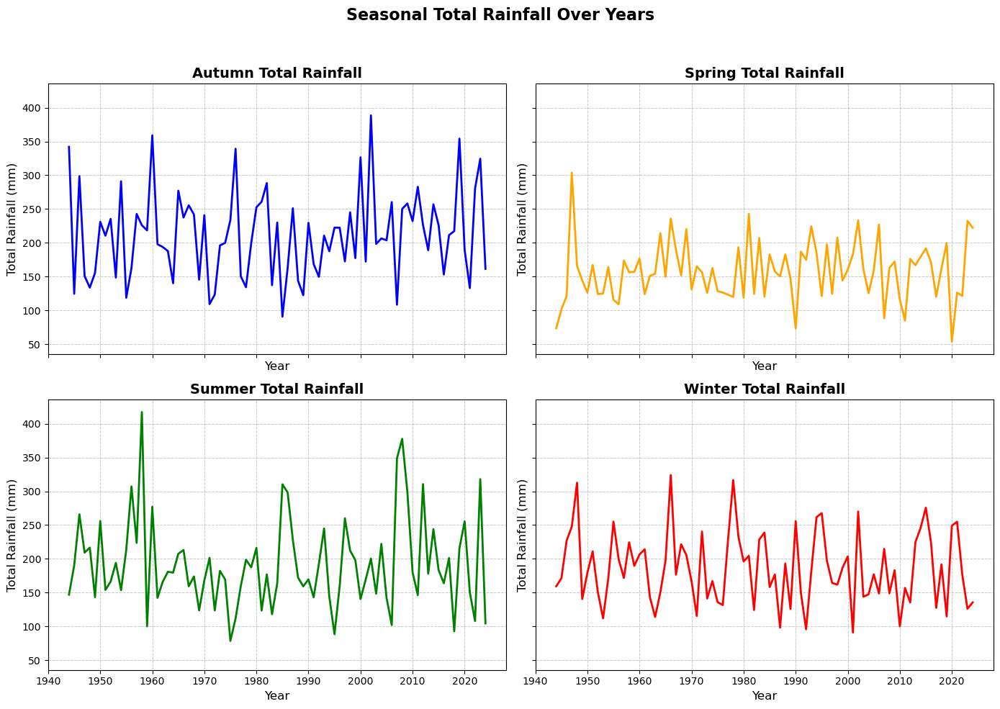

In [68]:
# Get the unique seasons
unique_seasons = seasonal_data['season'].unique()

# Create a subplot for each season
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.flatten() 

# Define custom colors for seasons
colors = {'Autumn': 'blue', 'Spring': 'orange', 'Summer': 'green', 'Winter': 'red'}

for i, season in enumerate(unique_seasons):
    subset = seasonal_data[seasonal_data['season'] == season]
    ax = axes[i]
    ax.plot(subset['year'], subset['rain'], label=f'{season}', color=colors.get(season, 'black'), linewidth=2)
    ax.set_title(f'{season} Total Rainfall', fontsize=14, fontweight='bold')
    ax.grid(visible=True, linestyle='--', linewidth=0.7, alpha=0.7)
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('Total Rainfall (mm)', fontsize=12)
    ax.tick_params(axis='both', labelsize=10)

# Add a shared title for all subplots
fig.suptitle('Seasonal Total Rainfall Over Years', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the shared title

# Show the plot for rainfall
plt.show()

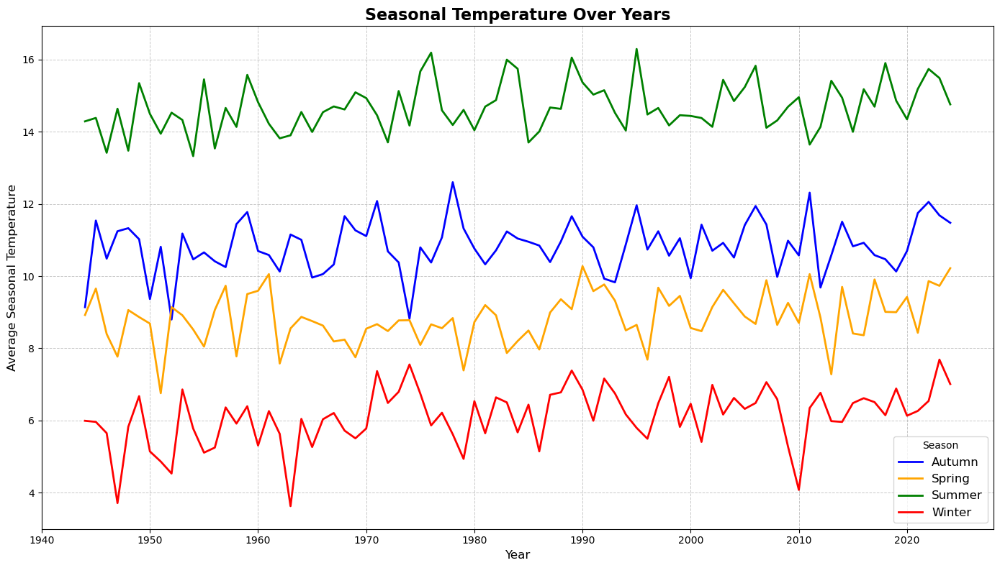

In [69]:

# Define custom colors for seasons
colors = {'Autumn': 'blue', 'Spring': 'orange', 'Summer': 'green', 'Winter': 'red'}

# Create the plot
plt.figure(figsize=(14, 8))

# Plot each season's data
for season in seasonal_data['season'].unique():
    subset = seasonal_data[seasonal_data['season'] == season]
    plt.plot(
        subset['year'],
        subset['temp'],
        label=f'{season}',
        color=colors.get(season, 'black'),
        linewidth=2
    )

# Add labels, title, and legend
plt.title('Seasonal Temperature Over Years', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Seasonal Temperature', fontsize=12)
plt.grid(visible=True, linestyle='--', linewidth=0.7, alpha=0.7)
plt.tick_params(axis='both', labelsize=10)
plt.legend(title='Season', fontsize=12)

# Show the plot for temp
plt.tight_layout()
plt.show()


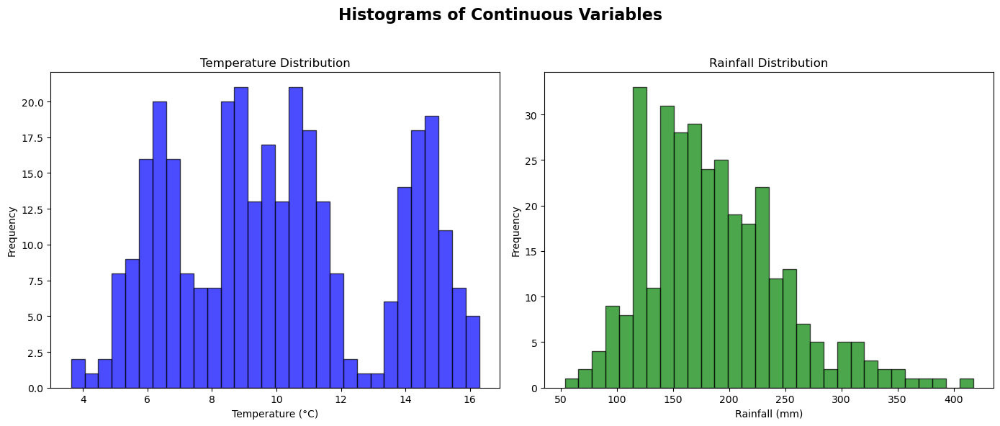

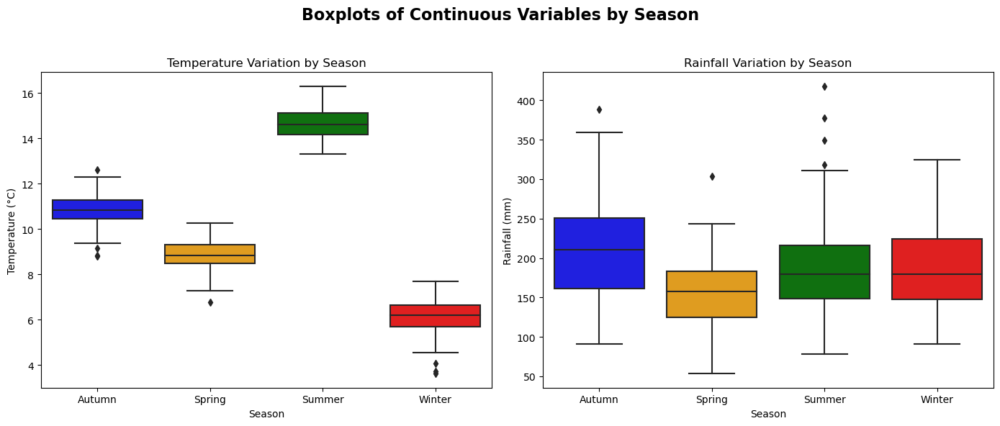

In [70]:
# Define colors for seasons
colors = {'Autumn': 'blue', 'Spring': 'orange', 'Summer': 'green', 'Winter': 'red'}

# Histograms for continuous variables 
plt.figure(figsize=(14, 6))
plt.suptitle('Histograms of Continuous Variables', fontsize=16, fontweight='bold')

# Temperature Histogram
plt.subplot(1, 2, 1)
plt.hist(seasonal_data['temp'], bins=30, color='blue', alpha=0.7, edgecolor='black')
plt.title('Temperature Distribution')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')

# Rainfall Histogram
plt.subplot(1, 2, 2)
plt.hist(seasonal_data['rain'], bins=30, color='green', alpha=0.7, edgecolor='black')
plt.title('Rainfall Distribution')
plt.xlabel('Rainfall (mm)')
plt.ylabel('Frequency')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Boxplots for continuous variables by season
plt.figure(figsize=(14, 6))
plt.suptitle('Boxplots of Continuous Variables by Season', fontsize=16, fontweight='bold')

# Temperature by Season
plt.subplot(1, 2, 1)
sns.boxplot(data=seasonal_data, x='season', y='temp', palette=colors)
plt.title('Temperature Variation by Season')
plt.xlabel('Season')
plt.ylabel('Temperature (°C)')

# Rainfall by Season
plt.subplot(1, 2, 2)
sns.boxplot(data=seasonal_data, x='season', y='rain', palette=colors)
plt.title('Rainfall Variation by Season')
plt.xlabel('Season')
plt.ylabel('Rainfall (mm)')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

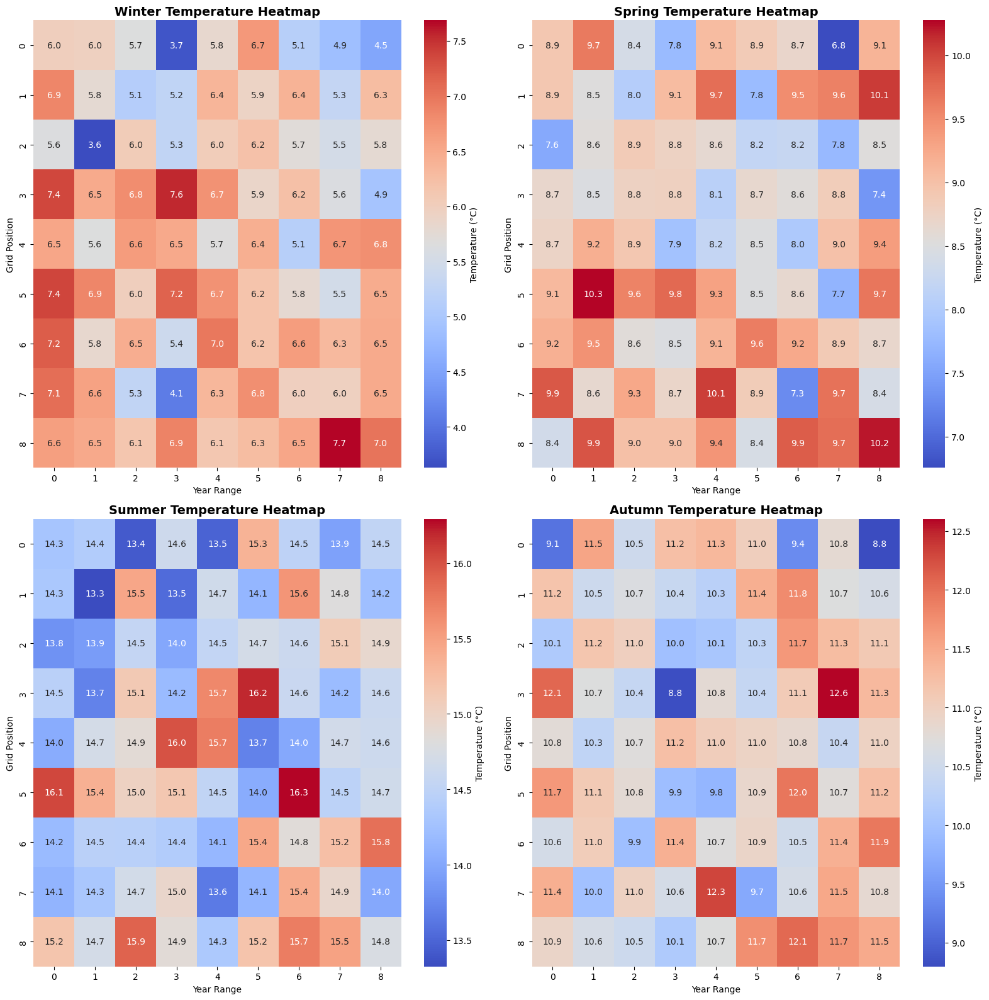

In [71]:
# Define a list of seasons
seasons = ['Winter', 'Spring', 'Summer', 'Autumn']

# Set the grid size for clear format
grid_years = 9

# Create a separate heatmap for each season
plt.figure(figsize=(16, 16)) 

for i, season in enumerate(seasons, 1):
    # Filter data for the current season
    season_data = seasonal_data[seasonal_data['season'] == season]
    
    # Pivot the data to create a matrix of years for temperature
    temp_pivot = season_data.pivot_table(index='year', values='temp', aggfunc='mean')
    
    # Reshape into a grid for the heatmap (e.g., 9x9)
    temp_grid = temp_pivot.values.reshape(grid_years, -1)
    
    # Create a heatmap for the current season
    plt.subplot(2, 2, i)  
    sns.heatmap(temp_grid, cmap='coolwarm', annot=True, fmt=".1f", cbar_kws={'label': 'Temperature (°C)'})
    plt.title(f'{season} Temperature Heatmap', fontsize=14, fontweight='bold')
    plt.xlabel('Year Range')
    plt.ylabel('Grid Position')
#plot
plt.tight_layout()
plt.show()

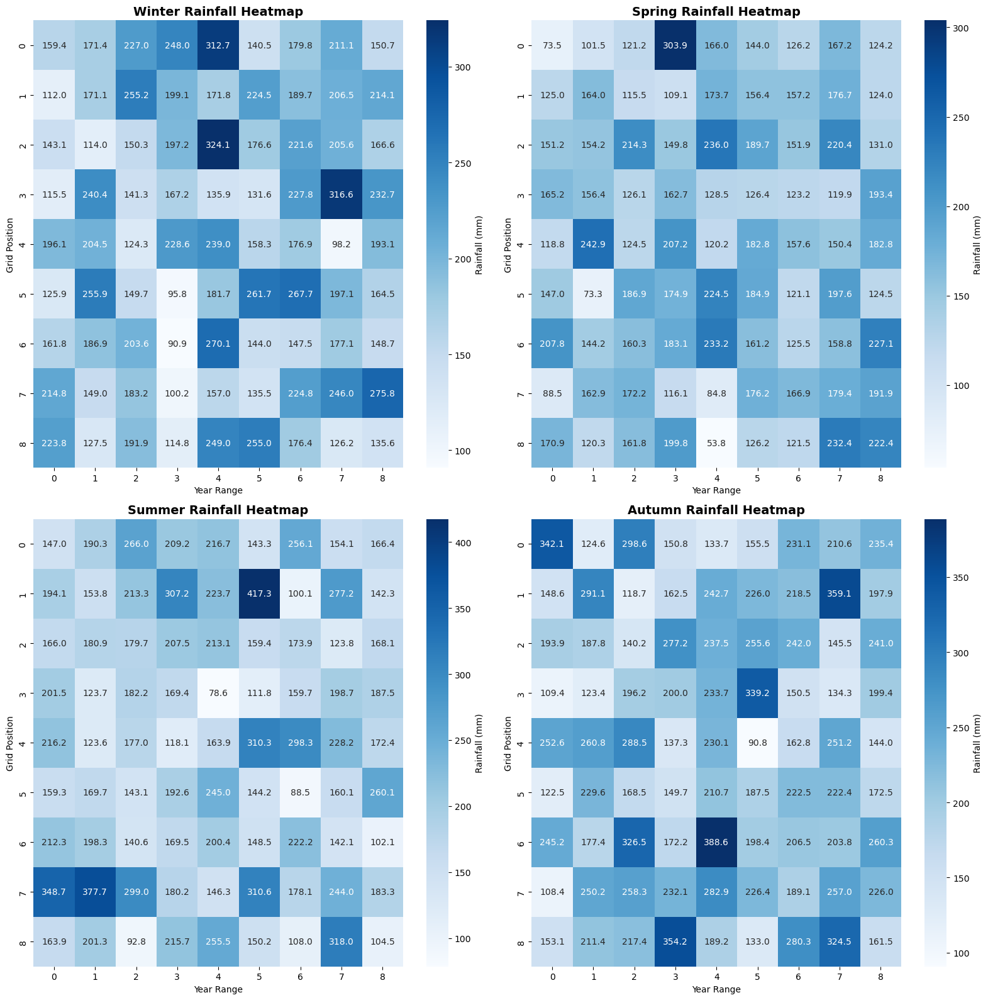

In [72]:
# Create a separate heatmap for each season (for rainfall)
plt.figure(figsize=(16, 16))  

for i, season in enumerate(seasons, 1):
    # Filter data for the current season
    season_data = seasonal_data[seasonal_data['season'] == season]
    
    # Pivot the data to create a matrix of years for rainfall
    rain_pivot = season_data.pivot_table(index='year', values='rain', aggfunc='mean')
    
    # Reshape into a grid for the heatmap
    rain_grid = rain_pivot.values.reshape(grid_years, -1)
    
    # Create a heatmap for the current season
    plt.subplot(2, 2, i)  
    sns.heatmap(rain_grid, cmap='Blues', annot=True, fmt=".1f", cbar_kws={'label': 'Rainfall (mm)'})
    plt.title(f'{season} Rainfall Heatmap', fontsize=14, fontweight='bold')
    plt.xlabel('Year Range')
    plt.ylabel('Grid Position')

plt.tight_layout()
plt.show()

# Mann-Kendall Trend Test for Climate Validation

In [73]:
# Creaye a function to Run Mann-Kendall Test and Plot Trends 
def mann_kendall_trend_analysis(data, column, time_label):
    trend_result = mk.original_test(data[column])

    # Extracting values properly
    trend_stat = trend_result.trend   
    p_value = trend_result.p          
    z_statistic = trend_result.z     
    

    print(f"--- {time_label} {column} Trend Analysis ---")
    print(f"Mann-Kendall Test Statistic (Z): {z_statistic}")
    print(f"p-value: {p_value:.4f}") 
    
    # Interpret trend direction using a conditional function
    if p_value < 0.05:
        trend_type = " Increasing" if trend_stat == "increasing" else " Decreasing"
        print(f" Statistically Significant Trend Detected: {trend_type}")
    else:
        print(" No Significant Trend Detected")
    

    # Plot the trend
    plt.figure(figsize=(8, 4))
    sns.lineplot(x=data['year'], y=data[column], marker='o', label=time_label, color="blue")
    sns.regplot(x=data['year'], y=data[column], scatter=False, lowess=True, color="red", line_kws={'linestyle':'dashed'})
    plt.title(f"{time_label} {column} Trend Over Time")
    plt.xlabel("Year")
    plt.ylabel(column)
    plt.grid()
    plt.show()



SEASONAL TEMPERATURE AND RAINFALL TRENDS 
--- Winter temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 3.511508026867444
p-value: 0.0004
 Statistically Significant Trend Detected:  Increasing


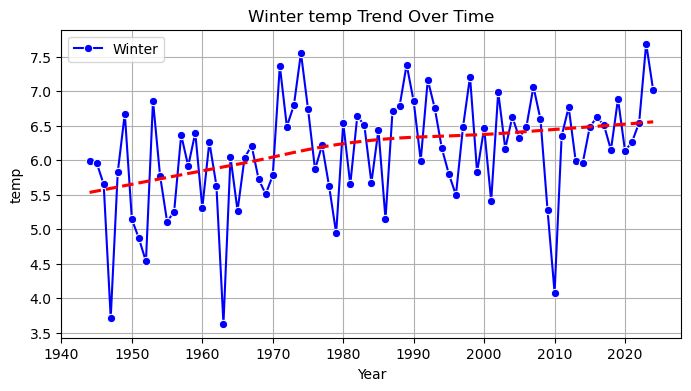

--- Winter rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -0.803446087448184
p-value: 0.4217
 No Significant Trend Detected


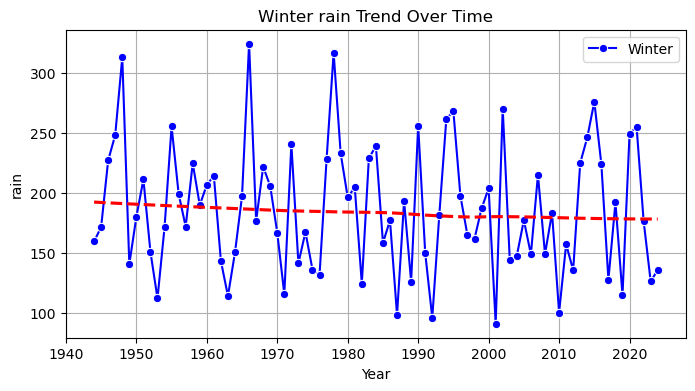

--- Spring temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.4755927669088718
p-value: 0.0133
 Statistically Significant Trend Detected:  Increasing


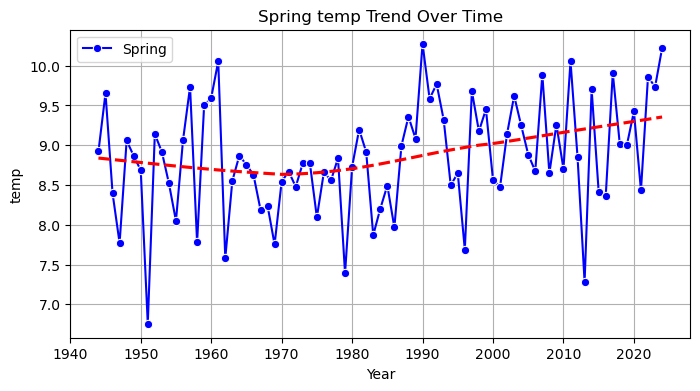

--- Spring rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.3744687273224458
p-value: 0.1693
 No Significant Trend Detected


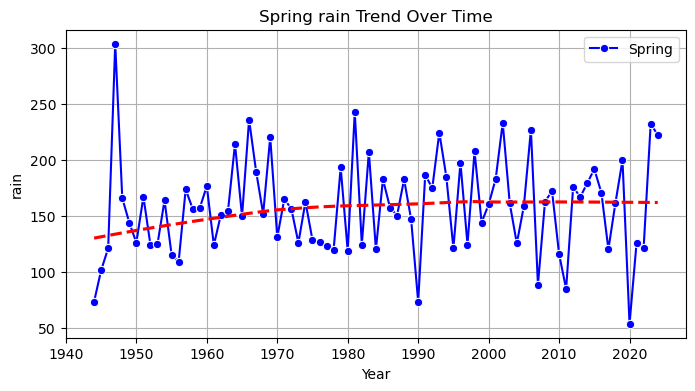

--- Summer temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.71214034595453
p-value: 0.0067
 Statistically Significant Trend Detected:  Increasing


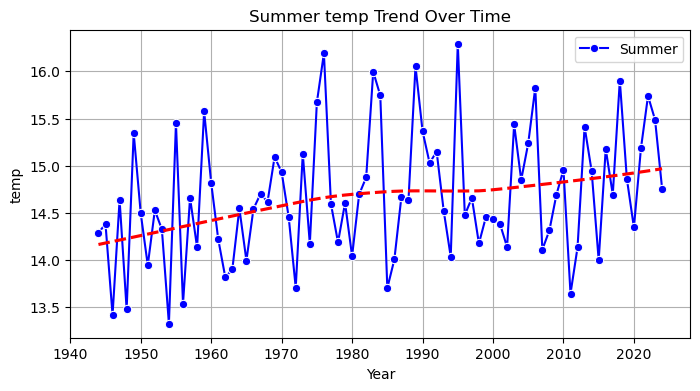

--- Summer rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -0.19576514181967086
p-value: 0.8448
 No Significant Trend Detected


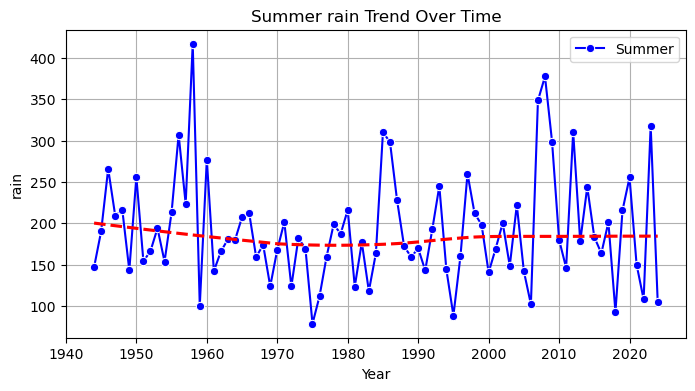

--- Autumn temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.3581093762449
p-value: 0.1744
 No Significant Trend Detected


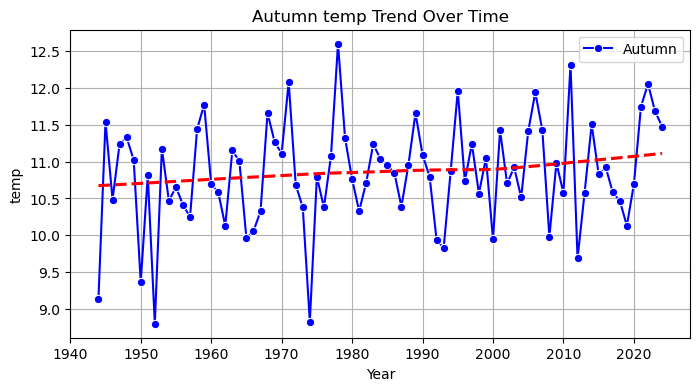

--- Autumn rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.9706688281892014
p-value: 0.3317
 No Significant Trend Detected


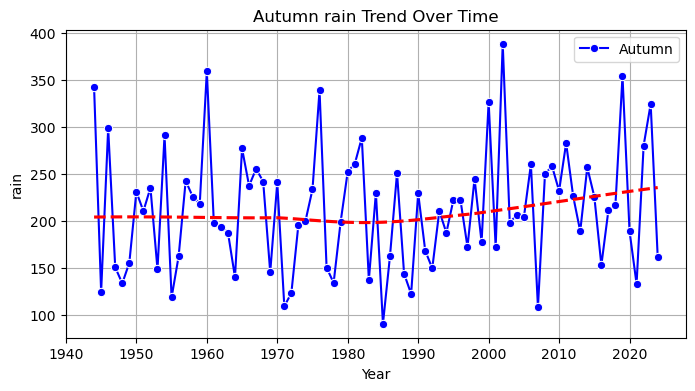

In [74]:
#Check Warming Trends Across All Seasons
print("\nSEASONAL TEMPERATURE AND RAINFALL TRENDS ")
for season in ["Winter", "Spring", "Summer", "Autumn"]:
    seasonal_temp = seasonal_data[seasonal_data["season"] == season]
    seasonal_rain = seasonal_data[seasonal_data["season"] == season]

    # Temperature trend
    mann_kendall_trend_analysis(seasonal_temp, "temp", season)

    # Rainfall trend
    mann_kendall_trend_analysis(seasonal_rain, "rain", season)


MONTHLY TEMPERATURE AND RAINFALL TRENDS 
--- January temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.1081958113314094
p-value: 0.0350
 Statistically Significant Trend Detected:  Increasing


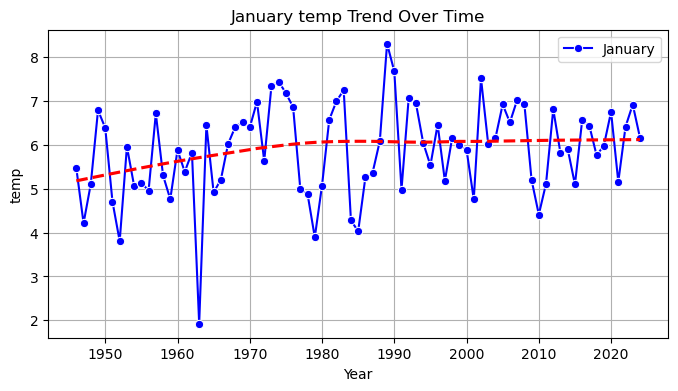

--- January rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -0.5164748963771341
p-value: 0.6055
 No Significant Trend Detected


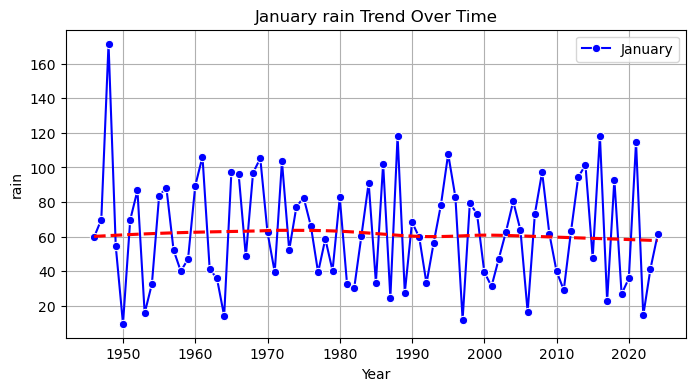

--- February temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.760127849373652
p-value: 0.0058
 Statistically Significant Trend Detected:  Increasing


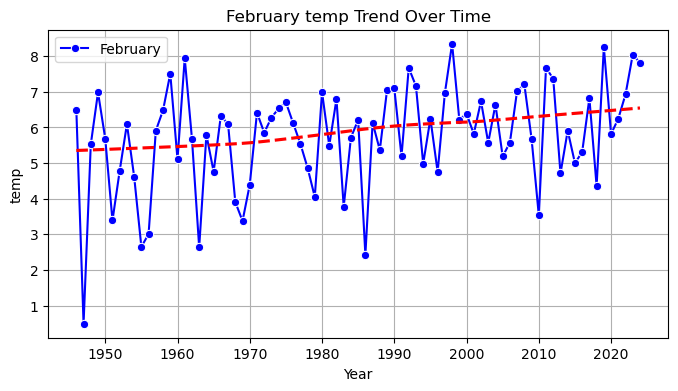

--- February rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.10583596813295759
p-value: 0.9157
 No Significant Trend Detected


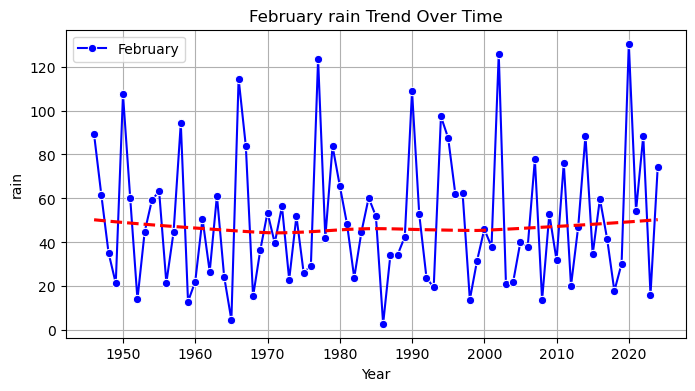

--- March temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.8033964169220489
p-value: 0.0713
 No Significant Trend Detected


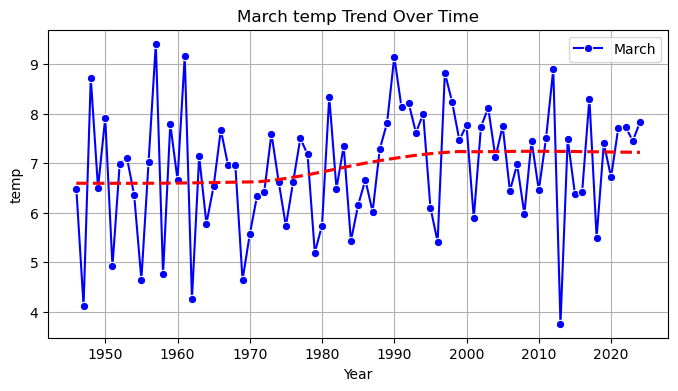

--- March rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.8043749821179408
p-value: 0.4212
 No Significant Trend Detected


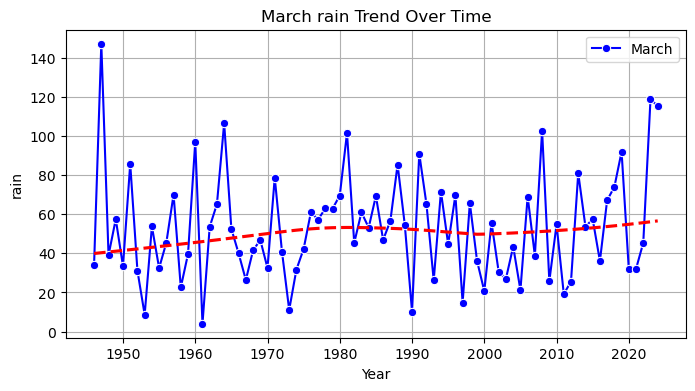

--- April temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.4477971234444618
p-value: 0.1477
 No Significant Trend Detected


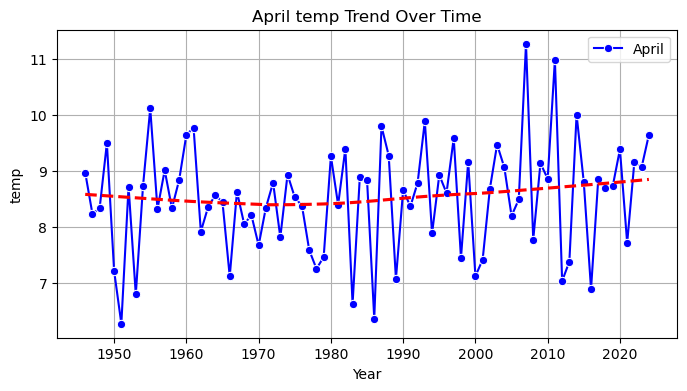

--- April rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.4910832927548715
p-value: 0.6234
 No Significant Trend Detected


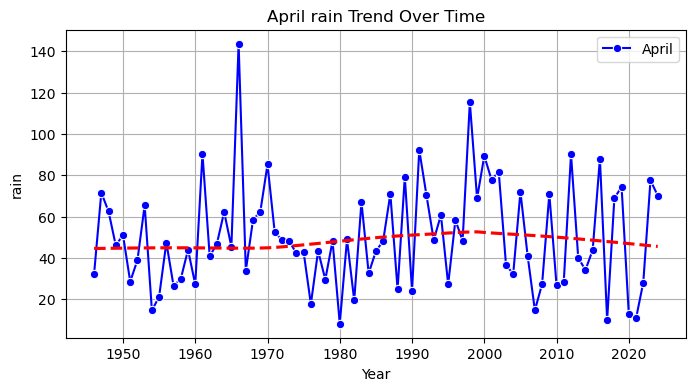

--- May temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.624661451858381
p-value: 0.0087
 Statistically Significant Trend Detected:  Increasing


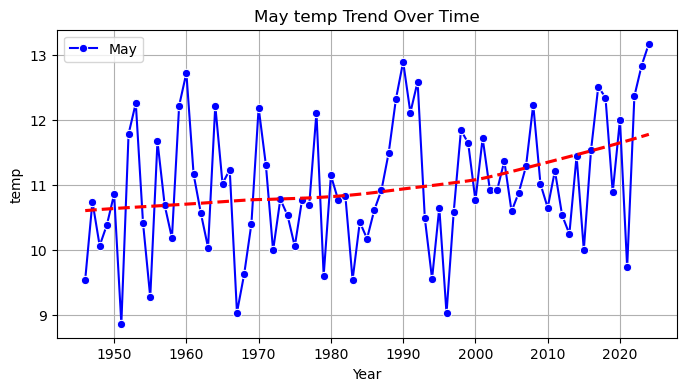

--- May rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -1.4308638237550528
p-value: 0.1525
 No Significant Trend Detected


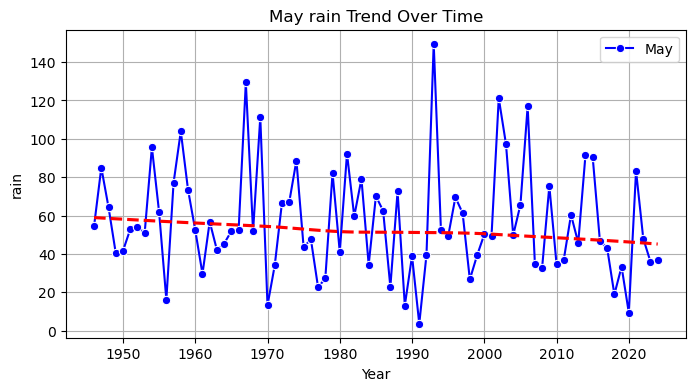

--- June temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.4223971739103485
p-value: 0.1549
 No Significant Trend Detected


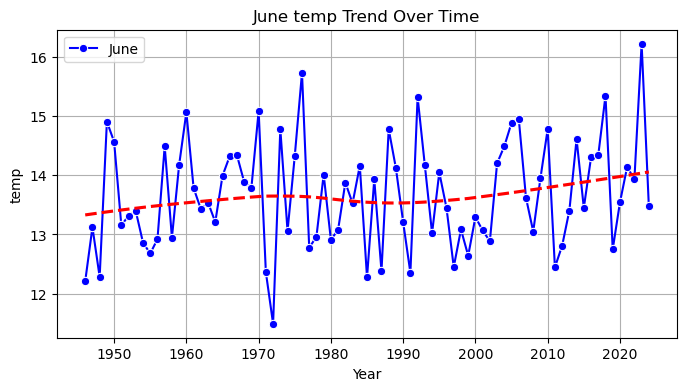

--- June rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.42757731125714865
p-value: 0.6690
 No Significant Trend Detected


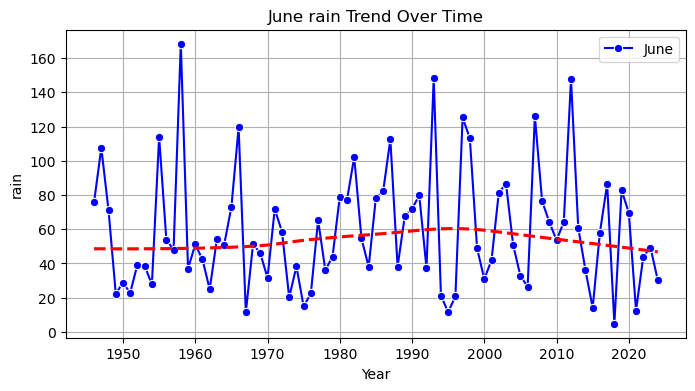

--- July temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.1759290100890447
p-value: 0.0296
 Statistically Significant Trend Detected:  Increasing


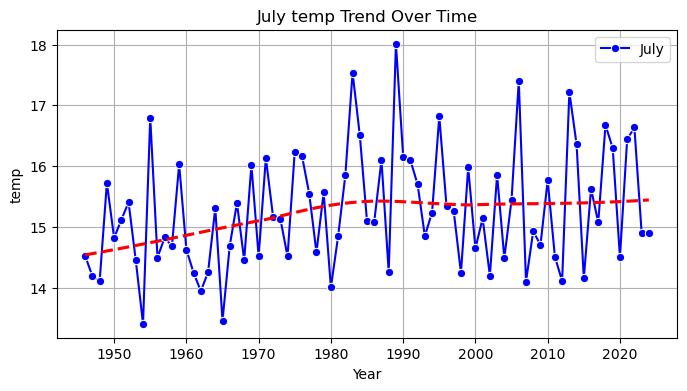

--- July rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -0.05080171994015912
p-value: 0.9595
 No Significant Trend Detected


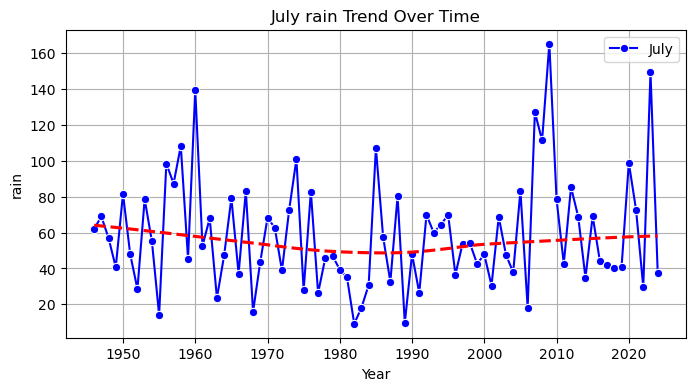

--- August temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.9811960636608423
p-value: 0.0476
 Statistically Significant Trend Detected:  Increasing


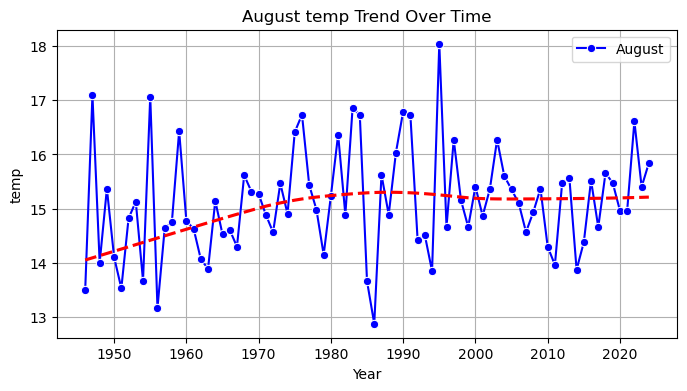

--- August rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -1.0371924877029843
p-value: 0.2996
 No Significant Trend Detected


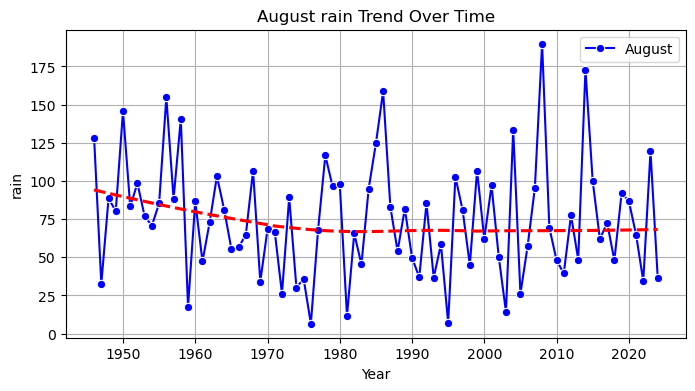

--- September temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.8889982336939678
p-value: 0.3740
 No Significant Trend Detected


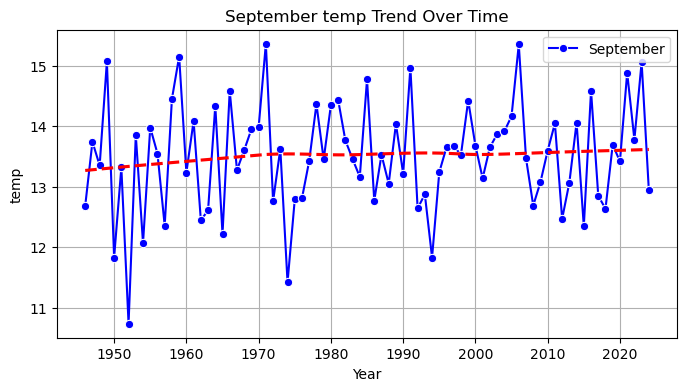

--- September rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -0.635021499251989
p-value: 0.5254
 No Significant Trend Detected


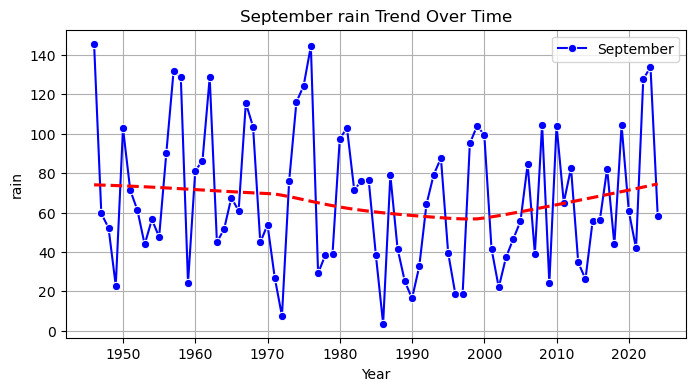

--- October temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.7873984355575143
p-value: 0.4310
 No Significant Trend Detected


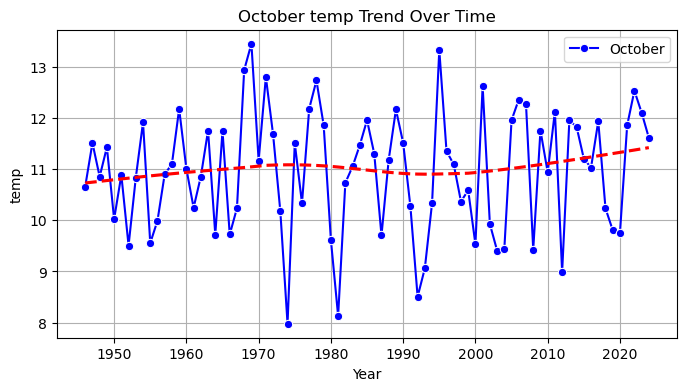

--- October rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 2.040535750929725
p-value: 0.0413
 Statistically Significant Trend Detected:  Increasing


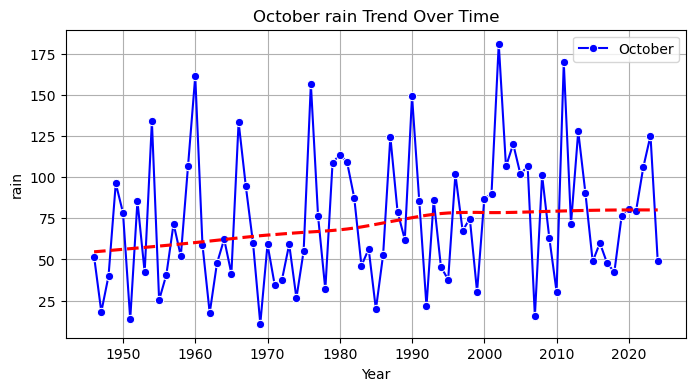

--- November temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.303864076084486
p-value: 0.1923
 No Significant Trend Detected


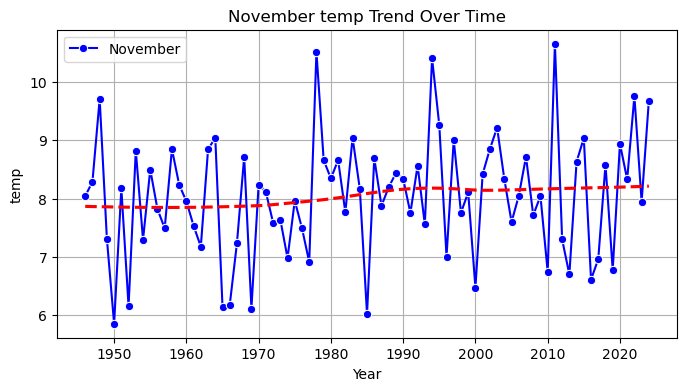

--- November rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): 0.4402736821575569
p-value: 0.6597
 No Significant Trend Detected


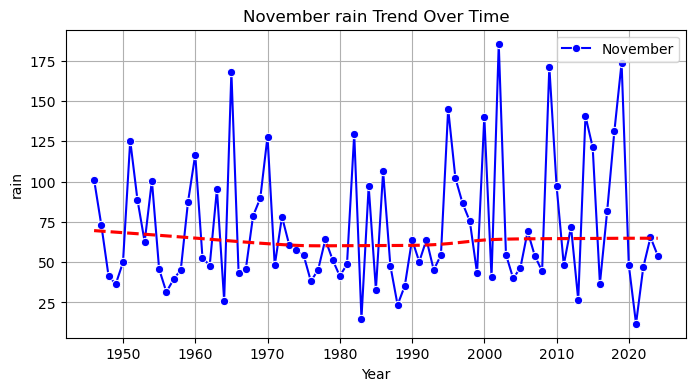

--- December temp Trend Analysis ---
Mann-Kendall Test Statistic (Z): 1.7102632686302999
p-value: 0.0872
 No Significant Trend Detected


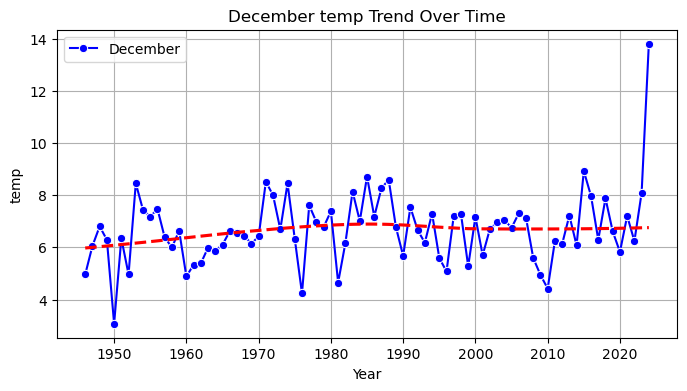

--- December rain Trend Analysis ---
Mann-Kendall Test Statistic (Z): -1.4732498782646146
p-value: 0.1407
 No Significant Trend Detected


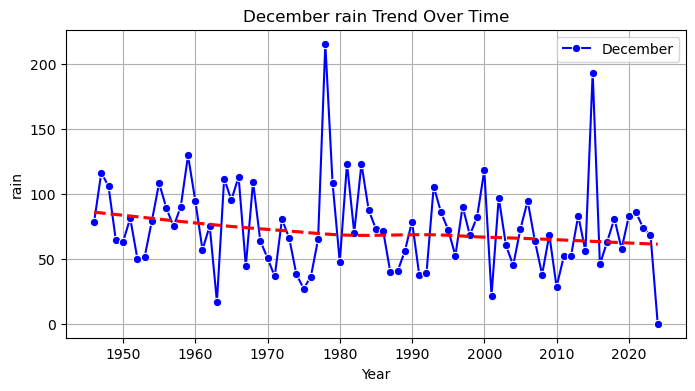

In [75]:
#Monthly Trend Analysis Over 80-Year Dataset ###
print("\nMONTHLY TEMPERATURE AND RAINFALL TRENDS ")

# Loop through each month (January to December)
for month in range(1, 13):  
    monthly_temp = monthly_data[monthly_data["month"] == month]
    monthly_rain = monthly_data[monthly_data["month"] == month]

    # Convert month number to name
    month_name = pd.to_datetime(str(month), format="%m").strftime("%B")

    # Temperature trend
    mann_kendall_trend_analysis(monthly_temp, "temp", month_name)

    # Rainfall trend
    mann_kendall_trend_analysis(monthly_rain, "rain", month_name)

In [76]:
# Filter for dry days in summer
summer_dry_days = daily_data[(daily_data['season'] == 'Summer') & (daily_data['rain'] < 1)]

# Group by year and count dry days
summer_dry_days['year'] = summer_dry_days['day'].dt.year
dry_days_per_year = summer_dry_days.groupby('year').size()

C:\Users\a-ldrumm\AppData\Local\Temp\ipykernel_3456\1244195895.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summer_dry_days['year'] = summer_dry_days['day'].dt.year


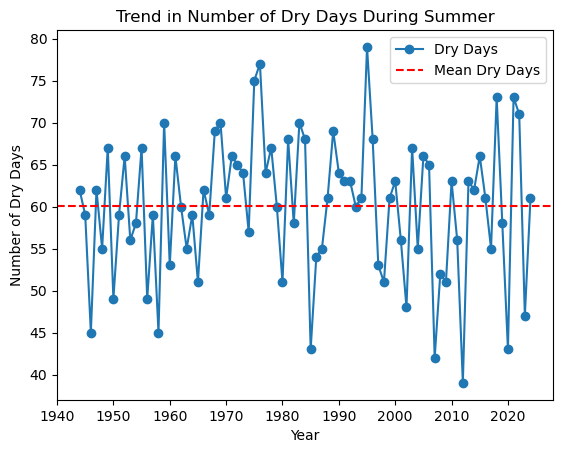

In [77]:
#plot
plt.plot(dry_days_per_year.index, dry_days_per_year.values, marker='o', label='Dry Days')
plt.title('Trend in Number of Dry Days During Summer')
plt.xlabel('Year')
plt.ylabel('Number of Dry Days')
plt.axhline(y=dry_days_per_year.mean(), color='r', linestyle='--', label='Mean Dry Days')
plt.legend()
plt.show()

# Time Series Analysis⏰

# Model 1: STL Decomposition for Seasonal Shifts Analysis

# Seasonal Decomposition by Month

In [78]:
monthly_data.set_index('date', inplace=True)

C:\Users\a-ldrumm\AppData\Local\Temp\ipykernel_3456\695638199.py:21: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.95])


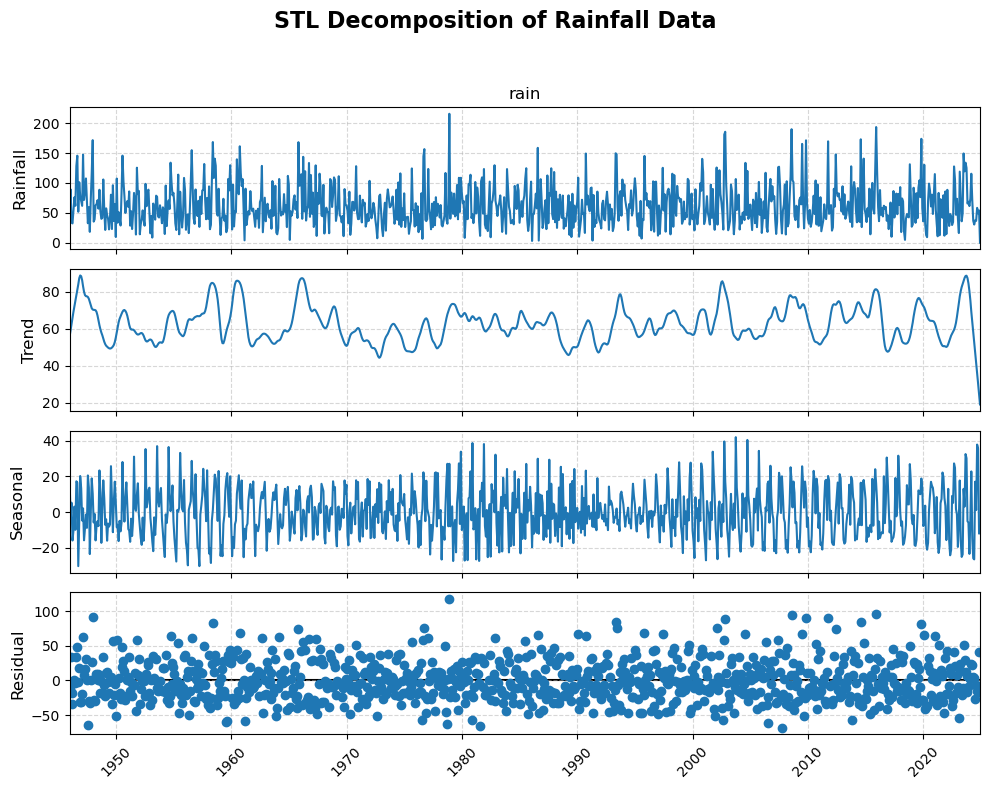

In [79]:
rainfall_series = monthly_data['rain']

# Perform STL decomposition
stl_rain = STL(rainfall_series, seasonal=13).fit()

# Plot the STL decomposition with improved readability
fig = stl_rain.plot()
fig.set_size_inches(10, 8)  # Adjust figure size for beter fit
fig.suptitle("STL Decomposition of Rainfall Data", fontsize=16, fontweight='bold')  

# Customize subplots
axes = fig.axes
axes[0].set_ylabel("Rainfall", fontsize=12)  
axes[1].set_ylabel("Trend", fontsize=12)  
axes[2].set_ylabel("Seasonal", fontsize=12)  
axes[3].set_ylabel("Residual", fontsize=12)  
for ax in axes:
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    ax.grid(True, linestyle='--', alpha=0.5)  # Add grid lines for clarity

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

In [80]:
# Perform STL decomposition for rainfall
stl_rain = STL(monthly_data['rain'], seasonal=13).fit()
monthly_data['rain_trend'] = stl_rain.trend
monthly_data['rain_seasonal'] = stl_rain.seasonal
monthly_data['rain_residual'] = stl_rain.resid

In [81]:
#create decade feature column for long term decadonal trends
monthly_data['decade'] = (monthly_data['year'] // 10) * 10

C:\Users\a-ldrumm\AppData\Local\Temp\ipykernel_3456\3817983226.py:22: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to prevent overlap with the title


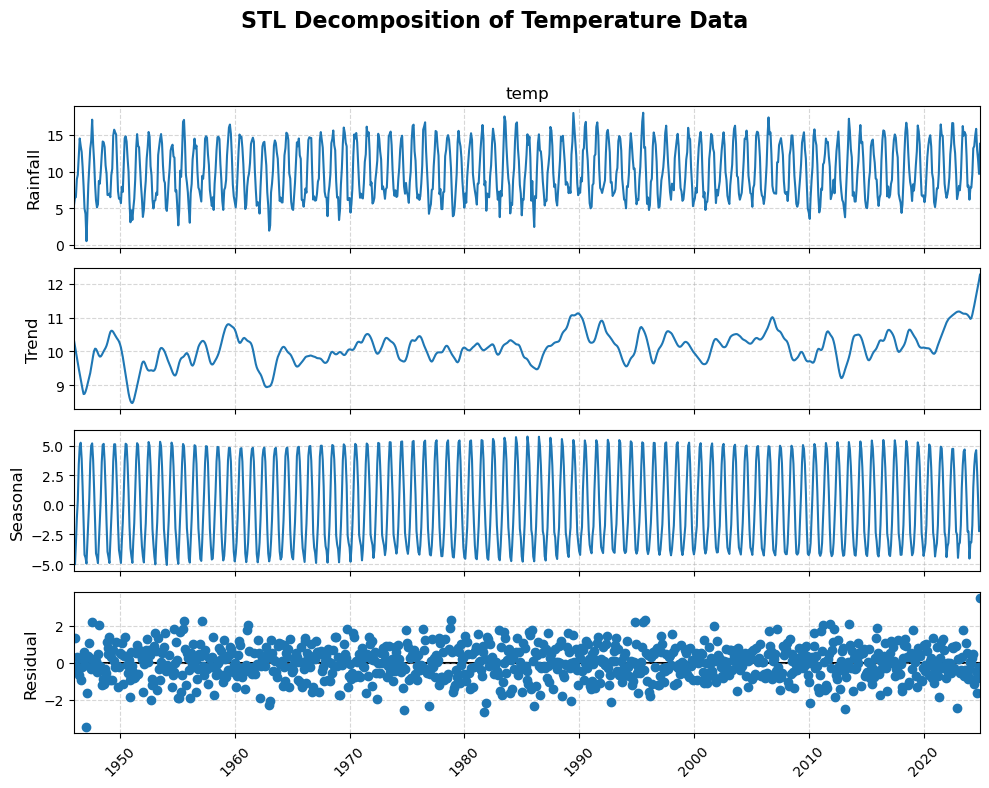

In [82]:
#stl for temp
temp_series = monthly_data['temp']

# Perform STL decomposition
stl_temp = STL(temp_series, seasonal=13).fit()

# Plot the STL decomposition with improved readability
fig = stl_temp.plot()
fig.set_size_inches(10, 8)  # Adjust figure size
fig.suptitle("STL Decomposition of Temperature Data", fontsize=16, fontweight='bold')  # Add a title

# Customize subplots
axes = fig.axes
axes[0].set_ylabel("Rainfall", fontsize=12)  # Add y-axis label to original data
axes[1].set_ylabel("Trend", fontsize=12)  # Add y-axis label to trend
axes[2].set_ylabel("Seasonal", fontsize=12)  # Add y-axis label to seasonal
axes[3].set_ylabel("Residual", fontsize=12)  # Add y-axis label to residual
for ax in axes:
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
    ax.grid(True, linestyle='--', alpha=0.5)  # Add grid lines for clarity

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to prevent overlap with the title
plt.show()

In [83]:
trend_series = stl_temp.trend
seasonal_series = stl_temp.seasonal
residual_series = stl_temp.resid

In [84]:
# Perform STL decomposition
stl_temp = STL(monthly_data['temp'], seasonal=13).fit()
monthly_data['temp_trend'] = stl_temp.trend
monthly_data['temp_seasonal'] = stl_temp.seasonal
monthly_data['temp_residual'] = stl_temp.resid

In [85]:
#Seasonal amplitude
amplitude = stl_temp.seasonal.max() - stl_temp.seasonal.min()
print(f"Seasonal Amplitude: {amplitude}")

Seasonal Amplitude: 10.825873041807007


In [86]:
# Calculate the seasonal amplitude for each decade
decadal_amplitudes = monthly_data.groupby('decade')['temp_seasonal'].agg(lambda x: x.max() - x.min())
print(decadal_amplitudes)

decade
1940    10.245048
1950    10.386060
1960    10.001071
1970    10.238681
1980    10.547436
1990     9.733962
2000     9.467532
2010     9.821759
2020     9.623936
Name: temp_seasonal, dtype: float64


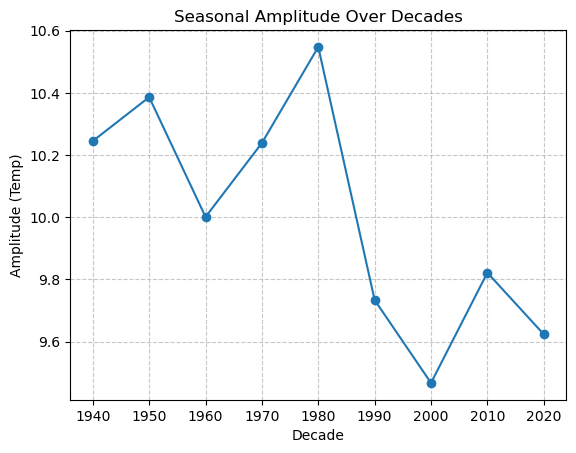

In [87]:
decadal_amplitudes.plot(kind='line', marker='o', title="Seasonal Amplitude Over Decades")
plt.ylabel("Amplitude (Temp)")
plt.xlabel("Decade")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

In [88]:
trend = stl_temp.trend.dropna()
time = range(len(trend))
slope, intercept, r_value, p_value, std_err = linregress(time, trend)
print(f"Trend Slope: {slope:.4f} units/year, p-value: {p_value:.4e}")

Trend Slope: 0.0008 units/year, p-value: 6.2762e-54


In [89]:
#validate StL decomp results
print("Durbin-Watson Statistic:", durbin_watson(stl_temp.resid))

Durbin-Watson Statistic: 1.8641021620957252


In [90]:
# Extract trend and seasonal components
rain_trend = stl_rain.trend
rain_seasonal = stl_rain.seasonal
temp_trend = stl_temp.trend
temp_seasonal = stl_temp.seasonal

# Linear regression for trend forecasting
def forecast_trend(trend, steps=12):
    model = LinearRegression()
    time_index = np.arange(len(trend)).reshape(-1, 1)
    model.fit(time_index, trend)
    future_index = np.arange(len(trend), len(trend) + steps).reshape(-1, 1)
    return model.predict(future_index)

rain_trend_forecast = forecast_trend(rain_trend)
temp_trend_forecast = forecast_trend(temp_trend)

# Extend seasonal components
rain_seasonal_forecast = np.tile(rain_seasonal[-12:], 2)[:12]
temp_seasonal_forecast = np.tile(temp_seasonal[-12:], 2)[:12]

# Combine forecasts
rain_forecast = rain_trend_forecast + rain_seasonal_forecast
temp_forecast = temp_trend_forecast + temp_seasonal_forecast

print("Rain Forecast:", rain_forecast)
print("Temp Forecast:", temp_forecast)

Rain Forecast: [ 39.36623936  59.66060597  85.58036411  47.82372471  36.88064504
  36.29238544  79.84514402  63.92979824 100.62847518  98.38815959
  50.70289722  52.0940517 ]
Temp Forecast: [ 5.96382484  7.33239843  7.33594719  8.77437714 11.96058982 13.74906041
 14.77860256 15.10957541 13.28168721 10.99208268  8.2803862   8.56102254]


In [91]:
# STL forecast errors
rain_actual = monthly_data['rain'][-12:]  # Last 12 months of actual data
temp_actual = monthly_data['temp'][-12:]

rain_rmse = np.sqrt(mean_squared_error(rain_actual, rain_forecast))
rain_mae = mean_absolute_error(rain_actual, rain_forecast)
temp_rmse = np.sqrt(mean_squared_error(temp_actual, temp_forecast))
temp_mae = mean_absolute_error(temp_actual, temp_forecast)

print(f"Rain STL Forecast - RMSE: {rain_rmse}, MAE: {rain_mae}")
print(f"Temp STL Forecast - RMSE: {temp_rmse}, MAE: {temp_mae}")

Rain STL Forecast - RMSE: 31.099864567718516, MAE: 25.96040231921205
Temp STL Forecast - RMSE: 1.665258251817722, MAE: 0.9991225700026076


In [92]:
monthly_data.head()

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,...,temp_lag6,temp_lag12,temp_lag24,rain_trend,rain_seasonal,rain_residual,decade,temp_trend,temp_seasonal,temp_residual
date,,,,,,,,,,,,,,,,,,,,,
1946-01-01,1946,1,59.7,5.463256,60.6,4.225581,2.422791,1014.062636,80.772093,43.796899,...,14.883099,2.948087,7.188556,55.862437,16.477352,-12.639789,1940,10.319188,-4.484887,-0.371045
1946-02-01,1946,2,89.1,6.492283,77.0,5.365512,3.730709,1016.347244,82.976378,34.119685,...,15.062321,7.718111,5.043408,59.327220,-3.678834,33.451614,1940,10.145577,-5.010064,1.356770
1946-03-01,1946,3,34.3,6.487317,117.8,4.836585,2.436260,1014.358211,76.013008,41.146341,...,14.057655,8.772287,6.157813,62.694033,5.284666,-33.678699,1940,9.975910,-3.328680,-0.159913
1946-04-01,1946,4,32.3,8.974164,152.3,7.174164,5.003951,1019.340426,76.939210,42.117021,...,11.807607,9.462003,9.735598,65.934303,-15.908258,-17.726045,1940,9.810080,-1.127786,0.291870
1946-05-01,1946,5,54.6,9.546744,220.9,7.897250,5.973227,1014.969754,78.790159,41.386397,...,8.778939,10.733134,10.605939,69.038355,-10.433874,-4.004481,1940,9.647704,0.344027,-0.444987


In [93]:
# Identify the month of the maximum seasonal component for temperature
temp_seasonal_peaks = monthly_data.groupby('year')['temp_seasonal'].idxmax()
peak_months_temp = monthly_data.loc[temp_seasonal_peaks, 'month']

# Identify the month of the maximum seasonal component for rainfall
rain_seasonal_peaks = monthly_data.groupby('year')['rain_seasonal'].idxmax()
peak_months_rain = monthly_data.loc[rain_seasonal_peaks, 'month']

In [94]:
# Calculate the average peak month per decade for temperature
avg_peak_month_temp = monthly_data.loc[temp_seasonal_peaks].groupby('decade')['month'].mean()

# Calculate the average peak month per decade for rainfall
avg_peak_month_rain = monthly_data.loc[rain_seasonal_peaks].groupby('decade')['month'].mean()

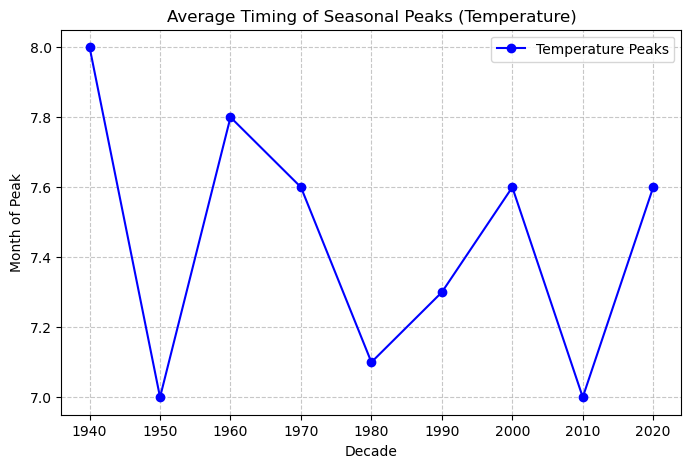

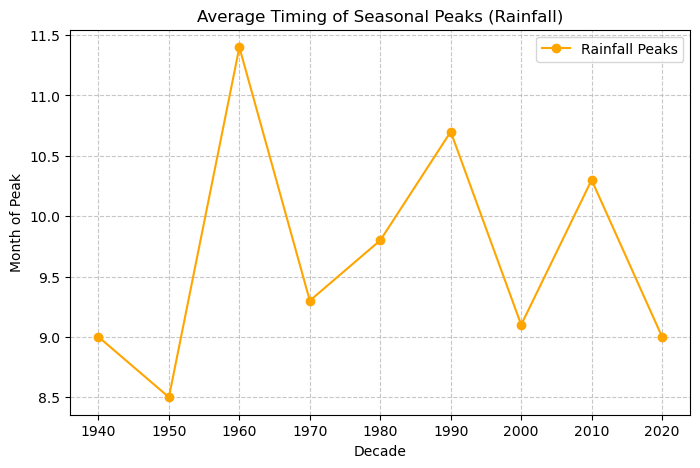

In [95]:
# Plot for temperature
plt.figure(figsize=(8, 5))
avg_peak_month_temp.plot(kind='line', marker='o', label='Temperature Peaks', color='blue')
plt.title('Average Timing of Seasonal Peaks (Temperature)')
plt.ylabel('Month of Peak')
plt.xlabel('Decade')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

# Plot for rainfall
plt.figure(figsize=(8, 5))
avg_peak_month_rain.plot(kind='line', marker='o', label='Rainfall Peaks', color='orange')
plt.title('Average Timing of Seasonal Peaks (Rainfall)')
plt.ylabel('Month of Peak')
plt.xlabel('Decade')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()

In [96]:
# Count frequency of peak months per decade
peak_month_freq = monthly_data.loc[temp_seasonal_peaks].groupby(['decade', 'month']).size()
print(peak_month_freq)

decade  month
1940    8         4
1950    7        10
1960    7         2
        8         8
1970    7         4
        8         6
1980    7         9
        8         1
1990    7         7
        8         3
2000    7         4
        8         6
2010    7        10
2020    7         2
        8         3
dtype: int64


In [97]:
# Linear regression for peak months over decades
decades = avg_peak_month_temp.index.astype(int)
slope, intercept, r_value, p_value, std_err = linregress(decades, avg_peak_month_temp)
print(f"Slope: {slope}, p-value: {p_value}")

Slope: -0.0038333333333333366, p-value: 0.4476772905493247


# Compare Changes over Decades

# Perform Decade-Wise Comparisons

In [98]:
decade_seasonal_data = seasonal_data.groupby(['decade', 'season']).agg({
    'temp': 'mean',
    'rain': 'mean',
    'sun': 'mean'
}).reset_index()

print(decade_seasonal_data)

    decade  season       temp        rain         sun
0     1940  Autumn  10.792676  200.883333  279.183333
1     1940  Spring   8.777926  151.683333  481.783333
2     1940  Summer  14.257741  195.416667  499.566667
3     1940  Winter   5.635737  209.833333  183.183333
4     1950  Autumn  10.515028  208.520000  285.660000
5     1950  Spring   8.613959  141.850000  470.600000
6     1950  Summer  14.397300  218.610000  508.350000
7     1950  Winter   5.620185  186.500000  175.540000
8     1960  Autumn  10.682946  223.670000  278.080000
9     1960  Spring   8.621327  176.820000  433.810000
10    1960  Summer  14.424890  182.380000  493.330000
11    1960  Winter   5.560341  195.310000  167.260000
12    1970  Autumn  10.924478  192.710000  287.800000
13    1970  Spring   8.477994  143.280000  426.690000
14    1970  Summer  14.764178  158.120000  502.920000
15    1970  Winter   6.335551  187.560000  149.560000
16    1980  Autumn  10.889040  194.060000  280.490000
17    1980  Spring   8.68035

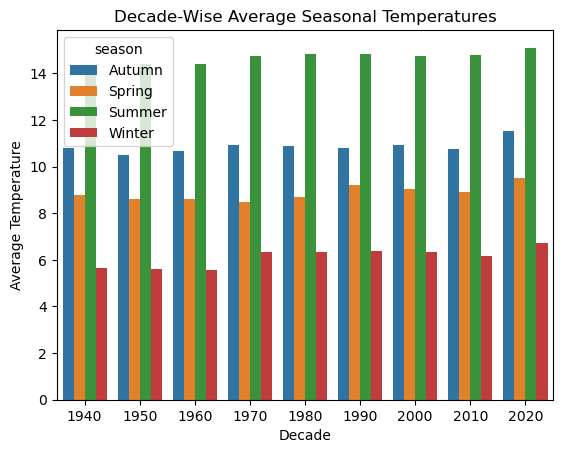

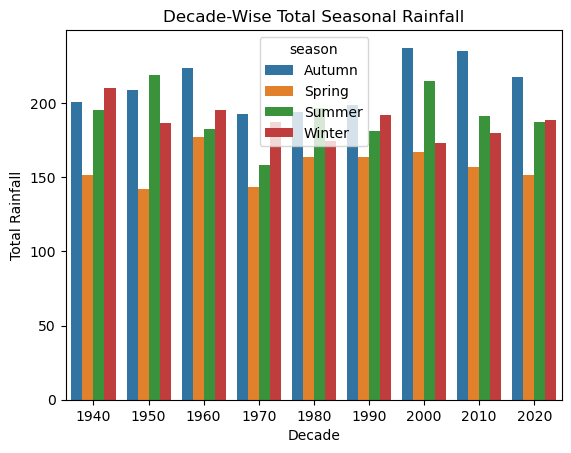

In [99]:
# compare temperature
sns.barplot(data=decade_seasonal_data, x='decade', y='temp', hue='season')
plt.title("Decade-Wise Average Seasonal Temperatures")
plt.xlabel("Decade")
plt.ylabel("Average Temperature")
plt.show()

# compare rainfall
sns.barplot(data=decade_seasonal_data, x='decade', y='rain', hue='season')
plt.title("Decade-Wise Total Seasonal Rainfall")
plt.xlabel("Decade")
plt.ylabel("Total Rainfall")
plt.show()

In [100]:
#look at seasonal peaks each year
seasonal_peaks = monthly_data.groupby(['season', 'year'])['temp'].max().reset_index()

In [101]:
#look at seasonal peaks each year
seasonal_peaks_rain = monthly_data.groupby(['season', 'year'])['rain'].max().reset_index()

In [102]:
#get average max temp for each decade
seasonal_peaks['decade'] = (seasonal_peaks['year'] // 10) * 10
decadal_peaks = seasonal_peaks.groupby(['season', 'decade'])['temp'].mean().reset_index()

In [103]:
#get average max rainfall for each decade
seasonal_peaks_rain['decade'] = (seasonal_peaks_rain['year'] // 10) * 10
decadal_peaks_rain = seasonal_peaks_rain.groupby(['season', 'decade'])['rain'].mean().reset_index()

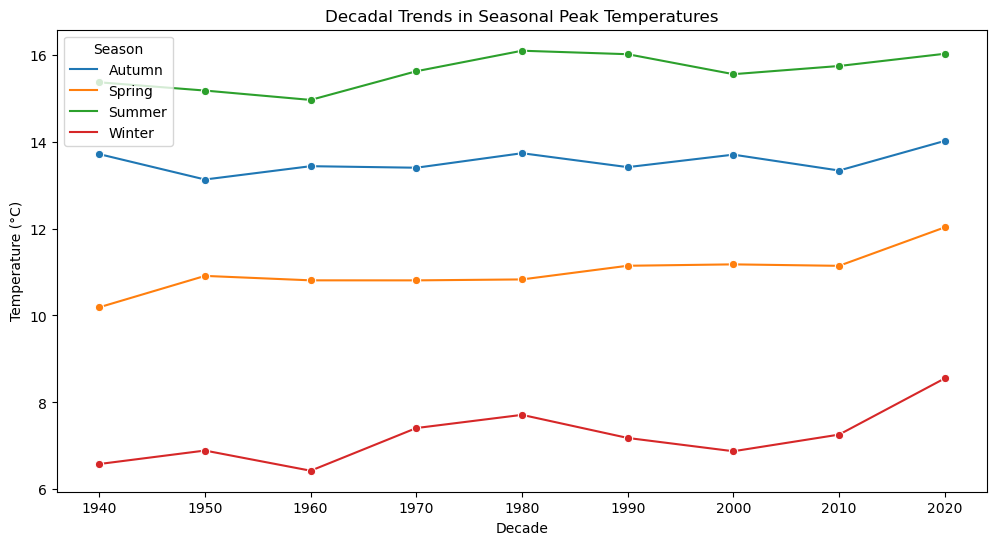

In [104]:
#plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=decadal_peaks, x='decade', y='temp', hue='season', marker='o')
plt.title('Decadal Trends in Seasonal Peak Temperatures')
plt.xlabel('Decade')
plt.ylabel('Temperature (°C)')
plt.legend(title='Season')
plt.show()

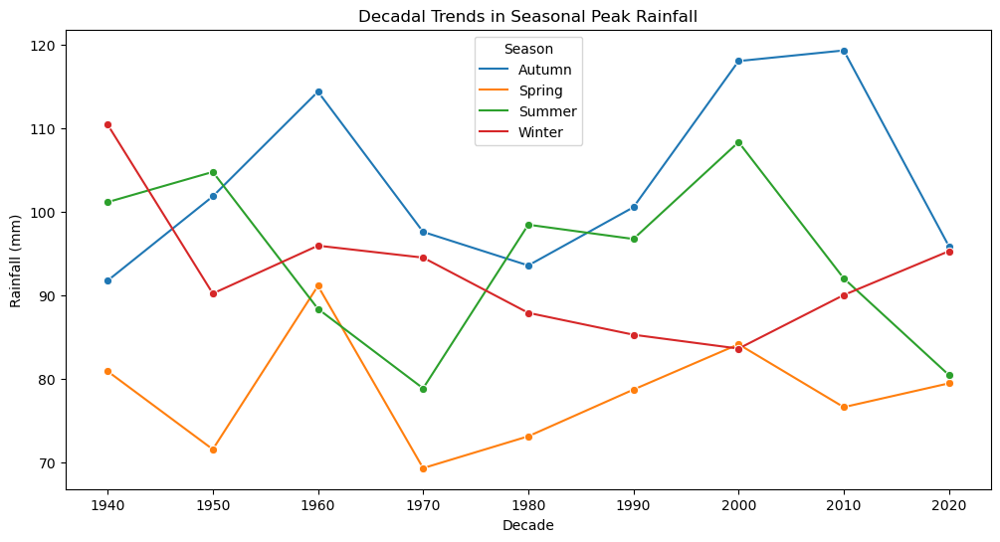

In [105]:
#plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=decadal_peaks_rain, x='decade', y='rain', hue='season', marker='o')
plt.title('Decadal Trends in Seasonal Peak Rainfall')
plt.xlabel('Decade')
plt.ylabel('Rainfall (mm)')
plt.legend(title='Season')
plt.show()

# Analyze Seasonal Lengths Using Thresholds

In [106]:
# Group by season to calculate historical averages
seasonal_stats = daily_data.groupby('season')['temp'].agg(['mean', 'std']).reset_index()
print(seasonal_stats)

   season       mean       std
0  Autumn  10.773817  3.401557
1  Spring   8.840150  2.948965
2  Summer  14.740034  2.189859
3  Winter   5.869407  2.736861


In [107]:
# Calculate percentiles for each season
seasonal_percentiles = daily_data.groupby('season')['temp'].apply(
    lambda x: pd.Series({'lower': x.quantile(0.1), 'upper': x.quantile(0.9)})
).reset_index()

# Preview the seasonal percentiles
print(seasonal_percentiles)

   season level_1       temp
0  Autumn   lower   6.054167
1  Autumn   upper  14.972065
2  Spring   lower   4.914857
3  Spring   upper  12.592000
4  Summer   lower  12.025000
5  Summer   upper  17.627045
6  Winter   lower   2.282843
7  Winter   upper   9.519091


In [108]:
# Pivot the DataFrame to reshape it
seasonal_percentiles_fixed = seasonal_percentiles.pivot(index='season', columns='level_1', values='temp').reset_index()

# Rename columns for clarity
seasonal_percentiles_fixed.columns = ['season', 'lower', 'upper']

# Verify the structure
print(seasonal_percentiles_fixed)

   season      lower      upper
0  Autumn   6.054167  14.972065
1  Spring   4.914857  12.592000
2  Summer  12.025000  17.627045
3  Winter   2.282843   9.519091


In [109]:
# Add an outlier flag based on temperature range
def mark_outliers(row):
    season_row = seasonal_percentiles_fixed[seasonal_percentiles_fixed['season'] == row['season']]
    lower = season_row['lower'].values[0]
    upper = season_row['upper'].values[0]
    return row['temp'] < lower or row['temp'] > upper

# Apply the function to mark outliers
daily_data['is_outlier'] = daily_data.apply(mark_outliers, axis=1)

# Check the outlier distribution
print(daily_data['is_outlier'].value_counts())


is_outlier
False    23602
True      5902
Name: count, dtype: int64


In [110]:
# Count outliers by year and season
outlier_counts = daily_data.groupby(['year', 'season'])['is_outlier'].sum().reset_index(name='outlier_count')

# Total days per season for proportion calculation
total_days = daily_data.groupby(['year', 'season']).size().reset_index(name='total_days')

# Merge and calculate proportion of outliers
outlier_proportions = outlier_counts.merge(total_days, on=['year', 'season'])
outlier_proportions['outlier_proportion'] = outlier_proportions['outlier_count'] / outlier_proportions['total_days']

# Preview the results
print(outlier_proportions.head())

   year  season  outlier_count  total_days  outlier_proportion
0  1944  Autumn             15          91            0.164835
1  1944  Spring             20          92            0.217391
2  1944  Summer             19          92            0.206522
3  1944  Winter             14          91            0.153846
4  1945  Autumn             12          91            0.131868


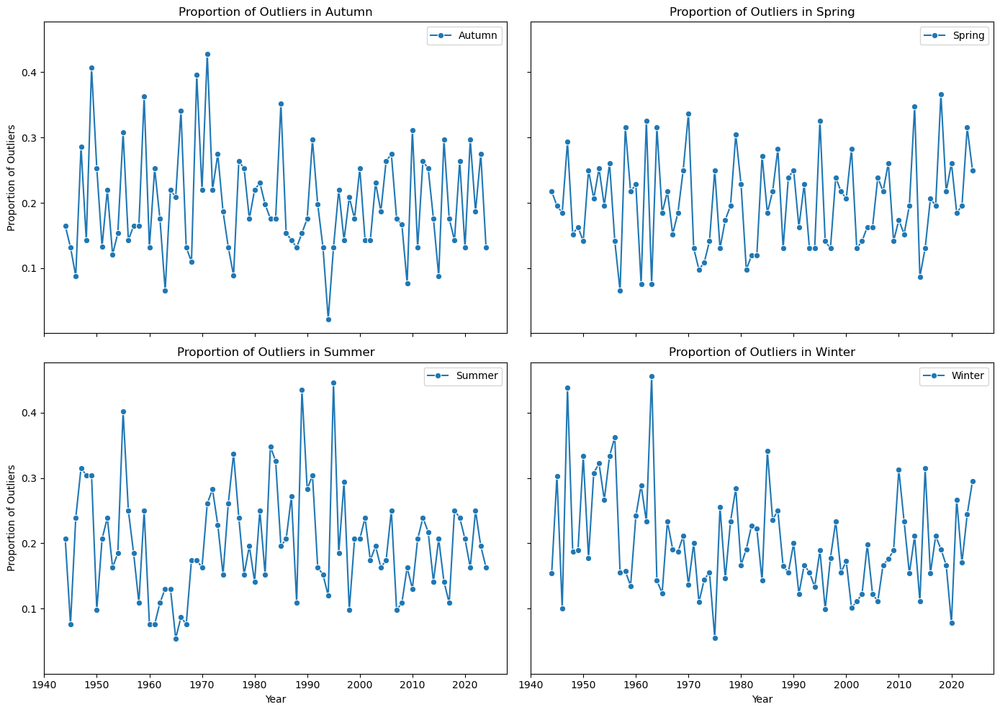

In [111]:
# Set up the subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.flatten()

# Unique seasons
seasons = outlier_proportions['season'].unique()

# Create a subplot for each season
for i, season in enumerate(seasons):
    season_data = outlier_proportions[outlier_proportions['season'] == season]
    
    # Plot proportion of outliers over time for the current season
    sns.lineplot(
        data=season_data,
        x='year',
        y='outlier_proportion',
        ax=axes[i],
        marker='o',
        label=season
    )
    
    # Customize each subplot
    axes[i].set_title(f'Proportion of Outliers in {season}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Proportion of Outliers')
    axes[i].legend(loc='upper right')

# Adjust layout
plt.tight_layout()
plt.show()

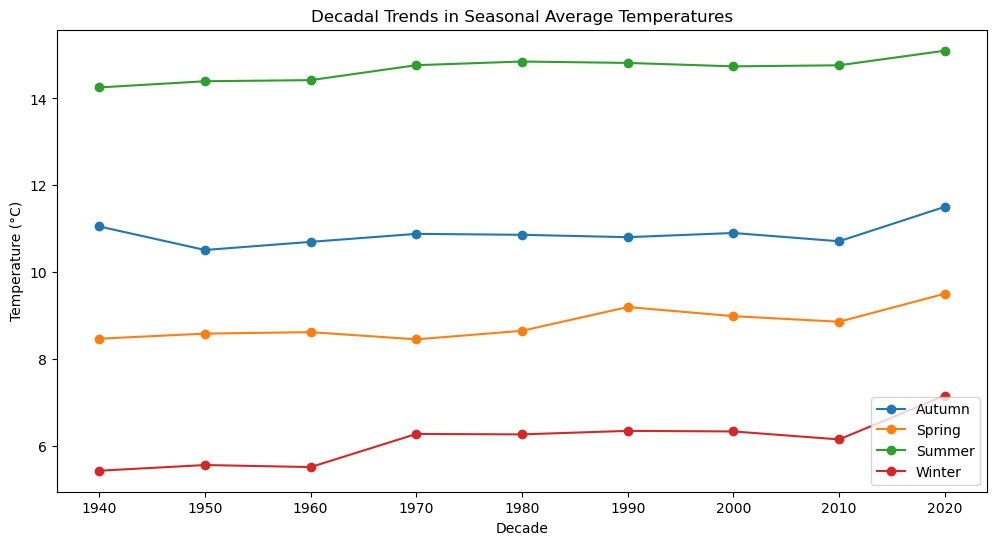

In [112]:
# Aggregate average seasonal temperatures by decade
seasonal_avg_temp = monthly_data.groupby(['season', 'year'])['temp'].mean().reset_index()
seasonal_avg_temp['decade'] = (seasonal_avg_temp['year'] // 10) * 10
decadal_avg_temp = seasonal_avg_temp.groupby(['season', 'decade'])['temp'].mean().reset_index()

# Plot decadal trends
plt.figure(figsize=(12, 6))
for season in decadal_avg_temp['season'].unique():
    # Filter data for the season
    season_data = decadal_avg_temp[decadal_avg_temp['season'] == season]
    plt.plot(season_data['decade'], season_data['temp'], marker='o', label=f'{season}')

plt.title('Decadal Trends in Seasonal Average Temperatures')
plt.xlabel('Decade')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.show()

In [113]:
from pymannkendall import original_test

# Test for trends in spring temperature
spring_temps = seasonal_avg_temp[seasonal_avg_temp['season'] == 'Spring']['temp']
result = original_test(spring_temps)
print(f"Mann-Kendall Test for Spring Temperatures: {result}")

Mann-Kendall Test for Spring Temperatures: Mann_Kendall_Test(trend='increasing', h=True, p=0.005344065748090321, z=2.785527798907766, Tau=0.21389159363842908, s=659.0, var_s=55800.333333333336, slope=0.011115144450557907, intercept=8.293125752842633)


In [114]:
# Function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    mean = np.mean(data)
    std_err = stats.sem(data)  # Standard error of the mean
    t_critical = stats.t.ppf((1 + confidence) / 2, df=len(data) - 1)  # t-value
    margin_of_error = t_critical * std_err
    return mean, mean - margin_of_error, mean + margin_of_error

# Apply CI calculation for each season
seasonal_confidence_intervals = seasonal_avg_temp.groupby('season')['temp'].apply(
    lambda x: calculate_confidence_interval(x)
).reset_index(name='CI')

# Split the CI column into mean, lower, and upper bounds
seasonal_confidence_intervals[['mean', 'lower_bound', 'upper_bound']] = pd.DataFrame(
    seasonal_confidence_intervals['CI'].tolist(), index=seasonal_confidence_intervals.index
)

# Drop the original CI column for clarity
seasonal_confidence_intervals = seasonal_confidence_intervals.drop(columns=['CI'])

In [115]:
print(seasonal_confidence_intervals)

   season       mean  lower_bound  upper_bound
0  Autumn  10.829355    10.671357    10.987353
1  Spring   8.797408     8.635959     8.958856
2  Summer  14.684578    14.530237    14.838919
3  Winter   6.101800     5.903111     6.300488


In [116]:
# Define temperature range for spring based on confidence intervals
spring_bounds = seasonal_confidence_intervals[seasonal_confidence_intervals['season'] == 'Spring']
spring_lower_bound = spring_bounds['lower_bound'].values[0]
spring_upper_bound = spring_bounds['upper_bound'].values[0]

# Identify spring days in the dataset
daily_data['is_spring'] = (daily_data['temp'] >= spring_lower_bound) & (daily_data['temp'] <= spring_upper_bound)

In [117]:
# Create the 'day_of_year' column
daily_data['day_of_year'] = daily_data['day'].dt.dayofyear

# Preview the updated DataFrame
print(daily_data[['day', 'day_of_year']].head())

         day  day_of_year
0 1944-01-01            1
1 1944-01-02            2
2 1944-01-03            3
3 1944-01-04            4
4 1944-01-05            5


In [118]:
spring_start_dates = daily_data[daily_data['is_spring']].groupby('year')['day_of_year'].min().reset_index(name='spring_start')
spring_end_dates = daily_data[daily_data['is_spring']].groupby('year')['day_of_year'].max().reset_index(name='spring_end')

In [119]:
spring_lengths = spring_start_dates.merge(spring_end_dates, on='year')
spring_lengths['spring_length'] = spring_lengths['spring_end'] - spring_lengths['spring_start']

In [120]:
spring_lengths['decade'] = (spring_lengths['year'] // 10) * 10
decadal_lengths = spring_lengths.groupby('decade')['spring_length'].mean().reset_index()

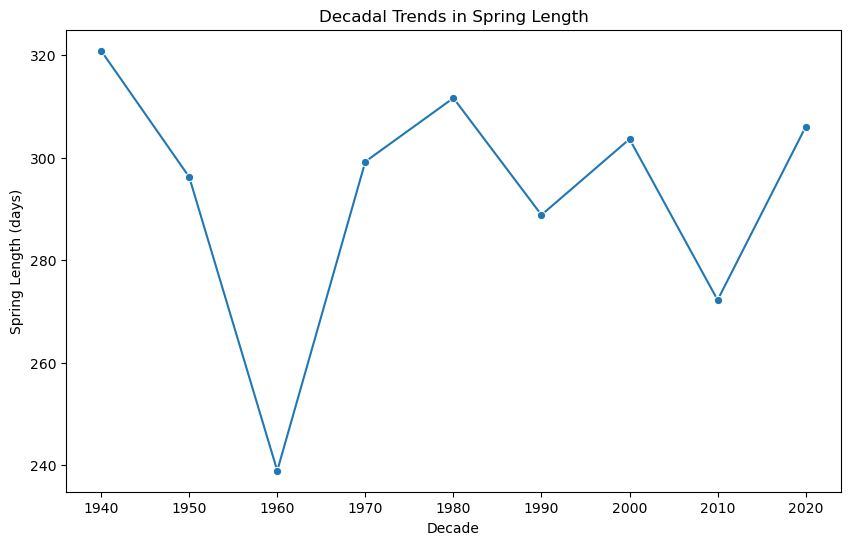

In [121]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=decadal_lengths, x='decade', y='spring_length', marker='o')
plt.title('Decadal Trends in Spring Length')
plt.xlabel('Decade')
plt.ylabel('Spring Length (days)')
plt.show()

In [122]:
daily_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29504 entries, 0 to 29503
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   day             29504 non-null  datetime64[ns]
 1   year            29504 non-null  int32         
 2   rain            29504 non-null  float64       
 3   temp            29504 non-null  float64       
 4   sun             29504 non-null  float64       
 5   wetb            29504 non-null  float64       
 6   dewpt           29504 non-null  float64       
 7   msl             29504 non-null  float64       
 8   rhum            29504 non-null  float64       
 9   clht            29504 non-null  float64       
 10  extreme_temp    29504 non-null  float64       
 11  extreme_rain    29504 non-null  float64       
 12  season_encoded  29504 non-null  int32         
 13  season          29504 non-null  object        
 14  rhum_msl_pca    29504 non-null  float64       
 15  is

# Extreme Weather Events

In [123]:
# Set 'day' as the index
daily_data.set_index('day', inplace=True)

# Define temperature anomaly thresholds
heatwave_threshold = daily_data['temp'].quantile(0.95)  # Top 5% threshold
cold_spell_threshold = daily_data['temp'].quantile(0.05)  # Bottom 5% threshold

# Identify extreme temperature events
daily_data['heatwave'] = (daily_data['temp'] > heatwave_threshold).astype(int)
daily_data['cold_spell'] = (daily_data['temp'] < cold_spell_threshold).astype(int)

# Now, group by year and count extreme events
extreme_events = daily_data.groupby(daily_data.index.year)[['heatwave', 'cold_spell']].sum()

# Display the first few rows to verify
print(extreme_events.head())

      heatwave  cold_spell
day                       
1944        13          16
1945        11          18
1946         8          24
1947        31          61
1948        10          14


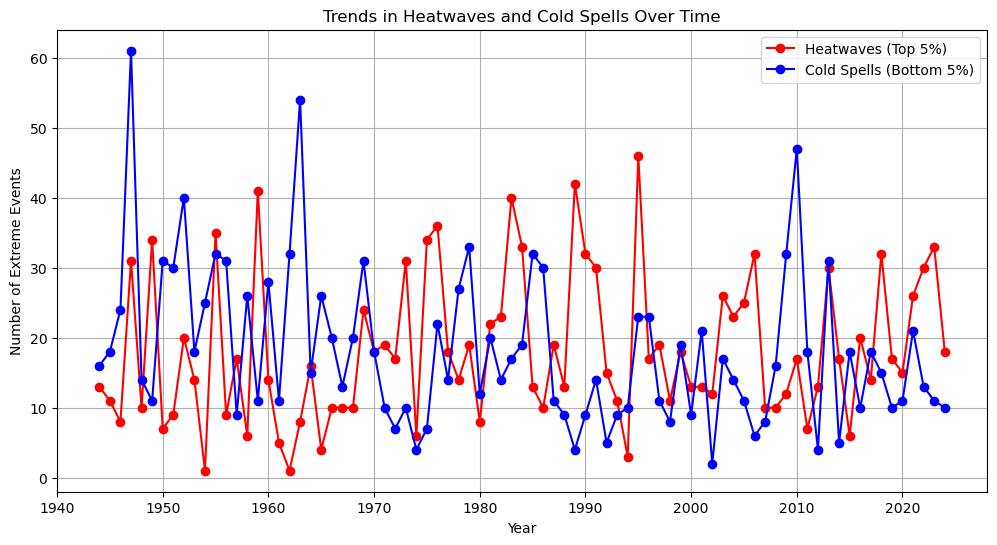

In [124]:
# Plot trends in extreme heatwaves and cold spells
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(extreme_events.index, extreme_events['heatwave'], label="Heatwaves (Top 5%)", color='red', marker='o')
ax.plot(extreme_events.index, extreme_events['cold_spell'], label="Cold Spells (Bottom 5%)", color='blue', marker='o')
ax.set_xlabel("Year")
ax.set_ylabel("Number of Extreme Events")
ax.set_title("Trends in Heatwaves and Cold Spells Over Time")
ax.legend()
ax.grid()
plt.show()

In [125]:
# Perform linear regression to quantify trends
heatwave_slope, _, heatwave_r, heatwave_p, _ = linregress(extreme_events.index, extreme_events['heatwave'])
cold_spell_slope, _, cold_spell_r, cold_spell_p, _ = linregress(extreme_events.index, extreme_events['cold_spell'])

# Print trend results
print(f"Heatwave Trend: {heatwave_slope:.4f} events per year, p-value: {heatwave_p:.4f}")
print(f"Cold Spell Trend: {cold_spell_slope:.4f} events per year, p-value: {cold_spell_p:.4f}")

Heatwave Trend: 0.0765 events per year, p-value: 0.1257
Cold Spell Trend: -0.1623 events per year, p-value: 0.0019


In [126]:
daily_data['decade'] = (daily_data.index.year // 10) * 10

In [127]:
# Calculate average temperature per decade for each season
seasonal_trends = daily_data.groupby(['decade', 'season'])['temp'].mean().reset_index()

# Create an interactive line chart using Plotly
fig = px.line(seasonal_trends, x="decade", y="temp", color="season",
              markers=True, title="Interactive Seasonal Temperature Trends Over Decades",
              labels={"temp": "Average Temperature (°C)", "decade": "Decade", "season": "Season"})

# Show the interactive chart
fig.show()

# Machine Learning: Random Forest Vs GX Boost

In [128]:
from sklearn.preprocessing import StandardScaler

# Define features to scale
features_to_scale = [
    'rain', 'temp', 'sun', 'dewpt', 'msl', 'rhum', 'clht',
    'temp_lag1', 'temp_lag3', 'temp_lag6', 'temp_lag12', 'temp_lag24'
]

# Initialize StandardScaler
scaler = StandardScaler()

# Apply scaling
monthly_data[features_to_scale] = scaler.fit_transform(monthly_data[features_to_scale])

# Display scaled data
monthly_data.head()

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,...,temp_lag6,temp_lag12,temp_lag24,rain_trend,rain_seasonal,rain_residual,decade,temp_trend,temp_seasonal,temp_residual
date,,,,,,,,,,,,,,,,,,,,,
1946-01-01,1946,1,-0.083649,-1.279480,-1.033638,4.225581,-1.317581,0.184383,-0.051850,-0.391989,...,1.320260,-1.967829,-0.794275,55.862437,16.477352,-12.639789,1940,10.319188,-4.484887,-0.371045
1946-02-01,1946,2,0.772133,-0.995727,-0.730544,5.365512,-0.926341,0.576338,0.502339,-0.631103,...,1.369685,-0.653554,-1.385661,59.327220,-3.678834,33.451614,1940,10.145577,-5.010064,1.356770
1946-03-01,1946,3,-0.822999,-0.997097,0.023493,4.836585,-1.313552,0.235093,-1.248353,-0.457482,...,1.092624,-0.363099,-1.078436,62.694033,5.284666,-33.678699,1940,9.975910,-3.328680,-0.159913
1946-04-01,1946,4,-0.881215,-0.311353,0.661099,7.174164,-0.545473,1.089857,-1.015492,-0.433497,...,0.472119,-0.173063,-0.092092,65.934303,-15.908258,-17.726045,1940,9.810080,-1.127786,0.291870
1946-05-01,1946,5,-0.232101,-0.153465,1.928917,7.897250,-0.255531,0.340011,-0.550137,-0.451550,...,-0.363109,0.177169,0.147848,69.038355,-10.433874,-4.004481,1940,9.647704,0.344027,-0.444987


# Regression Machine Learning: Detect Changes in Weather Variables Over the Decades and Looking Ahead 🗓️

In [129]:
ML_monthly_data = monthly_data

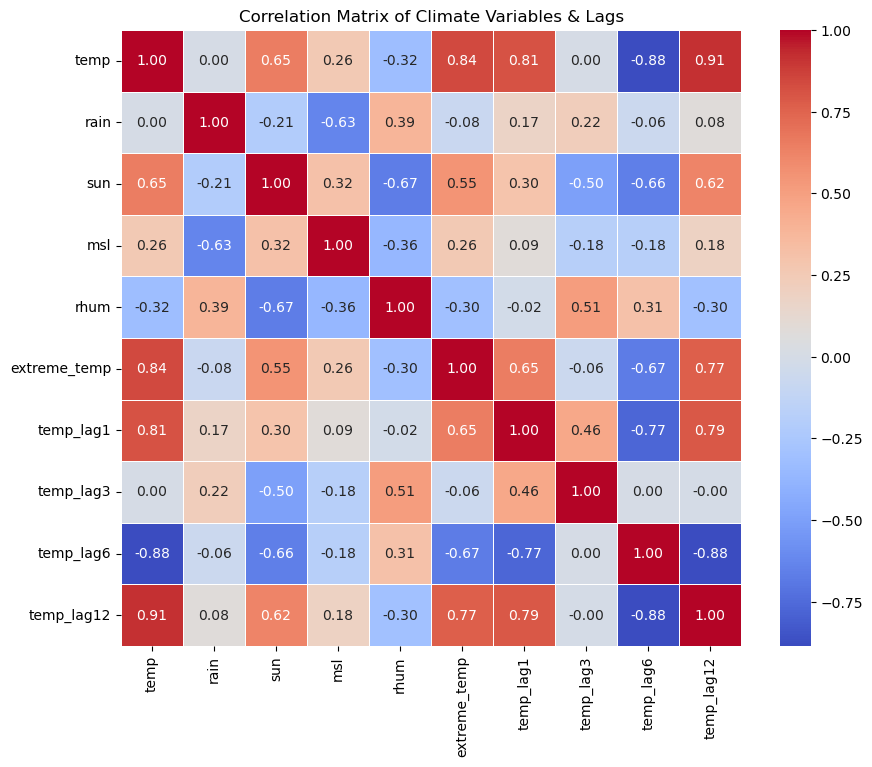

In [130]:
# Select relevant features for correlation analysis
correlation_features = ['temp', 'rain', 'sun', 'msl', 'rhum', 'extreme_temp', 
                        'temp_lag1', 'temp_lag3', 'temp_lag6', 'temp_lag12']

# Compute correlation matrix
corr_matrix = ML_monthly_data[correlation_features].corr()

# Plot heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Climate Variables & Lags")
plt.show()



# Experiment 2: Use Correlation Results

In [131]:
#assign features and target
X = ML_monthly_data[['temp_lag12', 'temp_lag1', 'extreme_temp', 'sun']]
y_temp = ML_monthly_data['temp'] 

In [132]:
# Train-test split
X_train, X_test, y_train_temp, y_test_temp = train_test_split(X, y_temp, test_size=0.2, random_state=42)

In [133]:
# Train models
rf_temp = RandomForestRegressor(random_state=42).fit(X_train, y_train_temp)
xgb_temp = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train, y_train_temp)

In [134]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf_temp.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

        Feature  Importance
2  extreme_temp    0.881179
0    temp_lag12    0.050382
1     temp_lag1    0.040138
3           sun    0.028301


In [135]:
#Measure performance of Random Forest
y_pred_rf_temp = rf_temp.predict(X_test)
rf_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_rf_temp))
rf_mae_temp = mean_absolute_error(y_test_temp, y_pred_rf_temp)
rf_r2_temp = r2_score(y_test_temp, y_pred_rf_temp)

In [136]:
# Print metrics
print(f"RF Temp - RMSE: {rf_rmse_temp}, MAE: {rf_mae_temp}, R²: {rf_r2_temp}")

RF Temp - RMSE: 0.27863966663291584, MAE: 0.19417079989383987, R²: 0.915553486618055


In [137]:
# Extract standard deviation of temp to scale back up
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale for Random Forest
rf_rmse_temp_original = rf_rmse_temp * temp_std  # Inverse transform RMSE
rf_mae_temp_original = rf_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {rf_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {rf_mae_temp_original:.3f}")
print(f"RF Temp - R²: {rf_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 1.010
 RF Temp - MAE (°C): 0.704
RF Temp - R²: 0.92 (No Scaling Needed)


In [138]:
# Predictions using XGBoost for temperature
y_pred_xgb_temp = xgb_temp.predict(X_test)
# Calculate metrics for XGBoost
xgb_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_xgb_temp))
xgb_mae_temp = mean_absolute_error(y_test_temp, y_pred_xgb_temp)
xgb_r2_temp = r2_score(y_test_temp, y_pred_xgb_temp)

In [139]:
# Print results
print(f"XGB Temp - RMSE: {xgb_rmse_temp:.2f}, MAE: {xgb_mae_temp:.2f}, R²: {xgb_r2_temp:.2f}")

XGB Temp - RMSE: 0.29, MAE: 0.21, R²: 0.91


In [140]:
# Extract standard deviation
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale for Random Forest
xgb_rmse_temp_original = xgb_rmse_temp * temp_std  # Inverse transform RMSE
xgb_mae_temp_original = xgb_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {xgb_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {xgb_mae_temp_original:.3f}")
print(f" RF Temp - R²: {xgb_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 1.069
 RF Temp - MAE (°C): 0.766
 RF Temp - R²: 0.91 (No Scaling Needed)


In [141]:
ML_monthly_data = monthly_data

In [142]:
# Creating monthly lags and rolling averages
ML_monthly_data['temp_lag1'] = ML_monthly_data['temp'].shift(1)
ML_monthly_data['rain_lag1'] = ML_monthly_data['rain'].shift(1)
ML_monthly_data['temp_rolling_mean_3'] = ML_monthly_data['temp'].rolling(window=3).mean()
ML_monthly_data['rain_rolling_std_12'] = ML_monthly_data['rain'].rolling(window=12).std()
ML_monthly_data.dropna(inplace=True)

In [143]:
ML_monthly_data.head()

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,...,rain_trend,rain_seasonal,rain_residual,decade,temp_trend,temp_seasonal,temp_residual,rain_lag1,temp_rolling_mean_3,rain_rolling_std_12
date,,,,,,,,,,,,,,,,,,,,,
1946-12-01,1946,12,0.454853,-1.418068,-0.928294,3.991833,-1.257791,-0.117848,0.914312,-0.343730,...,88.719693,20.234218,-30.753911,1940,8.741848,-4.219223,0.438042,1.124343,-0.611106,1.021635
1947-01-01,1947,1,0.213255,-1.623898,-1.613951,3.101831,-1.663808,-0.253772,0.101765,-0.572984,...,88.295582,13.334845,-31.730428,1940,8.803932,-4.448445,-0.141261,0.454853,-1.203447,1.012604
1947-02-01,1947,2,-0.025433,-2.650176,-1.687876,-0.481320,-2.801513,-0.842342,-0.059733,-0.863164,...,86.115695,-4.714213,-19.701482,1940,8.899541,-4.951678,-3.455431,0.213255,-1.897381,1.013385
1947-03-01,1947,3,2.466233,-1.651103,-0.717607,3.168868,-1.548183,-2.455378,0.856147,-0.674892,...,82.953160,2.110824,62.236015,1940,9.006330,-3.262345,-1.628420,-0.025433,-1.975059,1.107436
1947-04-01,1947,4,0.262739,-0.514800,0.688821,6.229806,-0.954339,-0.211625,-1.851121,-0.283238,...,79.943162,-15.790969,7.447807,1940,9.116593,-1.242573,0.362344,2.466233,-1.605360,1.011019


# Feature Set 1: Core Climate Variables

## Define Features and Targets

In [144]:
# Define features and target
X = ML_monthly_data[[ 'rain',  'sun', 'msl', 'rhum']]
y_temp = ML_monthly_data['temp'] 

## Split into Train and Test

In [145]:
# Train-test split
X_train, X_test, y_train_temp, y_test_temp = train_test_split(X, y_temp, test_size=0.2, random_state=42)

## Train Models

In [146]:
# Train models
rf_temp = RandomForestRegressor(random_state=42).fit(X_train, y_train_temp)
xgb_temp = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train, y_train_temp)

In [147]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf_temp.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

  Feature  Importance
1     sun    0.588537
2     msl    0.166065
0    rain    0.128708
3    rhum    0.116690


In [148]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': xgb_temp.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

  Feature  Importance
1     sun    0.586090
2     msl    0.167459
3    rhum    0.145045
0    rain    0.101406


In [149]:
# Evaluate Random Forest
y_pred_rf_temp = rf_temp.predict(X_test)
rf_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_rf_temp))
rf_mae_temp = mean_absolute_error(y_test_temp, y_pred_rf_temp)
rf_r2_temp = r2_score(y_test_temp, y_pred_rf_temp)


In [150]:
# Print metrics
print(f"RF Temp - RMSE: {rf_rmse_temp}, MAE: {rf_mae_temp}, R²: {rf_r2_temp}")

RF Temp - RMSE: 0.6750597175753039, MAE: 0.5431740620664273, R²: 0.5681754950317303


In [151]:
# Extract standard deviation of 'temp' from the fitted StandardScaler
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale for Random Forest
rf_rmse_temp_original = rf_rmse_temp * temp_std  # Inverse transform RMSE
rf_mae_temp_original = rf_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {rf_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {rf_mae_temp_original:.3f}")
print(f"RF Temp - R²: {rf_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 2.448
 RF Temp - MAE (°C): 1.970
RF Temp - R²: 0.57 (No Scaling Needed)


In [152]:
# Predictions using XGBoost for temperature
y_pred_xgb_temp = xgb_temp.predict(X_test)
# Calculate metrics for XGBoost
xgb_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_xgb_temp))
xgb_mae_temp = mean_absolute_error(y_test_temp, y_pred_xgb_temp)
xgb_r2_temp = r2_score(y_test_temp, y_pred_xgb_temp)


In [153]:
# Print results
print(f"XGB Temp - RMSE: {xgb_rmse_temp:.2f}, MAE: {xgb_mae_temp:.2f}, R²: {xgb_r2_temp:.2f}")

XGB Temp - RMSE: 0.71, MAE: 0.57, R²: 0.52


In [154]:
# Extract standard deviation 
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale for Random Forest
xgb_rmse_temp_original = xgb_rmse_temp * temp_std  # Inverse transform RMSE
xgb_mae_temp_original = xgb_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {xgb_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {xgb_mae_temp_original:.3f}")
print(f" RF Temp - R²: {xgb_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 2.591
 RF Temp - MAE (°C): 2.070
 RF Temp - R²: 0.52 (No Scaling Needed)


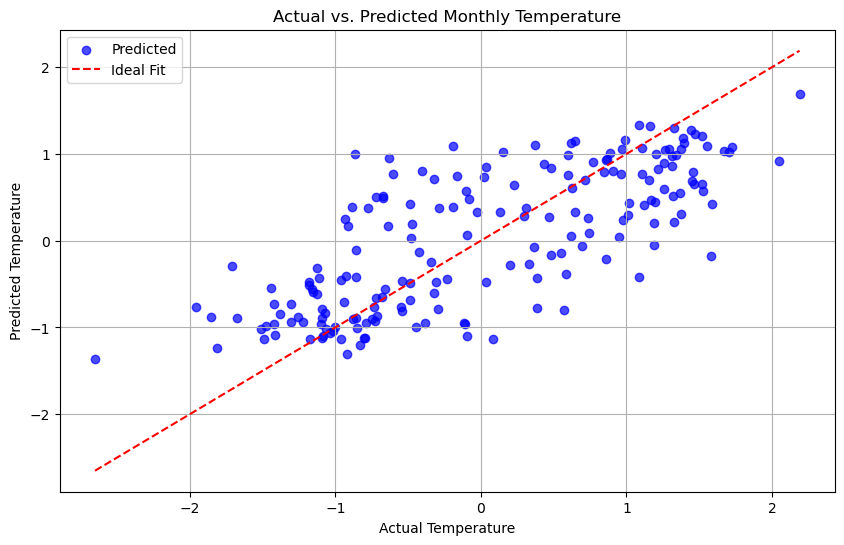

In [155]:
# Predictions for the test set
y_pred_rf = rf_temp.predict(X_test)

# Plot actual vs. predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_rf, alpha=0.7, color='blue', label='Predicted')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature")
plt.legend()
plt.grid(True)
plt.show()

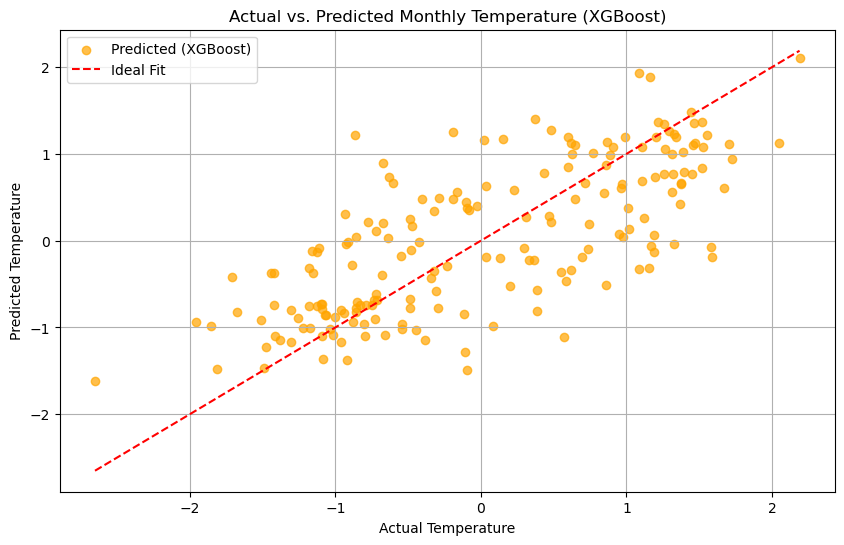

In [156]:
# Scatter plot for XGBoost
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_xgb_temp, alpha=0.7, color='orange', label='Predicted (XGBoost)')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature (XGBoost)")
plt.legend()
plt.grid(True)
plt.show()

# Include Lagged Features

In [157]:
#filter features
ML_monthly_data = monthly_data[[ 'rain', 'temp', 'sun', 'msl', 'rhum',  'extreme_temp', 'temp_lag3','temp_lag6','temp_lag1','temp_lag12']]

In [158]:
# Define features and target
X = ML_monthly_data[[  'sun', 'msl', 'rhum', 'extreme_temp', 'temp_lag3','temp_lag6','temp_lag1','temp_lag12']]
y_temp = ML_monthly_data['temp'] 

In [159]:
# Train-test split
X_train, X_test, y_train_temp, y_test_temp = train_test_split(X, y_temp, test_size=0.2, random_state=42)

In [160]:
# Train models
rf_temp2 = RandomForestRegressor(random_state=42).fit(X_train, y_train_temp)
xgb_temp2 = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train, y_train_temp)

In [161]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf_temp2.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

        Feature  Importance
3  extreme_temp    0.851738
5     temp_lag6    0.060665
7    temp_lag12    0.031211
6     temp_lag1    0.018710
0           sun    0.015019
2          rhum    0.008160
4     temp_lag3    0.007268
1           msl    0.007229


In [162]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': xgb_temp2.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

        Feature  Importance
3  extreme_temp    0.939999
5     temp_lag6    0.031474
7    temp_lag12    0.008813
6     temp_lag1    0.008036
0           sun    0.003575
4     temp_lag3    0.003209
2          rhum    0.002477
1           msl    0.002416


In [163]:
# Evaluate Random Forest
y_pred_rf_temp = rf_temp2.predict(X_test)
rf2_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_rf_temp))
rf2_mae_temp = mean_absolute_error(y_test_temp, y_pred_rf_temp)
rf_r2_temp = r2_score(y_test_temp, y_pred_rf_temp)

In [164]:
# Print metrics
print(f"RF Temp - RMSE: {rf2_rmse_temp}, MAE: {rf_mae_temp}, R²: {rf_r2_temp}")

RF Temp - RMSE: 0.2657471763143148, MAE: 0.5431740620664273, R²: 0.9330793401758619


In [165]:
#scale
rf2_rmse_temp_original = rf2_rmse_temp * temp_std  # Inverse transform RMSE
rf2_mae_temp_original = rf2_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {rf2_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {rf2_mae_temp_original:.3f}")
print(f" RF Temp - R²: {rf_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 0.964
 RF Temp - MAE (°C): 0.668
 RF Temp - R²: 0.93 (No Scaling Needed)


In [166]:
# Predictions using XGBoost for temperature
y_pred_xgb_temp = xgb_temp2.predict(X_test)
# Calculate metrics for XGBoost
xgb_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_xgb_temp))
xgb_mae_temp = mean_absolute_error(y_test_temp, y_pred_xgb_temp)
xgb_r2_temp = r2_score(y_test_temp, y_pred_xgb_temp)

In [167]:
# Print results
print(f"XGB Temp - RMSE: {xgb_rmse_temp:.2f}, MAE: {xgb_mae_temp:.2f}, R²: {xgb_r2_temp:.2f}")

XGB Temp - RMSE: 0.27, MAE: 0.19, R²: 0.93


In [168]:
#scale
xgb_rmse_temp_original = xgb_rmse_temp * temp_std  # Inverse transform RMSE
xgb_mae_temp_original = xgb_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" XGB Temp - RMSE (°C): {xgb_rmse_temp_original:.3f}")
print(f" XGB Temp - MAE (°C): {xgb_mae_temp_original:.3f}")
print(f" XGB Temp - R²: {xgb_r2_temp:.2f} (No Scaling Needed)")

 XGB Temp - RMSE (°C): 0.995
 XGB Temp - MAE (°C): 0.686
 XGB Temp - R²: 0.93 (No Scaling Needed)


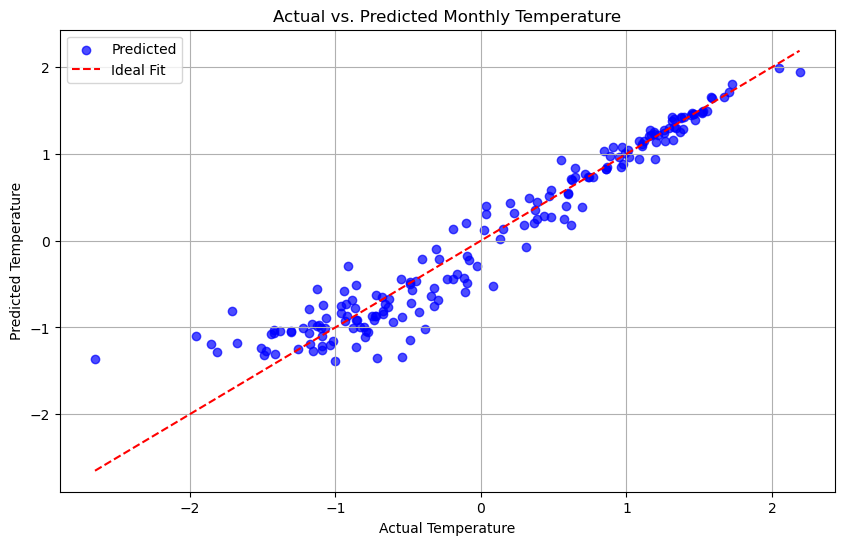

In [169]:
# Predictions for the test set
y_pred_rf = rf_temp2.predict(X_test)

# Plot actual vs. predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_rf, alpha=0.7, color='blue', label='Predicted')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature")
plt.legend()
plt.grid(True)
plt.show()

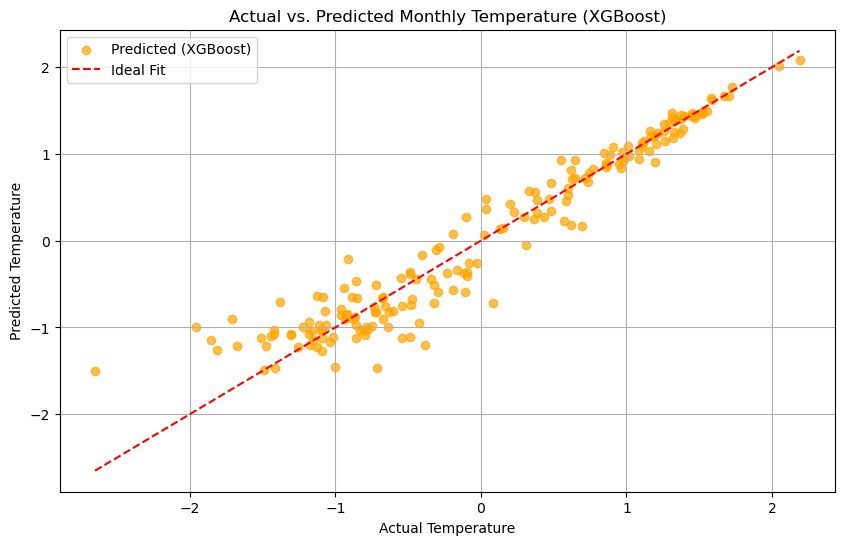

In [170]:
# Scatter plot for XGBoost
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_xgb_temp, alpha=0.7, color='orange', label='Predicted (XGBoost)')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature (XGBoost)")
plt.legend()
plt.grid(True)
plt.show()

# Refine Further

In [171]:
#new target features
ML_monthly_data = monthly_data[[ 'rain', 'temp', 'sun', 'msl', 'rhum', 'extreme_temp', 'temp_lag1','temp_lag3','temp_lag6','temp_lag12']]

In [172]:
# Define features and target
X = ML_monthly_data[[ 'sun', 'msl', 'rhum', 'extreme_temp','temp_lag12']]
y_temp = ML_monthly_data['temp'] 

In [173]:
# Train-test split
X_train, X_test, y_train_temp, y_test_temp = train_test_split(X, y_temp, test_size=0.2, random_state=42)

In [174]:
y_test_aligned = y_test_temp.loc[X_test.index]

In [175]:
# Train models
rf_temp3 = RandomForestRegressor(random_state=42).fit(X_train, y_train_temp)
xgb_temp3 = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train, y_train_temp)

In [176]:
# Get feature importance
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf_temp3.feature_importances_})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Display feature importance
print(feature_importances)

        Feature  Importance
3  extreme_temp    0.880677
4    temp_lag12    0.062035
0           sun    0.023355
2          rhum    0.017539
1           msl    0.016394


In [177]:
# Evaluate Random Forest
y_pred_rf_temp = rf_temp3.predict(X_test)
rf3_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_rf_temp))
rf3_mae_temp = mean_absolute_error(y_test_temp, y_pred_rf_temp)
rf_r2_temp = r2_score(y_test_temp, y_pred_rf_temp)

In [178]:
# Print metrics
print(f"RF Temp - RMSE: {rf3_rmse_temp}, MAE: {rf3_mae_temp}, R²: {rf_r2_temp}")

RF Temp - RMSE: 0.3012599328768844, MAE: 0.21012501781845783, R²: 0.913998575053757


In [179]:
#scale
rf3_rmse_temp_original = rf3_rmse_temp * temp_std  # Inverse transform RMSE
rf3_mae_temp_original = rf3_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" RF Temp - RMSE (°C): {rf3_rmse_temp_original:.3f}")
print(f" RF Temp - MAE (°C): {rf3_mae_temp_original:.3f}")
print(f" RF Temp - R²: {rf_r2_temp:.2f} (No Scaling Needed)")

 RF Temp - RMSE (°C): 1.093
 RF Temp - MAE (°C): 0.762
 RF Temp - R²: 0.91 (No Scaling Needed)


In [180]:
# Predictions using XGBoost for temperature
y_pred_xgb_temp = xgb_temp3.predict(X_test)
# Calculate metrics for XGBoost
xgb3_rmse_temp = np.sqrt(mean_squared_error(y_test_temp, y_pred_xgb_temp))
xgb3_mae_temp = mean_absolute_error(y_test_temp, y_pred_xgb_temp)
xgb3_r2_temp = r2_score(y_test_temp, y_pred_xgb_temp)


In [181]:
# Print results
print(f"XGB Temp - RMSE: {xgb3_rmse_temp:.2f}, MAE: {xgb3_mae_temp:.2f}, R²: {xgb3_r2_temp:.2f}")

XGB Temp - RMSE: 0.34, MAE: 0.23, R²: 0.89


In [182]:
#scale
xgb3_rmse_temp_original = xgb3_rmse_temp * temp_std  # Inverse transform RMSE
xgb3_mae_temp_original = xgb3_mae_temp * temp_std  # Inverse transform MAE

# Print corrected values
print(f" XGB Temp - RMSE (°C): {xgb3_rmse_temp_original:.3f}")
print(f" XGB Temp - MAE (°C): {xgb3_mae_temp_original:.3f}")
print(f" XGB Temp - R²: {xgb3_r2_temp:.2f} (No Scaling Needed)")

 XGB Temp - RMSE (°C): 1.228
 XGB Temp - MAE (°C): 0.841
 XGB Temp - R²: 0.89 (No Scaling Needed)


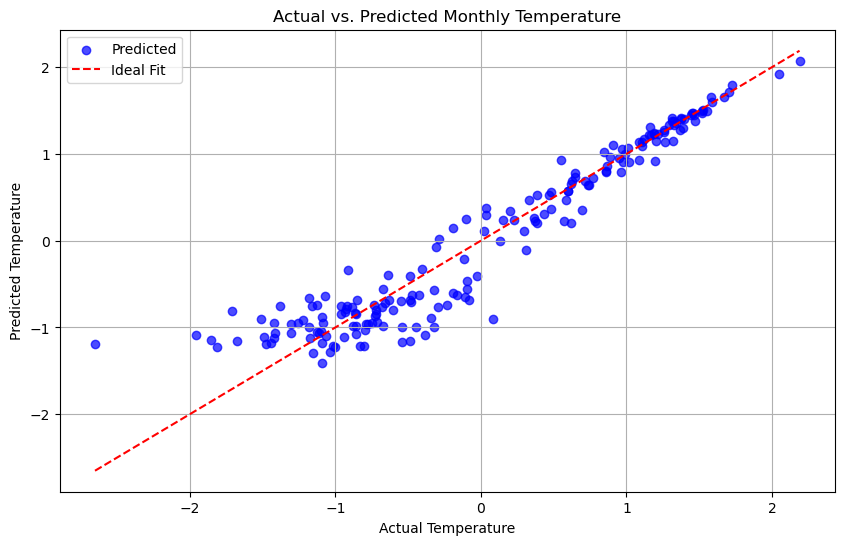

In [183]:
# Predictions for the test set
y_pred_rf = rf_temp3.predict(X_test)

# Plot actual vs. predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_rf, alpha=0.7, color='blue', label='Predicted')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature")
plt.legend()
plt.grid(True)
plt.show()

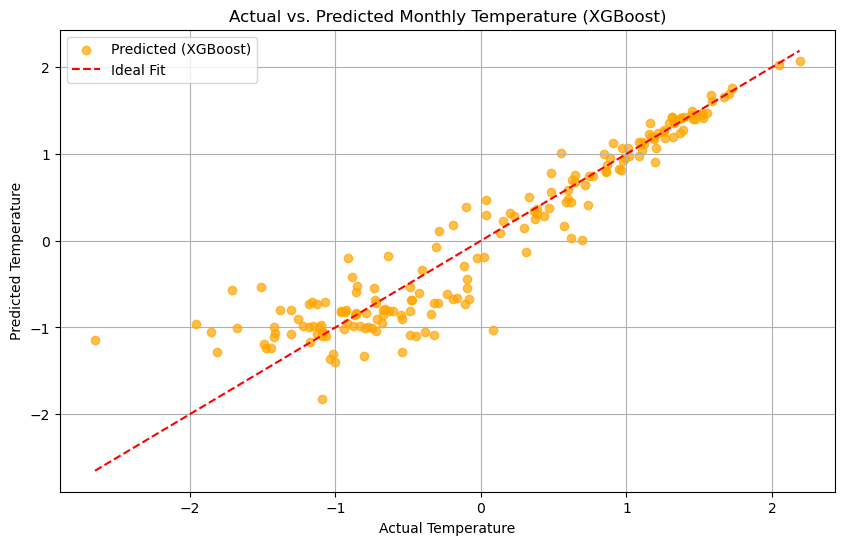

In [184]:
# Scatter plot for XGBoost
plt.figure(figsize=(10, 6))
plt.scatter(y_test_temp, y_pred_xgb_temp, alpha=0.7, color='orange', label='Predicted (XGBoost)')
plt.plot([y_test_temp.min(), y_test_temp.max()], [y_test_temp.min(), y_test_temp.max()], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel("Actual Temperature")
plt.ylabel("Predicted Temperature")
plt.title("Actual vs. Predicted Monthly Temperature (XGBoost)")
plt.legend()
plt.grid(True)
plt.show()

In [185]:
# Set the feature groups
feature_sets = {
    "Set 1": ['rain', 'sun', 'msl', 'rhum'],
    "Set 2": ['temp_lag12', 'temp_lag1', 'extreme_temp', 'sun'],
    "Set 3": ['sun', 'msl', 'rhum', 'extreme_temp', 'temp_lag3', 'temp_lag6', 'temp_lag1', 'temp_lag12'],
    "Set 4": ['sun', 'extreme_temp', 'temp_lag12', 'msl', 'rhum']
}

# Function to compute VIF
def compute_vif(df, feature_list):
    X = df[feature_list].dropna()  # Drop missing values to avoid errors
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

# Compute VIF for each feature set
vif_results = {set_name: compute_vif(ML_monthly_data, features) for set_name, features in feature_sets.items()}

# Show results
for set_name, vif_df in vif_results.items():
    print(f"\nVIF Results for {set_name}")
    print(vif_df)


VIF Results for Set 1
  Feature       VIF
0    rain  1.783030
1     sun  1.860808
2     msl  1.765077
3    rhum  2.019982

VIF Results for Set 2
        Feature       VIF
0    temp_lag12  5.114111
1     temp_lag1  3.292166
2  extreme_temp  1.751231
3           sun  2.022060

VIF Results for Set 3
        Feature       VIF
0           sun  4.132433
1           msl  1.180098
2          rhum  2.059833
3  extreme_temp  1.823881
4     temp_lag3  3.439979
5     temp_lag6  6.260900
6     temp_lag1  7.518520
7    temp_lag12  6.914004

VIF Results for Set 4
        Feature       VIF
0           sun  2.806287
1  extreme_temp  1.741267
2    temp_lag12  2.289025
3           msl  1.178886
4          rhum  1.960051


# Model 4 Appears to Have the Best Result so We will Use These Features

# Improve Metrics

In [186]:
#create parameter grid for grid search
param_grid = {
    'n_estimators': [100, 200, 50],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

In [187]:
#perform gridsearch
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=2
)

In [188]:
#serach parameters
grid_search.fit(X_train, y_train_temp)
print("Best Parameters:", grid_search.best_params_)

Fitting 3 folds for each of 108 candidates, totalling 324 fits
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, min_samples_leaf=1

[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time= 

[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time= 

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimato

In [189]:
# Define the model with the best parameters
best_rf_model = RandomForestRegressor(
    max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=200
)

# Train the model on the training data
best_rf_model.fit(X_train, y_train_temp)

# Evaluate on the test data
y_pred_best_rf = best_rf_model.predict(X_test)

In [190]:
# Calculate metrics
RFrmse = np.sqrt(mean_squared_error(y_test_temp, y_pred_best_rf))
RFmae = mean_absolute_error(y_test_temp, y_pred_best_rf)
RFr2 = r2_score(y_test_temp, y_pred_best_rf)

# Print results
print(f"Tuned RF Model - RMSE: {RFrmse:.2f}, MAE: {RFmae:.2f}, R²: {RFr2:.2f}")

Tuned RF Model - RMSE: 0.30, MAE: 0.21, R²: 0.92


In [191]:
# Extract mean and standard deviation for scaling
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale
rmse_rf_original = 0.3 * temp_std  # Inverse transform RMSE
mae_rf_original = 0.21 * temp_std  # Inverse transform MAE

# Print corrected values
print(f"Tuned RF Model - RMSE (°C): {rmse_rf_original:.3f}")
print(f"Tuned RF Model - MAE (°C): {mae_rf_original:.3f}")
print(f"Tuned RF Model - R²: 0.92 (No Scaling Needed)")

Tuned RF Model - RMSE (°C): 1.088
Tuned RF Model - MAE (°C): 0.762
Tuned RF Model - R²: 0.92 (No Scaling Needed)


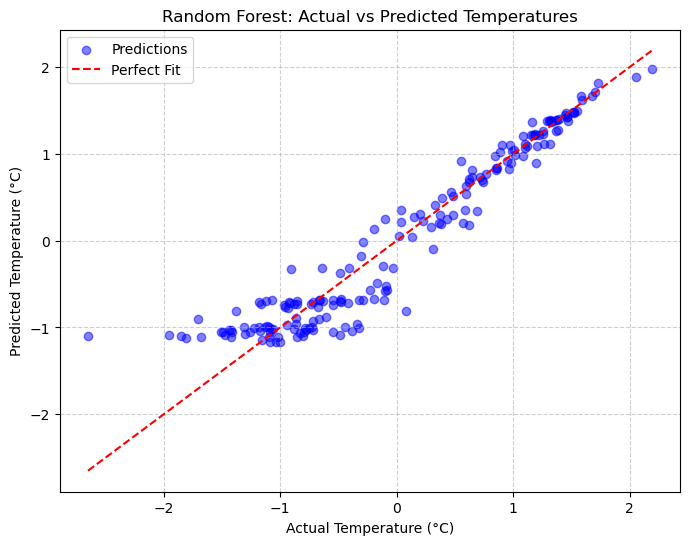

In [192]:
# Plot actual vs predicted values
plt.figure(figsize=(8,6))
plt.scatter(y_test_temp, y_pred_best_rf, alpha=0.5, color="blue", label="Predictions")
plt.plot([min(y_test_temp), max(y_test_temp)], [min(y_test_temp), max(y_test_temp)], 'r--', label="Perfect Fit")  # 45-degree line
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("Random Forest: Actual vs Predicted Temperatures")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


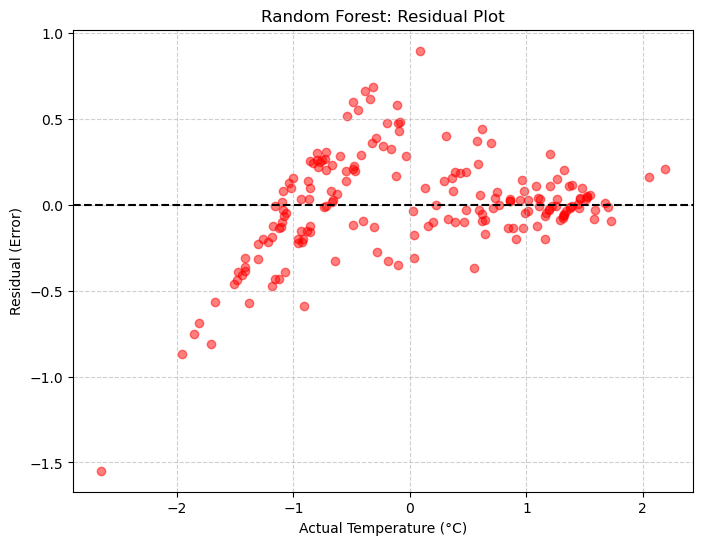

In [193]:
 # Compute residuals
errors_rf = y_test_temp - y_pred_best_rf 

#plot residuals
plt.figure(figsize=(8,6))
plt.scatter(y_test_temp, errors_rf, alpha=0.5, color="red")
plt.axhline(y=0, color="black", linestyle="dashed")
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Residual (Error)")
plt.title("Random Forest: Residual Plot")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [194]:
# Predict on training data
y_train_pred_rf = best_rf_model.predict(X_train)
train_rmse_rf = mean_squared_error(y_train_temp, y_train_pred_rf, squared=False)

# Predict on test data
y_test_pred_rf = best_rf_model.predict(X_test)
test_rmse_rf = mean_squared_error(y_test_temp, y_test_pred_rf, squared=False)

# Print RMSE values
print(f"Train RMSE (RF): {train_rmse_rf:.5f}")
print(f"Test RMSE (RF): {test_rmse_rf:.5f}")

# Check for overfitting
if train_rmse_rf < test_rmse_rf * 0.8:
    print(" Possible Overfitting: Train RMSE is significantly lower than Test RMSE.")
elif test_rmse_rf < train_rmse_rf * 0.8:
    print(" Possible Underfitting: Test RMSE is significantly lower than Train RMSE.")
else:
    print(" No significant overfitting or underfitting detected.")


Train RMSE (RF): 0.24112
Test RMSE (RF): 0.29631
 No significant overfitting or underfitting detected.


In [195]:
#define parameter grid
param_grid = {
    'learning_rate': [0.03,0.05, 0.1],  
    'n_estimators': [100, 200],    
    'max_depth': [3, 5],          
    'min_child_weight': [3, 5],    
    'subsample': [0.8, 1.0],       
    'colsample_bytree': [0.8,1],     
    'reg_lambda': [1, 3, 5, 10], 
    'colsample_bytree': [0.6],
    'reg_alpha': [0, 1, 3, 5]
}


In [196]:
# Initialize the XGBoost regressor
xgb = XGBRegressor(random_state=42, objective='reg:squarederror')

In [197]:
# Assign GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Optimize for RMSE
    cv=3,  # 3-fold cross-validation
    verbose=2,  # Print progress
    n_jobs=-1  # Use all available cores
)

In [198]:
# Perform the grid search
grid_search.fit(X_train, y_train_temp)

Fitting 3 folds for each of 768 candidates, totalling 2304 fits


GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.6],
                         'learning_rate': [0.03, 0.05, 0.1],
                         'max_depth': [3, 5], 'min_child_weight': [3, 5],
                         'n_estimators': [100, 200], 'reg_alpha': [0, 1, 3, 5],
                         'reg_lambda': [1, 3, 5, 10], 'subsample': [0.8, 1.0]},
             scoring='neg_mean_squared_error', verbose=2)

In [199]:
# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best RMSE (Negative):", grid_search.best_score_)

# Retrieve the best model
best_xgb_model = grid_search.best_estimator_

Best Parameters: {'colsample_bytree': 0.6, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 1.0}
Best RMSE (Negative): -0.08292817350124332


In [200]:
# Evaluate on the test set
y_pred_best_xgb = best_xgb_model.predict(X_test)

In [201]:
# Calculate metrics
rmse_xgb = np.sqrt(mean_squared_error(y_test_temp, y_pred_best_xgb))
mae_xgb = mean_absolute_error(y_test_temp, y_pred_best_xgb)
r2_xgb = r2_score(y_test_temp, y_pred_best_xgb)

# Print the metrics
print(f"Tuned XGBoost Model - RMSE: {rmse_xgb:.2f}, MAE: {mae_xgb:.2f}, R²: {r2_xgb:.2f}")

Tuned XGBoost Model - RMSE: 0.29, MAE: 0.20, R²: 0.92


In [202]:
# Predict on training set
y_train_pred_xgb = best_xgb_model.predict(X_train)

In [203]:
# Compute Train Metrics
rmse_train_xgb = np.sqrt(mean_squared_error(y_train_temp, y_train_pred_xgb))
mae_train_xgb = mean_absolute_error(y_train_temp, y_train_pred_xgb)
r2_train_xgb = r2_score(y_train_temp, y_train_pred_xgb)

In [204]:
# Print the results
print(f"XGBoost Train Metrics - RMSE: {rmse_train_xgb:.2f}, MAE: {mae_train_xgb:.2f}, R²: {r2_train_xgb:.2f}")

XGBoost Train Metrics - RMSE: 0.25, MAE: 0.18, R²: 0.94


In [205]:
# Extract mean and standard deviation 
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale
rmse_train_xgb_original = rmse_train_xgb * temp_std  # Inverse transform RMSE
mae_train_xgb_original = mae_train_xgb * temp_std

In [206]:
# Print corrected values for both Train & Test Sets
print(f"Tuned XGBoost Model - Train RMSE (°C): {rmse_train_xgb_original:.3f}")
print(f"Tuned XGBoost Model - Train MAE (°C): {mae_train_xgb_original:.3f}")
print(f"Tuned XGBoost Model - Train R²: {r2_train_xgb:.2f} (No Scaling Needed)")

Tuned XGBoost Model - Train RMSE (°C): 0.920
Tuned XGBoost Model - Train MAE (°C): 0.639
Tuned XGBoost Model - Train R²: 0.94 (No Scaling Needed)


In [207]:
# Extract mean and standard deviation 
temp_std = scaler.scale_[features_to_scale.index('temp')]

# Convert RMSE and MAE back to original temperature scale
rmse_xgb_original = 0.29 * temp_std 
mae_xgb_original = 0.20 * temp_std  

# Print corrected values
print(f"Tuned XGBoost Model - RMSE (°C): {rmse_xgb_original:.3f}")
print(f"Tuned XGBoost Model - MAE (°C): {mae_xgb_original:.3f}")
print(f"Tuned XGBoost Model - R²: 0.92 (No Scaling Needed)")

Tuned XGBoost Model - RMSE (°C): 1.052
Tuned XGBoost Model - MAE (°C): 0.725
Tuned XGBoost Model - R²: 0.92 (No Scaling Needed)


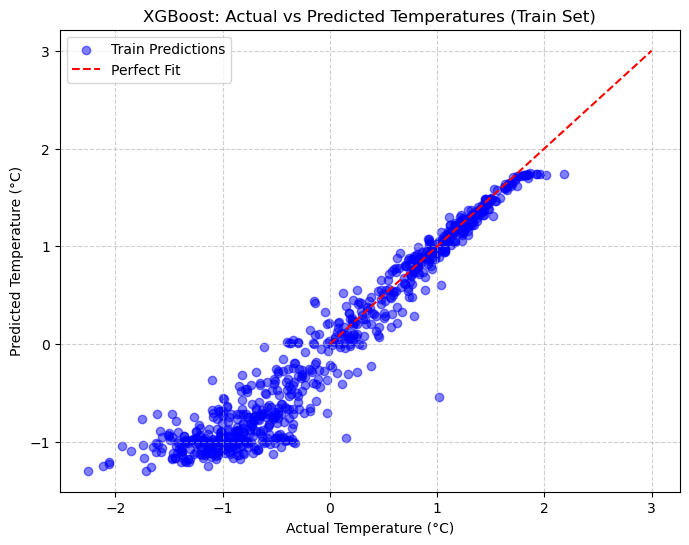

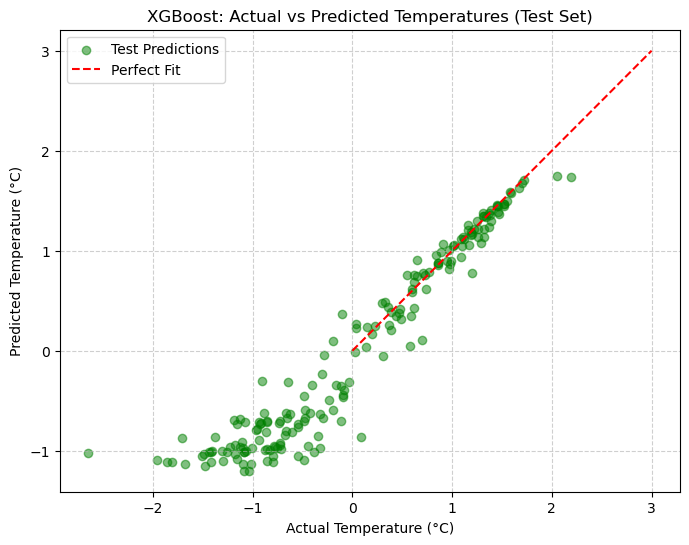

In [208]:
import matplotlib.pyplot as plt

# Scatter plot for Training Set
plt.figure(figsize=(8,6))
plt.scatter(y_train_temp, y_train_pred_xgb, alpha=0.5, color="blue", label="Train Predictions")
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--', label="Perfect Fit")  # 45-degree line
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("XGBoost: Actual vs Predicted Temperatures (Train Set)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Scatter plot for Test Set
plt.figure(figsize=(8,6))
plt.scatter(y_test_temp, y_pred_best_xgb, alpha=0.5, color="green", label="Test Predictions")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label="Perfect Fit")  # 45-degree line
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Predicted Temperature (°C)")
plt.title("XGBoost: Actual vs Predicted Temperatures (Test Set)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


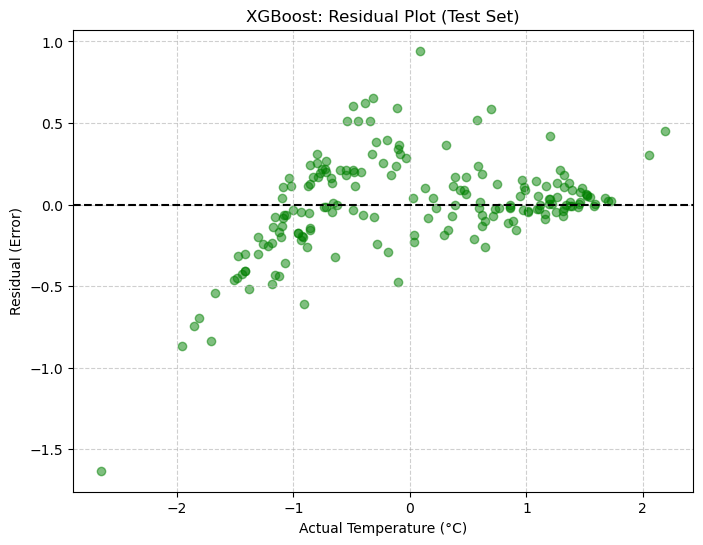

In [209]:
# Compute residuals
errors_xgb = y_test_temp - y_pred_best_xgb 


# Residual plot for Test Set
plt.figure(figsize=(8,6))
plt.scatter(y_test_temp, errors_xgb, alpha=0.5, color="green")
plt.axhline(y=0, color="black", linestyle="dashed")
plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Residual (Error)")
plt.title("XGBoost: Residual Plot (Test Set)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


In [210]:
residuals_rf = y_test_aligned - y_pred_best_rf
residuals_xgb = y_test_aligned - y_pred_best_xgb

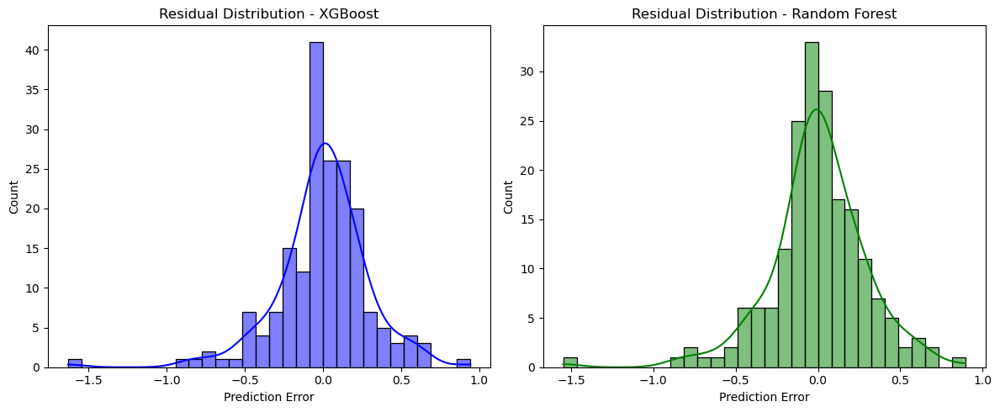

In [211]:
plt.figure(figsize=(12,5))
#plot residuals to check for normal distribution
plt.subplot(1,2,1)
sns.histplot(residuals_xgb, kde=True, bins=30, color='blue')
plt.title("Residual Distribution - XGBoost")
plt.xlabel("Prediction Error")

plt.subplot(1,2,2)
sns.histplot(residuals_rf, kde=True, bins=30, color='green')
plt.title("Residual Distribution - Random Forest")
plt.xlabel("Prediction Error")

plt.tight_layout()
plt.show()

# SHAP Analysis

In [212]:
# Create SHAP Explainers for each model
explainer_xgb = shap.Explainer(best_xgb_model, X_train)
explainer_rf = shap.Explainer(best_rf_model, X_train)
explainer_XGB1 = shap.Explainer(xgb_temp3, X_train)

In [213]:
# Compute SHAP values for test data
shap_values_xgb = explainer_xgb(X_test)
shap_values_rf = explainer_rf(X_test)
shap_original_xgb = explainer_XGB1(X_test)

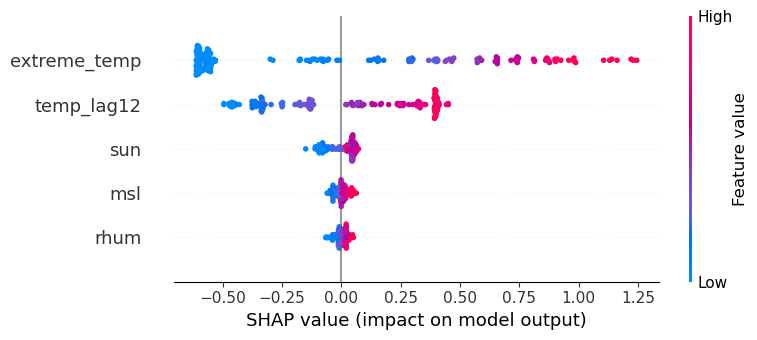

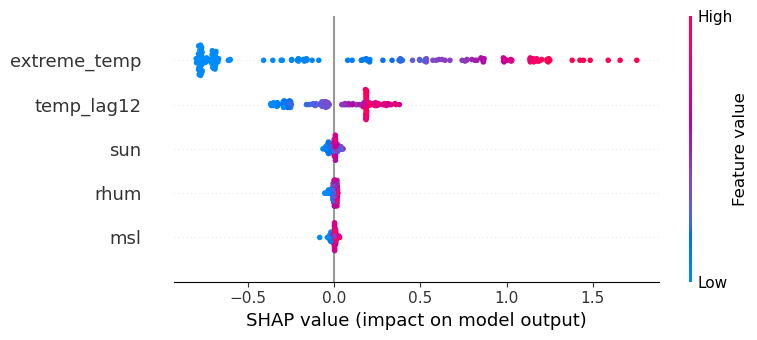

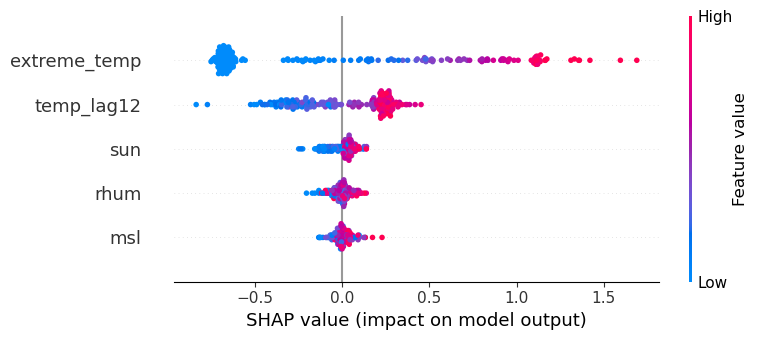

In [214]:
# XGBoost SHAP Summary
shap.summary_plot(shap_values_xgb, X_test)

# Random Forest SHAP Summary
shap.summary_plot(shap_values_rf, X_test)

# Random Forest SHAP Summary
shap.summary_plot(shap_original_xgb, X_test)


In [215]:
#check feature importance after tuning
feature_importance = pd.DataFrame({'Feature': X_test.columns, 'Importance': best_xgb_model.feature_importances_})
print(feature_importance.sort_values(by="Importance", ascending=False))

        Feature  Importance
3  extreme_temp    0.632457
4    temp_lag12    0.266883
0           sun    0.083872
1           msl    0.009828
2          rhum    0.006959


In [216]:
#compare to feature importance pre tuning
feature_importance = pd.DataFrame({'Feature': X_test.columns, 'Importance': xgb_temp3.feature_importances_})
print(feature_importance.sort_values(by="Importance", ascending=False))

        Feature  Importance
3  extreme_temp    0.956459
4    temp_lag12    0.025242
2          rhum    0.006277
0           sun    0.006139
1           msl    0.005883


In [217]:
#should try increase reg_lambda (L2 regularization) in XGBoost

In [218]:
# Extract feature importance from Random Forest
feature_importance_rf = pd.DataFrame({'Feature': X_test.columns, 'Importance': best_rf_model.feature_importances_})

# Sort by importance
print(feature_importance_rf.sort_values(by="Importance", ascending=False))

        Feature  Importance
3  extreme_temp    0.935421
4    temp_lag12    0.048622
0           sun    0.009321
2          rhum    0.003474
1           msl    0.003162


In [219]:
#Random Forest is Overfitting to extreme_temp

# Time Series Models

In [220]:
#inspect dataset
ts_monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972 entries, 0 to 971
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year            972 non-null    int32         
 1   month           972 non-null    int32         
 2   rain            972 non-null    float64       
 3   temp            972 non-null    float64       
 4   sun             972 non-null    float64       
 5   wetb            972 non-null    float64       
 6   dewpt           972 non-null    float64       
 7   msl             972 non-null    float64       
 8   rhum            972 non-null    float64       
 9   clht            972 non-null    float64       
 10  extreme_temp    972 non-null    float64       
 11  extreme_rain    972 non-null    float64       
 12  season_encoded  972 non-null    int32         
 13  season          972 non-null    object        
 14  date            972 non-null    datetime64[ns]
dtypes: dat

In [221]:
# Set 'date' as index
ts_monthly_data.set_index('date', inplace=True)

In [222]:
#assign monthly timing
ts_monthly_data = ts_monthly_data.asfreq('MS')

In [223]:
# Display
print(ts_monthly_data.info())
print(ts_monthly_data.head())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 972 entries, 1944-01-01 to 2024-12-01
Freq: MS
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   year            972 non-null    int32  
 1   month           972 non-null    int32  
 2   rain            972 non-null    float64
 3   temp            972 non-null    float64
 4   sun             972 non-null    float64
 5   wetb            972 non-null    float64
 6   dewpt           972 non-null    float64
 7   msl             972 non-null    float64
 8   rhum            972 non-null    float64
 9   clht            972 non-null    float64
 10  extreme_temp    972 non-null    float64
 11  extreme_rain    972 non-null    float64
 12  season_encoded  972 non-null    int32  
 13  season          972 non-null    object 
dtypes: float64(10), int32(3), object(1)
memory usage: 102.5+ KB
None
            year  month  rain       temp    sun      wetb     dewpt  \
date  

In [224]:
# Create function to check stationarity
def check_stationarity(series, column_name):
    result = adfuller(series.dropna())  
    print(f'ADF Statistic for {column_name}: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] < 0.05:
        print(f"{column_name} is Stationary: Reject null hypothesis")
    else:
        print(f"{column_name} is Not Stationary: Differencing needed")

# Run stationarity check on temperature
check_stationarity(ts_monthly_data['temp'], 'Temperature')

ADF Statistic for Temperature: -4.527279289073339
p-value: 0.00017548671177354836
Temperature is Stationary: Reject null hypothesis


In [225]:
# Check the minimum and maximum temperature to ensure no errors during aggregation
min_temp = ts_monthly_data['temp'].min()
max_temp = ts_monthly_data['temp'].max()

print(f"Minimum Temperature: {min_temp}")
print(f"Maximum Temperature: {max_temp}")

Minimum Temperature: 0.4924315619967794
Maximum Temperature: 18.04009433962264


# Create train-test split

In [226]:
# Create chronilogical train-test split
train_size = int(len(ts_monthly_data) * 0.8)
train_data = ts_monthly_data[:train_size]  # First 80%
test_data = ts_monthly_data[train_size:]   # Last 20%

# Model 1: Holt-Winters Model

In [227]:
# Fit Holt-Winters model 
hw_model_temp = ExponentialSmoothing(
    train_data['temp'],   # Target variable
    trend='add',          # Additive trend
    seasonal='mul',       # Additive seasonality
    seasonal_periods=12,
    damped_trend=True    
).fit()

In [228]:
#inspect parameters
print(hw_model_temp.params)

{'smoothing_level': 7.4809301433024666e-06, 'smoothing_trend': 1.2334976045098451e-06, 'smoothing_seasonal': 6.064648225758857e-08, 'damping_trend': 0.994997190877173, 'initial_level': 7.613488877167357, 'initial_trend': 0.002589072077282484, 'initial_seasons': array([0.73088066, 0.70788642, 0.85915191, 1.05929181, 1.35973987,
       1.69643385, 1.89912804, 1.89080144, 1.68334534, 1.36127664,
       0.99937603, 0.8228276 ]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [229]:
# Forecast on the test set
hw_forecast = hw_model_temp.forecast(len(test_data))

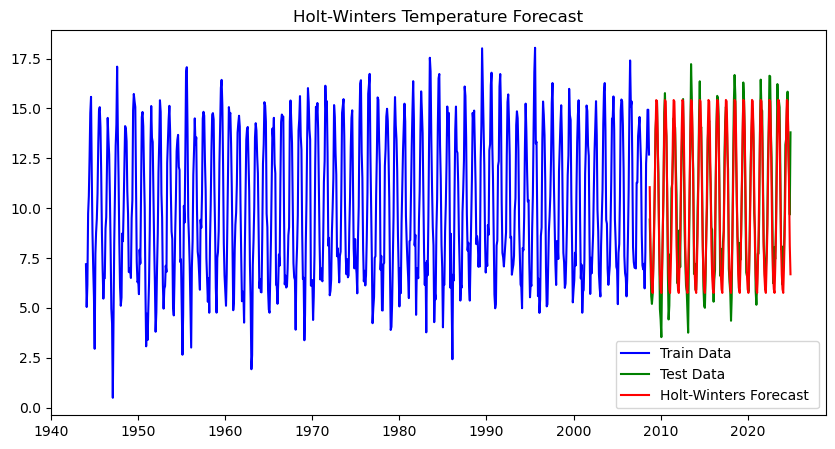

In [230]:
# Plot results
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(train_data.index, train_data['temp'], label="Train Data", color='blue')
plt.plot(test_data.index, test_data['temp'], label="Test Data", color='green')
plt.plot(test_data.index, hw_forecast, label="Holt-Winters Forecast ", color='red')
plt.legend()
plt.title("Holt-Winters Temperature Forecast")
plt.show()

In [231]:
# Compute RMSE
hw_rmse = mean_squared_error(test_data['temp'], hw_forecast, squared=False)

# Compute MAE
hw_mae = mean_absolute_error(test_data['temp'], hw_forecast)

# Compute R² Score
hw_r2 = r2_score(test_data['temp'], hw_forecast)

# Print results
print(f"Holt-Winters Model - RMSE: {hw_rmse:.4f}, MAE: {hw_mae:.4f}, R²: {hw_r2:.4f}")


Holt-Winters Model - RMSE: 1.1670, MAE: 0.8866, R²: 0.8945


In [232]:
# Create a parameter grid
param_grid = {
    "alpha_values": [0.001, 0.01, 0.05, 0.1, 0.2],  
    "beta_values": [0.0001, 0.001, 0.005, 0.01, 0.05],  
    "gamma_values": [0.0001, 0.001, 0.005, 0.01, 0.05],  
    "damping_values": [0.8, 0.9, 1.0]  # Adding damping trend tuning
}

best_rmse = float("inf")
best_params = None
best_metrics = None  # To store RMSE, MAE, and R² for the best model

#try different parameters
try:
    for params in itertools.product(param_grid["alpha_values"], 
                                    param_grid["beta_values"], 
                                    param_grid["gamma_values"], 
                                    param_grid["damping_values"]):
        try:
            # Fit the model with the current parameters
            model = ExponentialSmoothing(
                train_data['temp'],
                trend='add',
                seasonal='mul',
                seasonal_periods=12,
                damped_trend=True
            ).fit(smoothing_level=params[0],     # Alpha (level)
                  smoothing_trend=params[1],     # Beta (trend)
                  smoothing_seasonal=params[2],  # Gamma (seasonality)
                  damping_trend=params[3])
            
            # Forecast for the test period
            forecast = model.forecast(steps=len(test_data))

            # Calculate the error metrics
            rmse = np.sqrt(mean_squared_error(test_data['temp'], forecast))
            mae = mean_absolute_error(test_data['temp'], forecast)
            r2 = r2_score(test_data['temp'], forecast)

            # Check if this is the best model (using RMSE as the selection criterion)
            if rmse < best_rmse:
                best_rmse = rmse
                best_params = params
                best_metrics = (rmse, mae, r2)

        except Exception as e:
            print(f"Skipping parameter set {params} due to error: {e}")

    print(f"Best Parameters: α={best_params[0]}, β={best_params[1]}, γ={best_params[2]}, φ={best_params[3]}")
    print(f"Best RMSE: {best_metrics[0]:.4f} °C")
    print(f"Best MAE: {best_metrics[1]:.4f} °C")
    print(f"Best R²: {best_metrics[2]:.4f}")

except NameError as e:
    print(f"Error: {e}. Ensure train_data and test_data are defined before running this script.")

    

C:\Users\a-ldrumm\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Best Parameters: α=0.2, β=0.0001, γ=0.01, φ=1.0
Best RMSE: 1.1363 °C
Best MAE: 0.8668 °C
Best R²: 0.8999


In [233]:
print(model.params)

{'smoothing_level': 0.2, 'smoothing_trend': 0.05, 'smoothing_seasonal': 0.05, 'damping_trend': 1.0, 'initial_level': 8.143877242369227, 'initial_trend': -0.04176168340471935, 'initial_seasons': array([0.69128535, 0.68865154, 0.81993667, 1.00248588, 1.272069  ,
       1.61221253, 1.79985977, 1.81314136, 1.62382414, 1.32342374,
       0.97175636, 0.78842902]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


# SARIMA Model

In [234]:
ts_monthly_data = ts_monthly_data.asfreq('MS')

In [235]:
# Create a separate DataFrame with just the temperature column
test_temp = test_data[['temp']].copy()
train_temp = train_data[['temp']].copy()

# Create Benchmark Model Before Tuning

In [236]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima_model = SARIMAX(
    ts_monthly_data['temp'],
    order=(2, 1, 2),  # Non-seasonal
    seasonal_order=(1, 1, 1, 12),  # Seasonal
    enforce_stationarity=False,
    enforce_invertibility=False
).fit()

print(sarima_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                 temp   No. Observations:                  972
Model:             SARIMAX(2, 1, 2)x(1, 1, [1], 12)   Log Likelihood               -1414.942
Date:                              Sun, 23 Feb 2025   AIC                           2843.884
Time:                                      14:40:20   BIC                           2877.835
Sample:                                  01-01-1944   HQIC                          2856.824
                                       - 12-01-2024                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6881      0.068    -10.067      0.000      -0.822      -0.554
ar.L2          0.20

In [237]:
test_data.head()

,year,month,rain,temp,sun,wetb,dewpt,msl,rhum,clht,extreme_temp,extreme_rain,season_encoded,season
date,,,,,,,,,,,,,,
2008-10-01,2008,10,101.1,9.428975,118.8,8.205646,6.790342,1011.355869,84.163447,66.303120,0.002972,0.130758,0,Autumn
2008-11-01,2008,11,44.5,7.714798,80.7,6.995171,6.089252,1014.295171,89.774143,44.003115,0.000000,0.091900,0,Autumn
2008-12-01,2008,12,37.9,5.592487,47.4,4.865776,3.849416,1017.118197,88.823038,47.146912,0.000000,0.086811,3,Winter
2009-01-01,2009,1,61.8,5.199204,69.7,4.285032,2.884873,1003.160828,85.555732,57.294586,0.000000,0.128981,3,Winter
2009-02-01,2009,2,52.9,5.681664,59.1,4.779626,3.524109,1018.157046,86.563667,49.787776,0.000000,0.071307,3,Winter


In [238]:
# Forecast on the Test Set
forecast = sarima_model.forecast(steps=len(test_temp))

# Calculate error metrics
rmse = np.sqrt(mean_squared_error(test_temp, forecast))
mae = mean_absolute_error(test_temp, forecast)
r2 = r2_score(test_temp, forecast)  # R² calculation

# Print Error Metrics
print(f"SARIMA RMSE: {rmse:.3f}°C")
print(f"SARIMA MAE: {mae:.3f}°C")
print(f"SARIMA R²: {r2:.3f}")

SARIMA RMSE: 4.985°C
SARIMA MAE: 4.370°C
SARIMA R²: -0.925


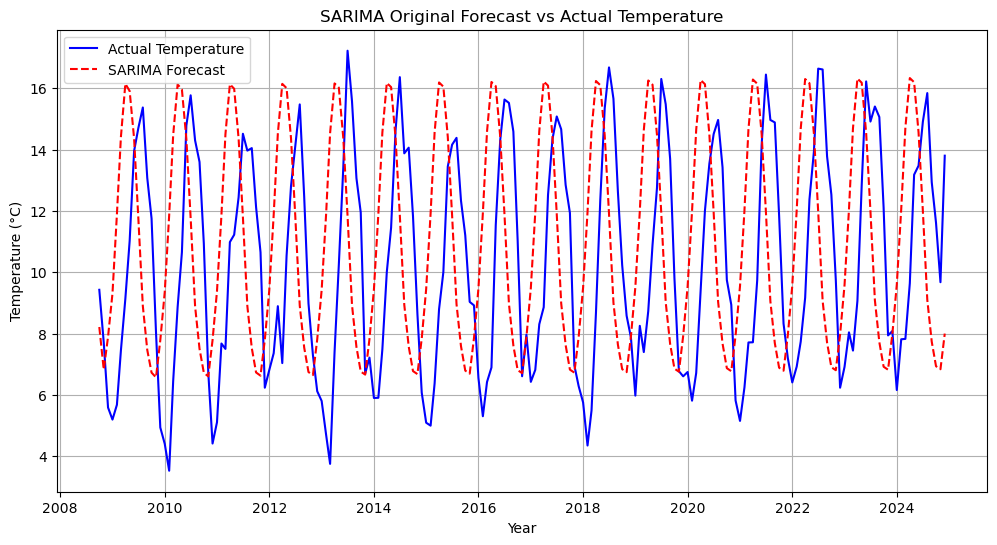

In [239]:
# Plot SARIMA Forecast vs Actual Temperature
plt.figure(figsize=(12, 6))
plt.plot(test_temp.index, test_temp, label='Actual Temperature', color='blue')
plt.plot(test_temp.index, forecast, label='SARIMA Forecast', color='red', linestyle="dashed")
plt.xlabel("Year")
plt.ylabel("Temperature (°C)")
plt.title("SARIMA Original Forecast vs Actual Temperature")
plt.legend()
plt.grid()
plt.show()

# Improve Sarima Results

In [240]:
#use aut arima to tune model
model_auto = auto_arima(
    train_data["temp"],
    seasonal=True,
    m=12,
    start_p=0, max_p=7,  
    start_q=0, max_q=7,  
    start_P=0, max_P=4,  
    start_Q=0, max_Q=4,
    d=0, D=0,  
    trace=True,
    suppress_warnings=True,
    stepwise=False,
    n_jobs=-1
)
print(model_auto.summary())


Best model:  ARIMA(0,0,2)(1,0,1)[12] intercept
Total fit time: 120.388 seconds
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  777
Model:             SARIMAX(0, 0, 2)x(1, 0, [1], 12)   Log Likelihood               -1193.947
Date:                              Sun, 23 Feb 2025   AIC                           2399.894
Time:                                      14:42:20   BIC                           2427.826
Sample:                                  01-01-1944   HQIC                          2410.639
                                       - 09-01-2008                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0

In [241]:
# Print the best parameters
best_order = model_auto.order          # (p, d, q)
best_seasonal_order = model_auto.seasonal_order  # (P, D, Q, m)
print(f"Best Order: {best_order}, Best Seasonal Order: {best_seasonal_order}")

Best Order: (0, 0, 2), Best Seasonal Order: (1, 0, 1, 12)


In [242]:
#  Fit SARIMA(0,0,2)(1,0,1)[12] Model
sarima_model = SARIMAX(train_temp, order=(0, 0, 2), seasonal_order=(1, 0, 1, 12))
sarima_result = sarima_model.fit()

# Display model summary
print(sarima_result.summary())

C:\Users\a-ldrumm\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\a-ldrumm\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.



                                      SARIMAX Results                                       
Dep. Variable:                                 temp   No. Observations:                  777
Model:             SARIMAX(0, 0, 2)x(1, 0, [1], 12)   Log Likelihood               -1200.301
Date:                              Sun, 23 Feb 2025   AIC                           2410.603
Time:                                      14:42:23   BIC                           2433.880
Sample:                                  01-01-1944   HQIC                          2419.557
                                       - 09-01-2008                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2262      0.030      7.627      0.000       0.168       0.284
ma.L2          0.10

In [243]:
# Forecast on the Test Set
forecast = sarima_result.forecast(steps=len(test_temp))

# Calculate error metrics
SArmse = np.sqrt(mean_squared_error(test_temp, forecast))
SAmae = mean_absolute_error(test_temp, forecast)
SAr2 = r2_score(test_temp, forecast)

# Print Error Metrics
print(f"SARIMA RMSE: {SArmse:.3f}°C")
print(f"SARIMA MAE: {SAmae:.3f}°C")
print(f"R² Score: {SAr2:.3f}")

SARIMA RMSE: 1.166°C
SARIMA MAE: 0.892°C
R² Score: 0.895


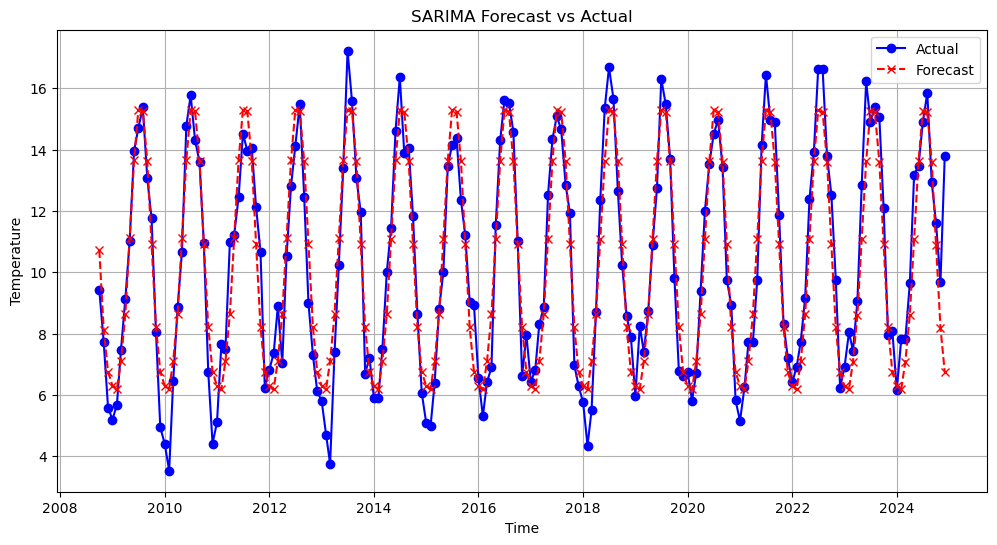

In [244]:
# Plot Actual vs Forecasted Values to check performance
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(test_temp.index, test_temp, label="Actual", color="blue", marker='o')
plt.plot(test_temp.index, forecast, label="Forecast", color="red", linestyle='dashed', marker='x')
plt.title("SARIMA Forecast vs Actual")
plt.xlabel("Time")
plt.ylabel("Temperature")
plt.legend()
plt.grid(True)
plt.show()

In [245]:
# Get the in-sample predictions
train_pred = sarima_result.fittedvalues

# ensure alignment
train_pred = train_pred.reindex_like(train_temp)

# Compute in-sample error metrics
train_rmse = np.sqrt(mean_squared_error(train_temp, train_pred))
train_mae = mean_absolute_error(train_temp, train_pred)

print(f"In-Sample (Train) RMSE: {train_rmse:.3f}")
print(f"In-Sample (Train) MAE: {train_mae:.3f}")

In-Sample (Train) RMSE: 1.460
In-Sample (Train) MAE: 0.958


In [246]:
# Forecast for the length of the test set
test_pred = sarima_result.forecast(steps=len(test_temp))

# Compute out-of-sample error metrics
test_rmse = np.sqrt(mean_squared_error(test_temp, test_pred))
test_mae = mean_absolute_error(test_temp, test_pred)

print(f"Out-of-Sample (Test) RMSE: {test_rmse:.3f}")
print(f"Out-of-Sample (Test) MAE: {test_mae:.3f}")

Out-of-Sample (Test) RMSE: 1.166
Out-of-Sample (Test) MAE: 0.892


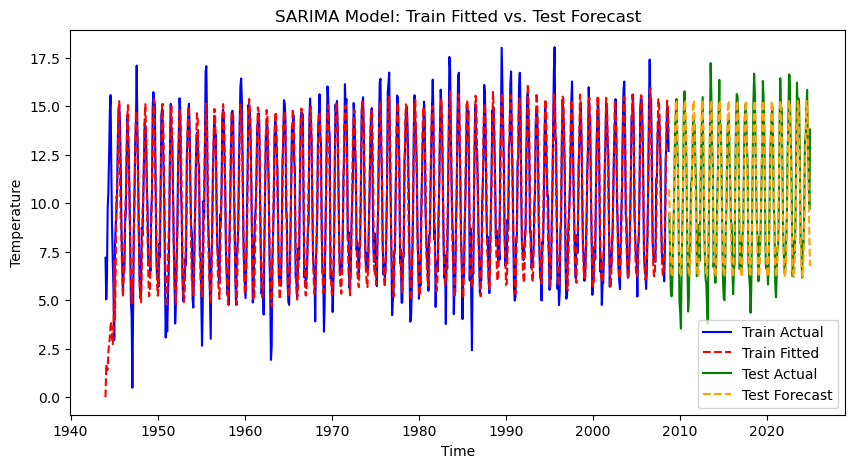

In [247]:
plt.figure(figsize=(10, 5))

# Plot training data
plt.plot(train_temp.index, train_temp, label='Train Actual', color='blue')
plt.plot(train_temp.index, train_pred, label='Train Fitted', color='red', linestyle='--')

# Plot test data and forecast
plt.plot(test_temp.index, test_temp, label='Test Actual', color='green')
plt.plot(test_temp.index, test_pred, label='Test Forecast', color='orange', linestyle='--')

plt.legend()
plt.title('SARIMA Model: Train Fitted vs. Test Forecast')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.show()

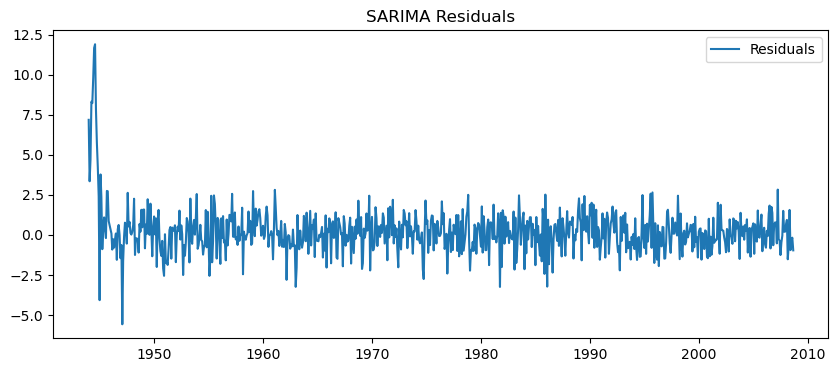

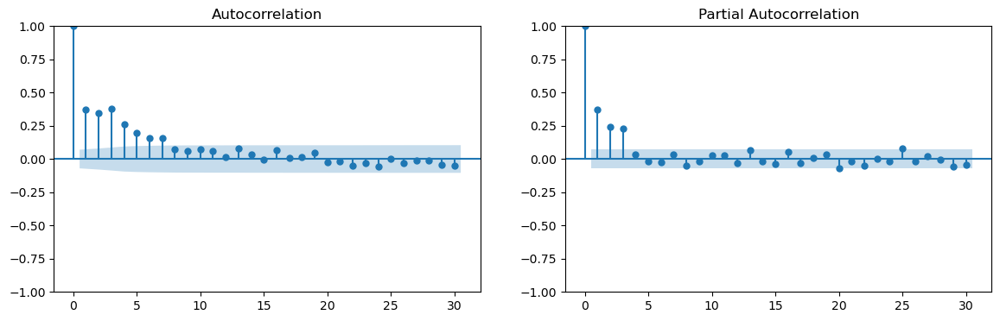

In [248]:
#extract residuals
residuals = sarima_result.resid

# Plot residuals over time
plt.figure(figsize=(10, 4))
plt.plot(residuals, label='Residuals')
plt.title('SARIMA Residuals')
plt.legend()
plt.show()

# Plot ACF and PACF of residuals
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
sm.graphics.tsa.plot_acf(residuals, lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(residuals, lags=30, ax=ax[1])
plt.show()

In [249]:
#look at residual stats
print("Residuals Summary Statistics:")
print(sarima_result.resid.describe())

Residuals Summary Statistics:
count    777.000000
mean       0.200924
std        1.447434
min       -5.578837
25%       -0.551607
50%        0.130350
75%        0.847078
max       11.906675
dtype: float64


# Improve ACF and PACF

In [250]:
# Improved SARIMA model
sarima_model = SARIMAX(
    train_temp, 
    order=(0, 1, 2),  # Adding AR(1) to try improve ACF and PACF plots
    seasonal_order=(1, 0, 1, 12)  # Keeping seasonal terms, no seasonal differencing yet
)

sarima_result = sarima_model.fit()
print(sarima_result.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                 temp   No. Observations:                  777
Model:             SARIMAX(0, 1, 2)x(1, 0, [1], 12)   Log Likelihood               -1190.467
Date:                              Sun, 23 Feb 2025   AIC                           2390.934
Time:                                      14:42:30   BIC                           2414.205
Sample:                                  01-01-1944   HQIC                          2399.887
                                       - 09-01-2008                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7758      0.042    -18.566      0.000      -0.858      -0.694
ma.L2         -0.22

C:\Users\a-ldrumm\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [251]:
# Forecast on the Test Set
forecast = sarima_result.forecast(steps=len(test_temp))

# Calculate error metrics
rmse = np.sqrt(mean_squared_error(test_temp, forecast))
mae = mean_absolute_error(test_temp, forecast)
SAr2 = r2_score(test_temp, forecast)

# Print Error Metrics
print(f"SARIMA RMSE: {rmse:.3f}°C")
print(f"SARIMA MAE: {mae:.3f}°C")
print(f"R² Score: {SAr2:.3f}")

SARIMA RMSE: 1.160°C
SARIMA MAE: 0.883°C
R² Score: 0.896


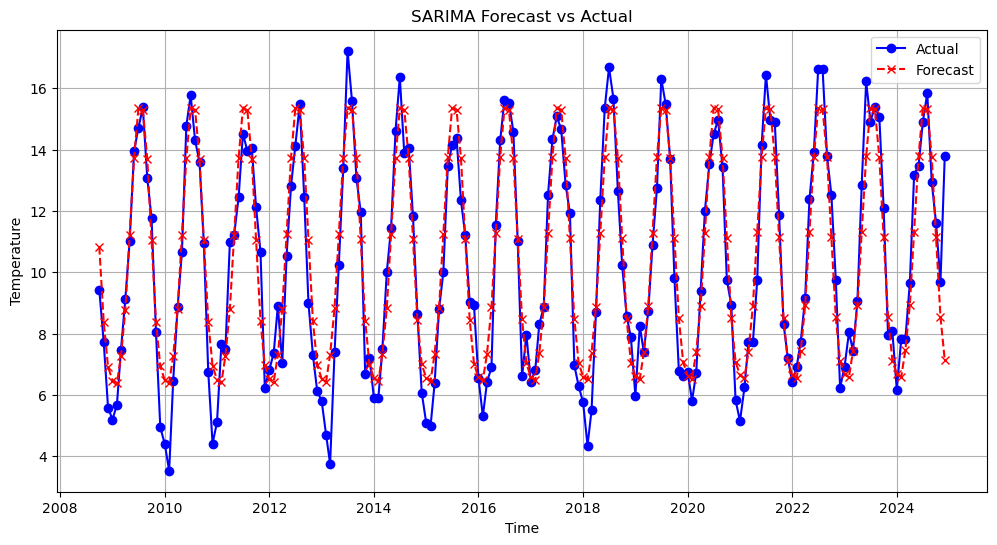

In [252]:
# Plot Actual vs Forecasted Values
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(test_temp.index, test_temp, label="Actual", color="blue", marker='o')
plt.plot(test_temp.index, forecast, label="Forecast", color="red", linestyle='dashed', marker='x')
plt.title("SARIMA Forecast vs Actual")
plt.xlabel("Time")
plt.ylabel("Temperature")
plt.legend()
plt.grid(True)
plt.show()

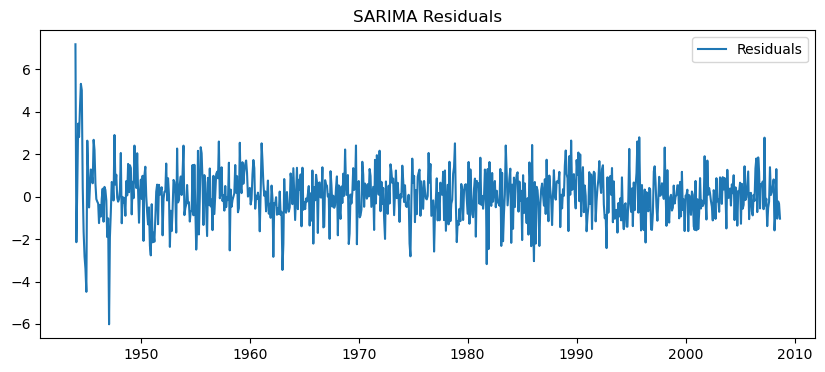

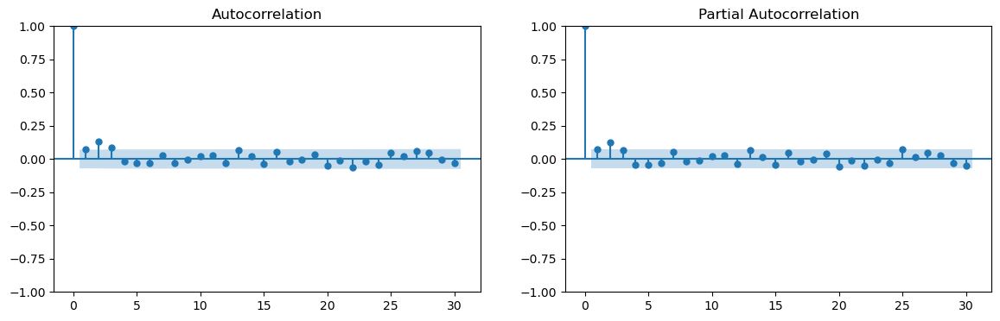

In [253]:
residuals = sarima_result.resid

# Plot residuals over time
plt.figure(figsize=(10, 4))
plt.plot(residuals, label='Residuals')
plt.title('SARIMA Residuals')
plt.legend()
plt.show()

# Plot ACF and PACF of residuals
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
sm.graphics.tsa.plot_acf(residuals, lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(residuals, lags=30, ax=ax[1])
plt.show()

# Add Exogenous Variables - SARIMAX

In [254]:
# Select exogenous variables
exog_vars = ts_monthly_data[['extreme_temp',  'sun']]  # Best candidates for ML
train_exog = exog_vars.iloc[:train_size]
test_exog = exog_vars.iloc[train_size:]

In [255]:
#assign chronilogical train and test
train_size = int(len(ts_monthly_data) * 0.8)

train_temp = ts_monthly_data["temp"].iloc[:train_size]
test_temp  = ts_monthly_data["temp"].iloc[train_size:]

train_exog = exog_vars.iloc[:train_size]
test_exog  = exog_vars.iloc[train_size:]

In [256]:
# Fit SARIMAX model
sarimax_model = SARIMAX(
    train_temp, 
    order=(0, 0, 0), 
    seasonal_order=(1, 0, 1, 12), 
    exog=train_exog
)

sarimax_result = sarimax_model.fit()
print(sarimax_result.summary())

                                 SARIMAX Results                                  
Dep. Variable:                       temp   No. Observations:                  777
Model:             SARIMAX(1, 0, [1], 12)   Log Likelihood               -1094.911
Date:                    Sun, 23 Feb 2025   AIC                           2199.823
Time:                            14:42:34   BIC                           2223.100
Sample:                        01-01-1944   HQIC                          2208.777
                             - 09-01-2008                                         
Covariance Type:                      opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
extreme_temp     8.9032      1.101      8.089      0.000       6.746      11.060
sun             -0.0006      0.002     -0.386      0.700      -0.004       0.002
ar.S.L12    

C:\Users\a-ldrumm\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [257]:
# Forecasting with exogenous variables
test_pred = sarimax_result.forecast(steps=len(test_temp), exog=test_exog)

In [258]:
# Generate predictions on the training set
train_pred = sarimax_result.fittedvalues

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(train_temp, train_pred))
test_rmse = np.sqrt(mean_squared_error(test_temp, test_pred))

# Calculate MAE
train_mae = mean_absolute_error(train_temp, train_pred)
test_mae = mean_absolute_error(test_temp, test_pred)

# Calculate R² Score
train_r2 = r2_score(train_temp, train_pred)
test_r2 = r2_score(test_temp, test_pred)


In [259]:
# Print results
print(f"SARIMAX Train RMSE: {train_rmse:.3f}°C")
print(f"SARIMAX Test RMSE: {test_rmse:.3f}°C")
print(f"SARIMAX Train MAE: {train_mae:.3f}°C")
print(f"SARIMAX Test MAE: {test_mae:.3f}°C")
print(f"SARIMAX Train R²: {train_r2:.3f}")
print(f"SARIMAX Test R²: {test_r2:.3f}")

SARIMAX Train RMSE: 1.508°C
SARIMAX Test RMSE: 1.016°C
SARIMAX Train MAE: 0.805°C
SARIMAX Test MAE: 0.682°C
SARIMAX Train R²: 0.827
SARIMAX Test R²: 0.920


# Sun Isn't Significant, let's Remove

In [260]:
# Select exogenous variables
exog_vars = ts_monthly_data[['extreme_temp']]  
train_exog = exog_vars.iloc[:train_size]
test_exog = exog_vars.iloc[train_size:]

# Fit SARIMAX model
sarimax_model = SARIMAX(
    train_temp, 
    order=(0, 0, 0), 
    seasonal_order=(1, 0, 1, 12), 
    exog=train_exog
)

sarimax_result = sarimax_model.fit()
print(sarimax_result.summary())

                                 SARIMAX Results                                  
Dep. Variable:                       temp   No. Observations:                  777
Model:             SARIMAX(1, 0, [1], 12)   Log Likelihood               -1096.084
Date:                    Sun, 23 Feb 2025   AIC                           2200.167
Time:                            14:42:36   BIC                           2218.789
Sample:                        01-01-1944   HQIC                          2207.331
                             - 09-01-2008                                         
Covariance Type:                      opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
extreme_temp     8.8188      1.146      7.696      0.000       6.573      11.065
ar.S.L12         0.9998    8.4e-05   1.19e+04      0.000       1.000       1.000
ma.S.L12    

In [261]:
test_pred = sarimax_result.forecast(steps=len(test_temp), exog=test_exog)

In [262]:
train_pred = sarimax_result.fittedvalues

In [263]:
#evaluate model
train_rmse = np.sqrt(mean_squared_error(train_temp, train_pred))
test_rmse = np.sqrt(mean_squared_error(test_temp, test_pred))

train_mae = mean_absolute_error(train_temp, train_pred)
test_mae = mean_absolute_error(test_temp, test_pred)

train_r2 = r2_score(train_temp, train_pred)
test_r2 = r2_score(test_temp, test_pred)


In [264]:
#print evaluation metrics
print(f"SARIMAX Train RMSE: {train_rmse:.3f}°C")
print(f"SARIMAX Test RMSE: {test_rmse:.3f}°C")
print(f"SARIMAX Train MAE: {train_mae:.3f}°C")
print(f"SARIMAX Test MAE: {test_mae:.3f}°C")
print(f"SARIMAX Train R²: {train_r2:.3f}")
print(f"SARIMAX Test R²: {test_r2:.3f}")

SARIMAX Train RMSE: 1.503°C
SARIMAX Test RMSE: 1.017°C
SARIMAX Train MAE: 0.806°C
SARIMAX Test MAE: 0.683°C
SARIMAX Train R²: 0.828
SARIMAX Test R²: 0.920


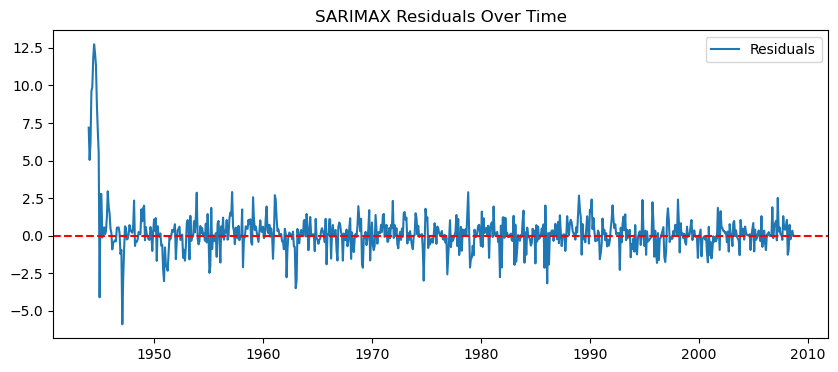

In [265]:
#inspect residuals

plt.figure(figsize=(10, 4))
plt.plot(sarimax_result.resid, label="Residuals")
plt.axhline(0, linestyle="--", color="red")
plt.title("SARIMAX Residuals Over Time")
plt.legend()
plt.show()


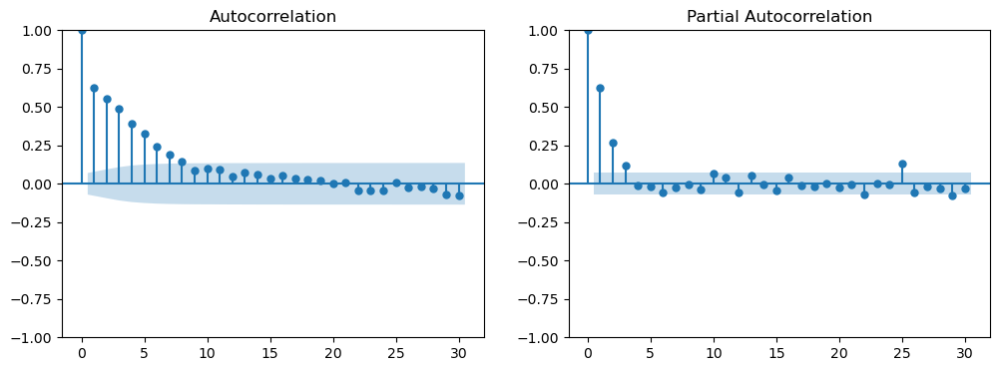

In [266]:
#check ACF and PACF
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sm.graphics.tsa.plot_acf(sarimax_result.resid, lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(sarimax_result.resid, lags=30, ax=ax[1])
plt.show()

In [267]:
sarimax_model = SARIMAX(
    train_temp, 
    order=(0, 0, 0), 
    seasonal_order=(1, 0, 1, 12), 
    exog=train_exog[['extreme_temp']]
)
sarimax_result = sarimax_model.fit()
print(sarimax_result.summary())

                                 SARIMAX Results                                  
Dep. Variable:                       temp   No. Observations:                  777
Model:             SARIMAX(1, 0, [1], 12)   Log Likelihood               -1096.084
Date:                    Sun, 23 Feb 2025   AIC                           2200.167
Time:                            14:42:41   BIC                           2218.789
Sample:                        01-01-1944   HQIC                          2207.331
                             - 09-01-2008                                         
Covariance Type:                      opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
extreme_temp     8.8188      1.146      7.696      0.000       6.573      11.065
ar.S.L12         0.9998    8.4e-05   1.19e+04      0.000       1.000       1.000
ma.S.L12    

In [268]:
# Forecasting with exogenous variables
test_pred = sarimax_result.forecast(steps=len(test_temp), exog=test_exog)

In [269]:
# Generate predictions on the training set
train_pred = sarimax_result.fittedvalues

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(train_temp, train_pred))
test_rmse = np.sqrt(mean_squared_error(test_temp, test_pred))

# Calculate MAE
train_mae = mean_absolute_error(train_temp, train_pred)
test_mae = mean_absolute_error(test_temp, test_pred)

# Calculate R² Score
train_r2 = r2_score(train_temp, train_pred)
test_r2 = r2_score(test_temp, test_pred)

In [270]:
print(f"SARIMAX Train RMSE: {train_rmse:.3f}°C")
print(f"SARIMAX Test RMSE: {test_rmse:.3f}°C")
print(f"SARIMAX Train MAE: {train_mae:.3f}°C")
print(f"SARIMAX Test MAE: {test_mae:.3f}°C")
print(f"SARIMAX Train R²: {train_r2:.3f}")
print(f"SARIMAX Test R²: {test_r2:.3f}")

SARIMAX Train RMSE: 1.503°C
SARIMAX Test RMSE: 1.017°C
SARIMAX Train MAE: 0.806°C
SARIMAX Test MAE: 0.683°C
SARIMAX Train R²: 0.828
SARIMAX Test R²: 0.920


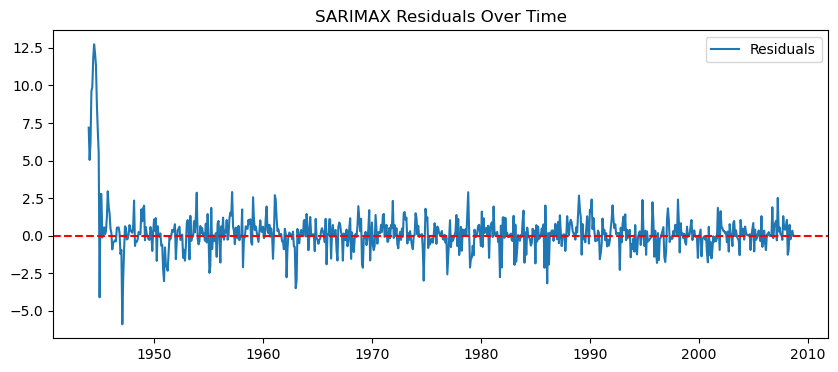

In [271]:
#inspect residuals
plt.figure(figsize=(10, 4))
plt.plot(sarimax_result.resid, label="Residuals")
plt.axhline(0, linestyle="--", color="red")
plt.title("SARIMAX Residuals Over Time")
plt.legend()
plt.show()

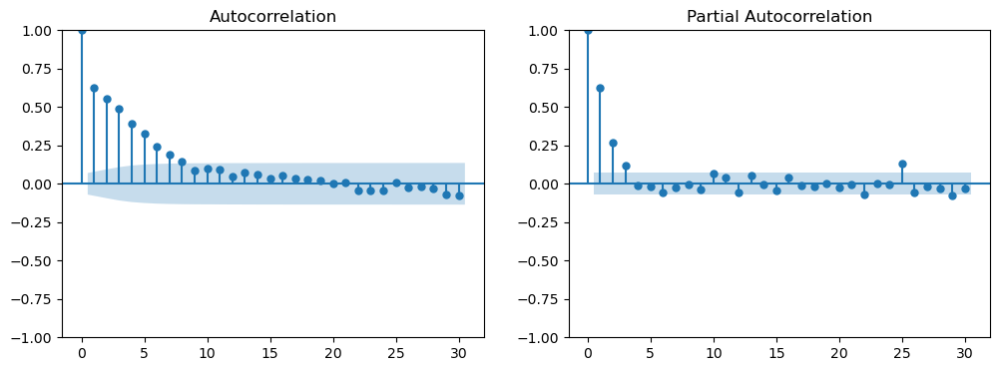

In [272]:
#check ACF and PACF
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sm.graphics.tsa.plot_acf(sarimax_result.resid, lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(sarimax_result.resid, lags=30, ax=ax[1])
plt.show()

# Improve Further

In [273]:
#rune to remove autocorrelation present
sarimax_model = SARIMAX(
    train_temp, 
    order=(2, 0, 0),  # AR(2)
    seasonal_order=(1, 0, 1, 12), 
    exog=train_exog[['extreme_temp']]
)
sarimax_result = sarimax_model.fit()
print(sarimax_result.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                 temp   No. Observations:                  777
Model:             SARIMAX(2, 0, 0)x(1, 0, [1], 12)   Log Likelihood               -1067.626
Date:                              Sun, 23 Feb 2025   AIC                           2147.253
Time:                                      14:42:48   BIC                           2175.185
Sample:                                  01-01-1944   HQIC                          2157.998
                                       - 09-01-2008                                         
Covariance Type:                                opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
extreme_temp     8.8272      0.948      9.312      0.000       6.969      10.685
ar.L1        

In [274]:
# Forecasting with exogenous variables
test_pred = sarimax_result.forecast(steps=len(test_temp), exog=test_exog)
# Generate predictions on the training set
train_pred = sarimax_result.fittedvalues

# Calculate RMSE
test_rmse = np.sqrt(mean_squared_error(train_temp, train_pred))
sx_rmse = np.sqrt(mean_squared_error(test_temp, test_pred))

# Calculate MAE
train_mae = mean_absolute_error(train_temp, train_pred)
SX_mae = mean_absolute_error(test_temp, test_pred)

# Calculate R² Score
test_r2 = r2_score(train_temp, train_pred)
sx_r2 = r2_score(test_temp, test_pred)

In [275]:
#print metrics
print(f"SARIMAX Train RMSE: {train_rmse:.3f}°C")
print(f"SARIMAX Test RMSE: {sx_rmse:.3f}°C")
print(f"SARIMAX Train MAE: {train_mae:.3f}°C")
print(f"SARIMAX Test MAE: {SX_mae:.3f}°C")
print(f"SARIMAX Train R²: {train_r2:.3f}")
print(f"SARIMAX Test R²: {sx_r2:.3f}")

SARIMAX Train RMSE: 1.503°C
SARIMAX Test RMSE: 1.015°C
SARIMAX Train MAE: 0.743°C
SARIMAX Test MAE: 0.683°C
SARIMAX Train R²: 0.828
SARIMAX Test R²: 0.920


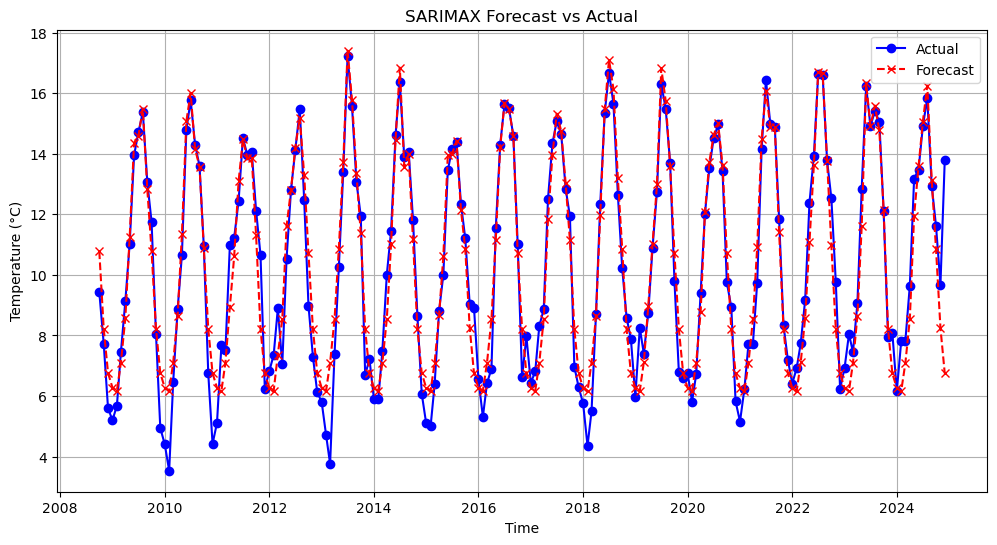

In [276]:
# Ensure the forecasted SARIMAX values align with the test set index
plt.figure(figsize=(12, 6))

# Plot actual test temperatures
plt.plot(test_temp.index, test_temp, label="Actual", color="blue", marker='o')

# Plot SARIMAX predictions on the test set
plt.plot(test_temp.index, test_pred, label="Forecast", color="red", linestyle='dashed', marker='x')

# Format correctly
plt.title("SARIMAX Forecast vs Actual")
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.legend()
plt.grid(True)
plt.show()

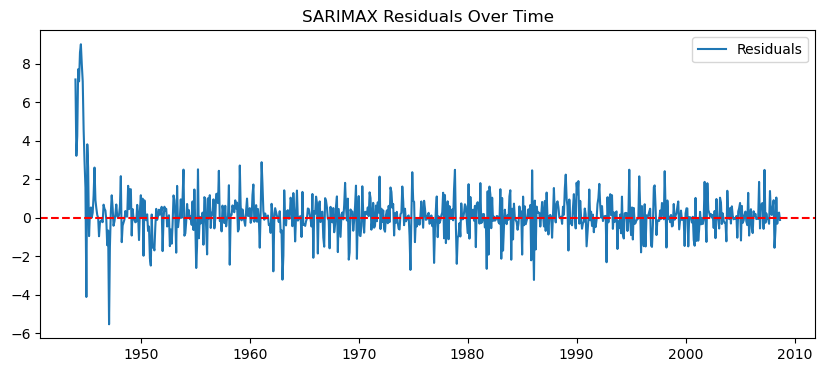

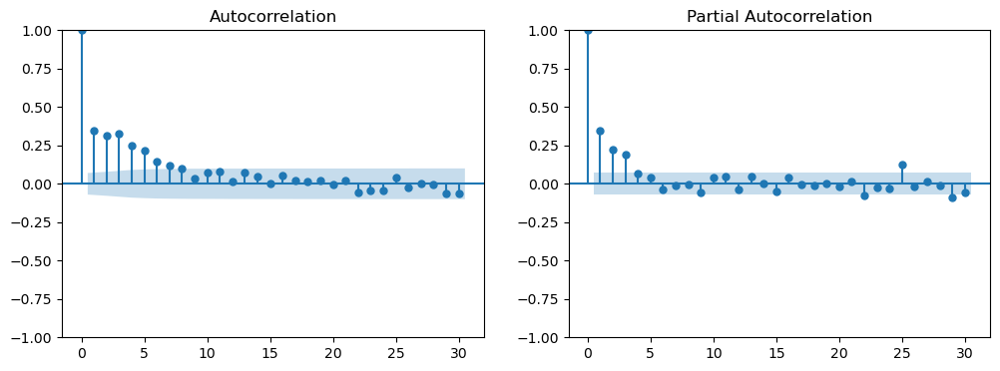

In [277]:
#inspect residuals
plt.figure(figsize=(10, 4))
plt.plot(sarimax_result.resid, label="Residuals")
plt.axhline(0, linestyle="--", color="red")
plt.title("SARIMAX Residuals Over Time")
plt.legend()
plt.show()
#check ACF and PACF
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sm.graphics.tsa.plot_acf(sarimax_result.resid, lags=30, ax=ax[0])
sm.graphics.tsa.plot_pacf(sarimax_result.resid, lags=30, ax=ax[1])
plt.show()

In [278]:
# Define model names
models = ["RF", "XGBoost", "Holt-Winters", "SARIMA",  "SARIMAX"]

# Replace these with actual values
rmse_values = [rmse_rf_original, rmse_xgb_original, hw_rmse, SArmse,  sx_rmse]
mae_values = [mae_rf_original, mae_xgb_original, hw_mae, SAmae,  SX_mae]
r2_values = [RFr2, r2_xgb, hw_r2, SAr2,  sx_r2]

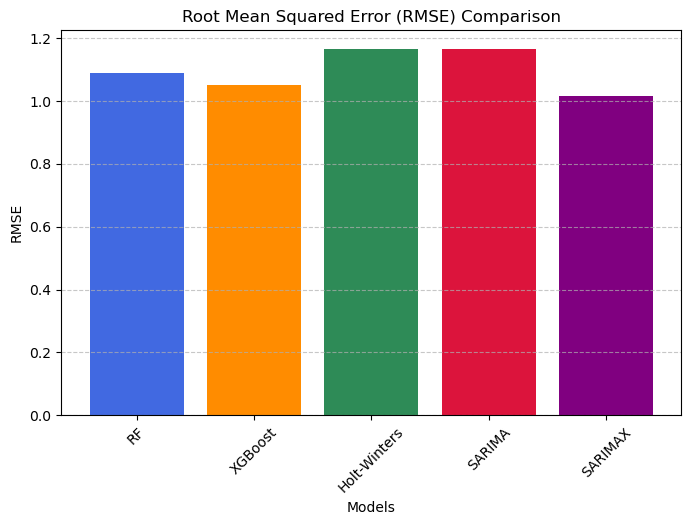

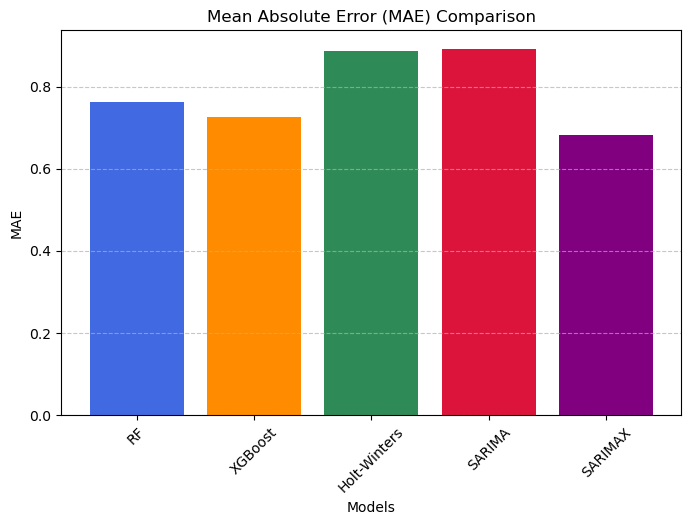

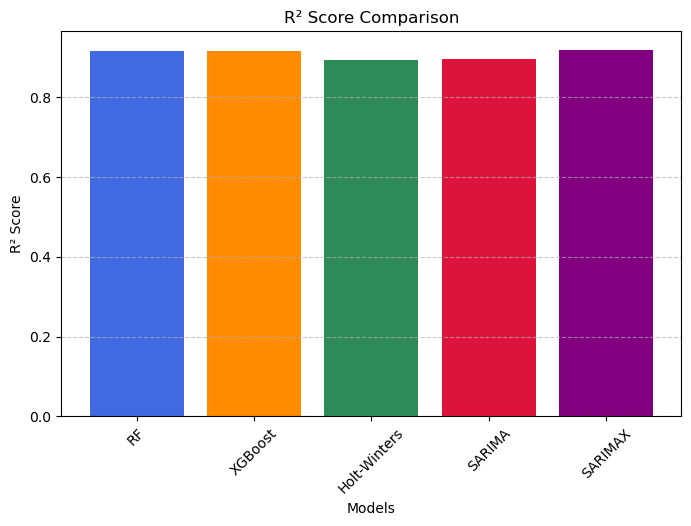

In [279]:
# Assign colors to each model
colors = ["royalblue", "darkorange", "seagreen", "crimson", "purple", "gold"]

# ✅ Create figure for RMSE
plt.figure(figsize=(8, 5))
plt.bar(models, rmse_values, color=colors)
plt.xlabel("Models")
plt.ylabel("RMSE")
plt.title("Root Mean Squared Error (RMSE) Comparison")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# ✅ Create figure for MAE
plt.figure(figsize=(8, 5))
plt.bar(models, mae_values, color=colors)
plt.xlabel("Models")
plt.ylabel("MAE")
plt.title("Mean Absolute Error (MAE) Comparison")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# ✅ Create figure for R²
plt.figure(figsize=(8, 5))
plt.bar(models, r2_values, color=colors)
plt.xlabel("Models")
plt.ylabel("R² Score")
plt.title("R² Score Comparison")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()